<a href="https://colab.research.google.com/github/shubhamiitshk/Data-Analytics-In-Building-Sciences/blob/main/Data_Analytics_In_Building_Sciences.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 100.5 MB/s eta 0:00:00


In [ ]:
pip install geodatasets

In [ ]:
pip install scikit-learn

Indoor CO2 Outliers:
                Timestamp  CO2  CO2_zscore
163   2023-01-02 16:30:00  844    3.091881
168   2023-01-02 17:45:00  861    3.218143
169   2023-01-02 18:00:00  967    4.005425
170   2023-01-02 18:15:00  934    3.760328
171   2023-01-02 18:30:00  875    3.322124
...                   ...  ...         ...
38726 2024-02-06 17:30:00  975    4.064842
38727 2024-02-06 17:45:00  913    3.604357
38728 2024-02-06 18:00:00  897    3.485522
38799 2024-02-07 11:45:00  880    3.359260
38800 2024-02-07 12:00:00  883    3.381541

[918 rows x 3 columns]
Merged Data Shape: (38945, 26)
        Date Time_indoor  CO2_indoor  Temp_indoor  Pressure_indoor  RH_indoor  \
0 2023-01-01    00:00:00         385         21.7             1010       63.5   
1 2023-01-01    00:15:00         387         21.7             1010       63.7   
2 2023-01-01    00:30:00         390         21.7             1010       63.8   
3 2023-01-01    00:45:00         389         21.7             1010       63.8   
4 2

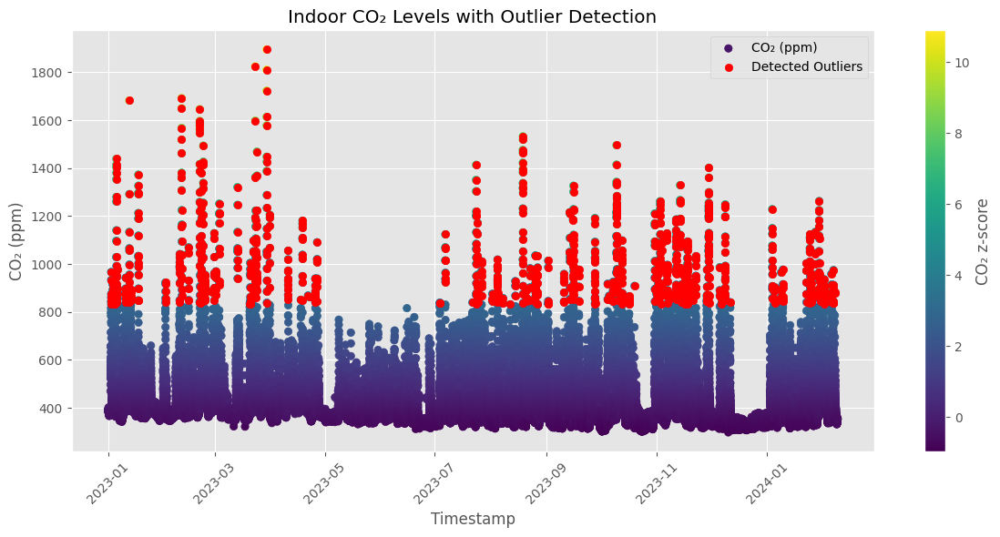

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler

# Set option to retain old downcasting behavior and suppress deprecation warnings
pd.set_option("future.no_silent_downcasting", True)

########################################
# 1. Load and Preprocess Indoor Data
########################################
indoor_file = 'Indoor-Air-Quality.xlsx'
# Read the indoor Excel file from the "PAoffice" sheet
indoor = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns to match the measurements
indoor.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Replace placeholder values ("###") with NaN and forward-fill missing values
indoor.replace("###", np.nan, inplace=True)
indoor.ffill(inplace=True)

# Convert measurement columns to numeric types
for col in ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor[col] = pd.to_numeric(indoor[col], errors='coerce')

# Create a unified Timestamp by concatenating Date and Time (both are cast to string)
indoor['Timestamp'] = pd.to_datetime(indoor['Date'].astype(str) + ' ' + indoor['Time'].astype(str))

########################################
# 2. Load and Preprocess Outdoor Data
########################################
outdoor_file = 'Outdoor-Air-Quality.xlsx'
# For the outdoor data, the first several rows contain summary information.
# We skip the first 8 rows so that the first row is a valid data record.
outdoor = pd.read_excel(outdoor_file,
                         sheet_name='OUTDOOR DATA - Air quality',
                         skiprows=8,
                         header=None)

# Manually set the column names after skipping non-data header rows
outdoor.columns = ['Timestamp', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Convert the Timestamp column to datetime; any parsing problems will yield NaT
outdoor['Timestamp'] = pd.to_datetime(outdoor['Timestamp'], errors='coerce')

# Convert the measurement columns to numeric types
for col in ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    outdoor[col] = pd.to_numeric(outdoor[col], errors='coerce')

# Forward-fill any missing data in the outdoor dataset
outdoor.ffill(inplace=True)

########################################
# 3. Load and Preprocess Energy Data
########################################
energy_file = 'ENERGYDATA.xlsx'
energy = pd.read_excel(energy_file, sheet_name='ENERGYDATA')

# Rename energy columns to make them more intuitive
energy.columns = ['Timestamp', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert the Timestamp column; invalid formats are coerced to NaT
energy['Timestamp'] = pd.to_datetime(energy['Timestamp'], errors='coerce')

# Convert energy consumption values to numeric (converting any "No CT" to NaN); then fill NaN with zero
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy[col] = pd.to_numeric(energy[col], errors='coerce')
energy.fillna(0, inplace=True)

########################################
# 4. Outlier Detection and Feature Engineering (Indoor)
########################################
# Compute the z-score of indoor CO2 values to detect outliers
indoor['CO2_zscore'] = zscore(indoor['CO2'])
# Identify rows where the absolute z-score exceeds 3
indoor_outliers = indoor[np.abs(indoor['CO2_zscore']) > 3]
print("Indoor CO2 Outliers:")
print(indoor_outliers[['Timestamp', 'CO2', 'CO2_zscore']])

# Create an occupancy indicator: if CO2 exceeds 800 ppm, mark as occupied (1); else, 0
indoor['Occupancy'] = (indoor['CO2'] > 800).astype(int)

########################################
# 5. Normalize Selected Features
########################################
scaler = MinMaxScaler()
# Normalize Temperature and Relative Humidity in both indoor and outdoor datasets
indoor[['Temp_norm', 'RH_norm']] = scaler.fit_transform(indoor[['Temp', 'RH']])
outdoor[['Temp_norm', 'RH_norm']] = scaler.fit_transform(outdoor[['Temp', 'RH']])

########################################
# 6. Merge Datasets on Timestamp
########################################
# Sort the dataframes by Timestamp before merging
indoor.sort_values('Timestamp', inplace=True)
outdoor.sort_values('Timestamp', inplace=True)
energy.sort_values('Timestamp', inplace=True)

# Use an asof merge to join datasets with near timestamps
merged_data = pd.merge_asof(indoor, outdoor, on='Timestamp', suffixes=('_indoor', '_outdoor'))
merged_data = pd.merge_asof(merged_data, energy, on='Timestamp')
print("Merged Data Shape:", merged_data.shape)
print(merged_data.head())

########################################
# 7. Save and Visualize Results
########################################
# Save the merged, processed dataset to an Excel file for further analysis
merged_data.to_excel('Merged_Processed_Data.xlsx', index=False)

# Example Visualization: Plot indoor CO2 values (colored by z-score) and highlight outliers
plt.figure(figsize=(12, 6))
scatter = plt.scatter(indoor['Timestamp'], indoor['CO2'],
                      c=indoor['CO2_zscore'], cmap='viridis', label='CO₂ (ppm)')
plt.colorbar(scatter, label='CO₂ z-score')
plt.scatter(indoor_outliers['Timestamp'], indoor_outliers['CO2'],
            color='red', label='Detected Outliers')
plt.xlabel('Timestamp')
plt.ylabel('CO₂ (ppm)')
plt.title('Indoor CO₂ Levels with Outlier Detection')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Indoor Data Summary Statistics:
                CO2          Temp      Pressure            RH      DewPoint  \
count  38945.000000  38945.000000  38945.000000  38945.000000  38945.000000   
mean     427.707767     27.360108   1002.582231     64.796631     19.953694   
std      134.642182      4.416130      6.138364      9.553810      4.365712   
min      298.000000     16.700000    984.000000     31.800000      7.900000   
25%      355.000000     24.300000    997.000000     58.500000     16.300000   
50%      382.000000     28.500000   1003.000000     67.000000     20.600000   
75%      439.000000     30.600000   1008.000000     71.900000     23.800000   
max     1895.000000     35.900000   1016.000000     85.700000     27.700000   

        AbsHumidity  
count  38945.000000  
mean      17.293108  
std        4.253178  
min        7.900000  
25%       13.500000  
50%       17.500000  
75%       21.100000  
max       26.400000  


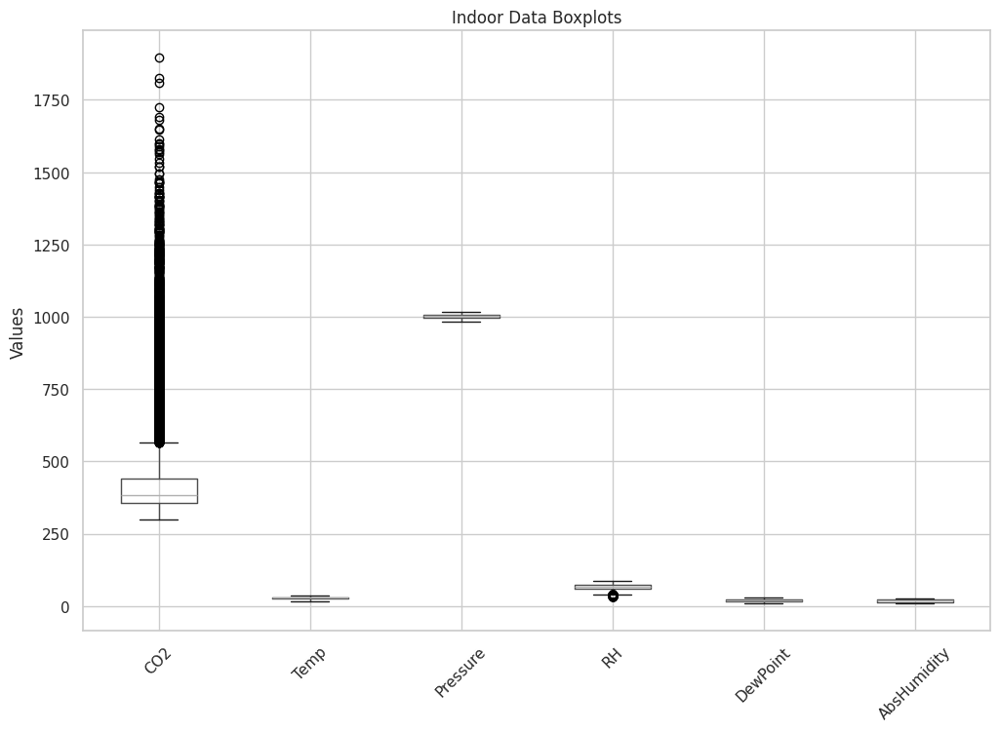

Outdoor Data Summary Statistics:
                CO2          Temp      Pressure            RH      DewPoint  \
count  30967.000000  31012.000000  31012.000000  31012.000000  31012.000000   
mean     393.308393     27.186766   1002.251290     72.979402     21.500938   
std       70.708708      5.051242      5.990589     14.379603      4.818890   
min      163.000000     13.200000    984.000000     17.800000      4.000000   
25%      386.000000     24.200000    997.000000     66.000000     18.100000   
50%      411.000000     28.000000   1002.000000     77.100000     22.300000   
75%      430.000000     30.400000   1008.000000     83.200000     25.800000   
max      573.000000     41.300000   1016.000000     94.200000     29.000000   

        AbsHumidity  
count  31012.000000  
mean      19.130266  
std        4.994098  
min        6.000000  
25%       15.100000  
50%       19.400000  
75%       23.900000  
max       28.400000  


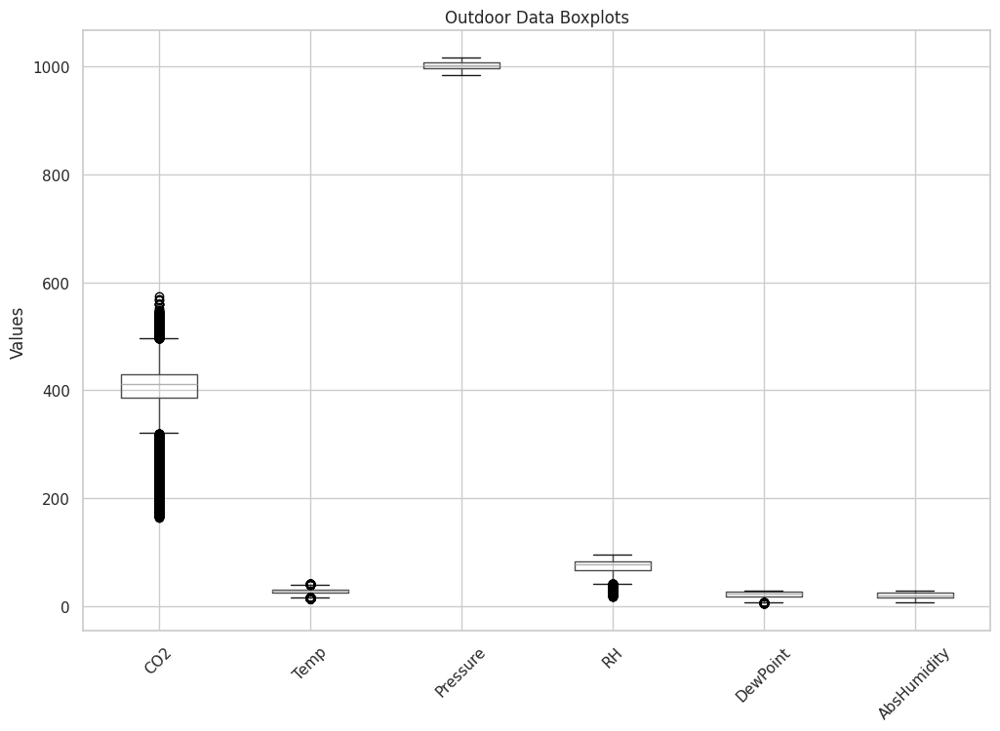

Energy Data Summary Statistics:
           Computer     Plug_Load       AC_Load     Light_Fan
count  31274.000000  31274.000000  31274.000000  31274.000000
mean       0.008134      0.000456      0.030207      0.006188
std        0.013244      0.003579      0.146507      0.020769
min        0.000000      0.000000      0.000000      0.000000
25%        0.000000      0.000000      0.000000      0.000000
50%        0.000000      0.000000      0.000000      0.000000
75%        0.016700      0.000000      0.000100      0.000000
max        0.153600      0.156800      1.018000      0.105100


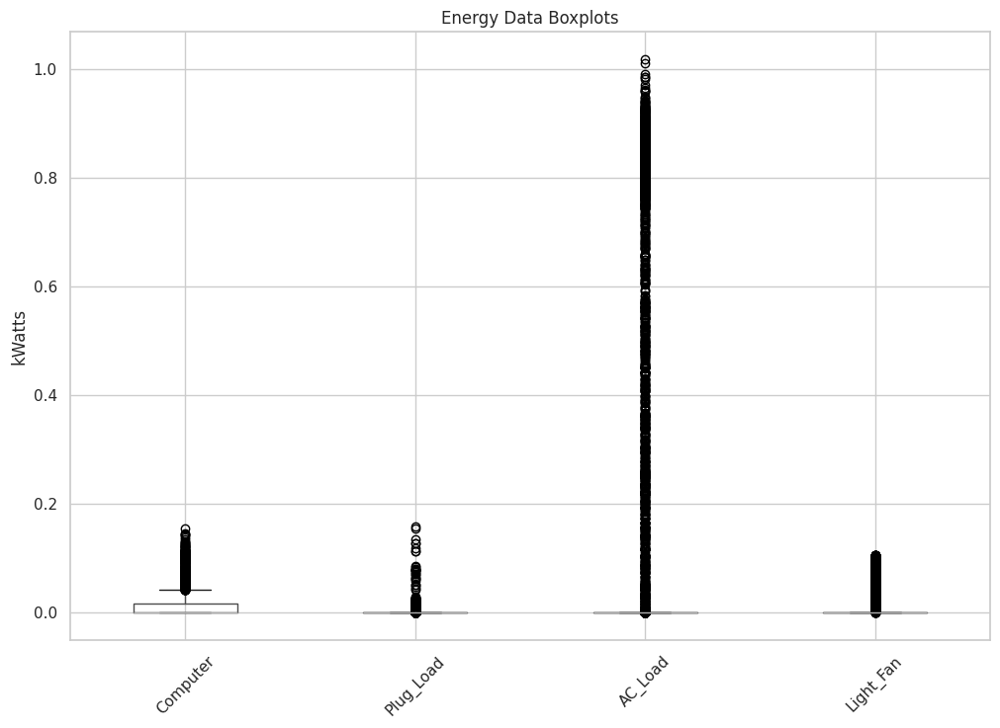

Processed datasets have been saved and are ready for further analysis.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Process Indoor-Air-Quality Data (Sheet: PAoffice)
########################################
# Load the indoor data file and sheet
indoor_file = 'Indoor-Air-Quality.xlsx'
indoor = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns to meaningful names (assumes first two are Date and Time followed by sensor measurements)
indoor.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column from Date and Time.
# (Cast both columns to string to avoid concatenation errors.)
indoor['Datetime'] = pd.to_datetime(indoor['Date'].astype(str) + " " + indoor['Time'].astype(str), errors='coerce')

# Replace placeholder values (e.g. "###") with NaN and fill forward (or drop if preferred)
indoor.replace("###", np.nan, inplace=True)
indoor.ffill(inplace=True)  # or use dropna() if you wish to remove these rows

# Convert sensor measurement columns into numeric type
indoor_numeric_cols = ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
indoor[indoor_numeric_cols] = indoor[indoor_numeric_cols].apply(pd.to_numeric, errors='coerce')

# Print summary statistics for indoor data
print("Indoor Data Summary Statistics:")
print(indoor[indoor_numeric_cols].describe())

# Plot boxplots for all numeric variables to inspect outliers
plt.figure(figsize=(12, 8))
indoor[indoor_numeric_cols].boxplot()
plt.title("Indoor Data Boxplots")
plt.xticks(rotation=45)
plt.ylabel("Values")
plt.show()

########################################
# 2. Process Outdoor-Air-Quality Data (Sheet: OUTDOOR DATA - Air quality)
########################################
# Load the outdoor data and skip header rows that do not contain measurement records.
outdoor_file = 'Outdoor-Air-Quality.xlsx'
# Based on inspection, skip the first several rows (change skiprows if needed)
outdoor = pd.read_excel(outdoor_file, sheet_name='OUTDOOR DATA - Air quality', skiprows=8, header=None)

# Manually assign column names as observed in the file description.
outdoor.columns = ['Timestamp', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Convert the timestamp column to datetime.
# Errors are coerced to NaT so that header or summary lines are dropped.
outdoor['Datetime'] = pd.to_datetime(outdoor['Timestamp'], errors='coerce')
# Drop rows where the datetime conversion failed.
outdoor = outdoor.dropna(subset=['Datetime'])

# Convert measurement columns to numeric
outdoor_numeric_cols = ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
outdoor[outdoor_numeric_cols] = outdoor[outdoor_numeric_cols].apply(pd.to_numeric, errors='coerce')

# Print summary statistics for outdoor data
print("Outdoor Data Summary Statistics:")
print(outdoor[outdoor_numeric_cols].describe())

# Plot boxplots for outdoor data
plt.figure(figsize=(12, 8))
outdoor[outdoor_numeric_cols].boxplot()
plt.title("Outdoor Data Boxplots")
plt.xticks(rotation=45)
plt.ylabel("Values")
plt.show()

########################################
# 3. Process Energy Data (Sheet: ENERGYDATA)
########################################
energy_file = 'ENERGYDATA.xlsx'
energy = pd.read_excel(energy_file, sheet_name='ENERGYDATA')

# Rename columns based on the file’s header
energy.columns = ['Timestamp', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert the Timestamp to datetime
energy['Datetime'] = pd.to_datetime(energy['Timestamp'], errors='coerce')

# For energy data, placeholders like "No CT" should be handled.
# Replace "No CT" with NaN, convert columns to numeric, and then fill missing values with 0.
energy[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']] = energy[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].replace("No CT", np.nan)
energy[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']] = energy[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].apply(pd.to_numeric, errors='coerce')
energy.fillna(0, inplace=True)

energy_numeric_cols = ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
print("Energy Data Summary Statistics:")
print(energy[energy_numeric_cols].describe())

# Plot boxplots for energy data
plt.figure(figsize=(12, 8))
energy[energy_numeric_cols].boxplot()
plt.title("Energy Data Boxplots")
plt.xticks(rotation=45)
plt.ylabel("kWatts")
plt.show()

########################################
# 4. Save Processed Datasets for Analysis
########################################
indoor.to_csv("Processed_Indoor_Data.csv", index=False)
outdoor.to_csv("Processed_Outdoor_Data.csv", index=False)
energy.to_csv("Processed_Energy_Data.csv", index=False)

print("Processed datasets have been saved and are ready for further analysis.")


Correlation Matrix Between Energy, Indoor and Outdoor Air Quality:
                     CO2_outdoor  Temp_outdoor  RH_outdoor  Pressure_outdoor  \
CO2_outdoor             1.000000      0.723982   -0.026713         -0.514663   
Temp_outdoor            0.723982      1.000000   -0.166406         -0.750553   
RH_outdoor             -0.026713     -0.166406    1.000000         -0.256793   
Pressure_outdoor       -0.514663     -0.750553   -0.256793          1.000000   
DewPoint_outdoor        0.674720      0.855993    0.362426         -0.831081   
AbsHumidity_outdoor     0.631334      0.830699    0.397256         -0.848410   
Total_Energy            0.055430      0.073781    0.010482         -0.077147   

                     DewPoint_outdoor  AbsHumidity_outdoor  Total_Energy  
CO2_outdoor                  0.674720             0.631334      0.055430  
Temp_outdoor                 0.855993             0.830699      0.073781  
RH_outdoor                   0.362426             0.397256      0.0

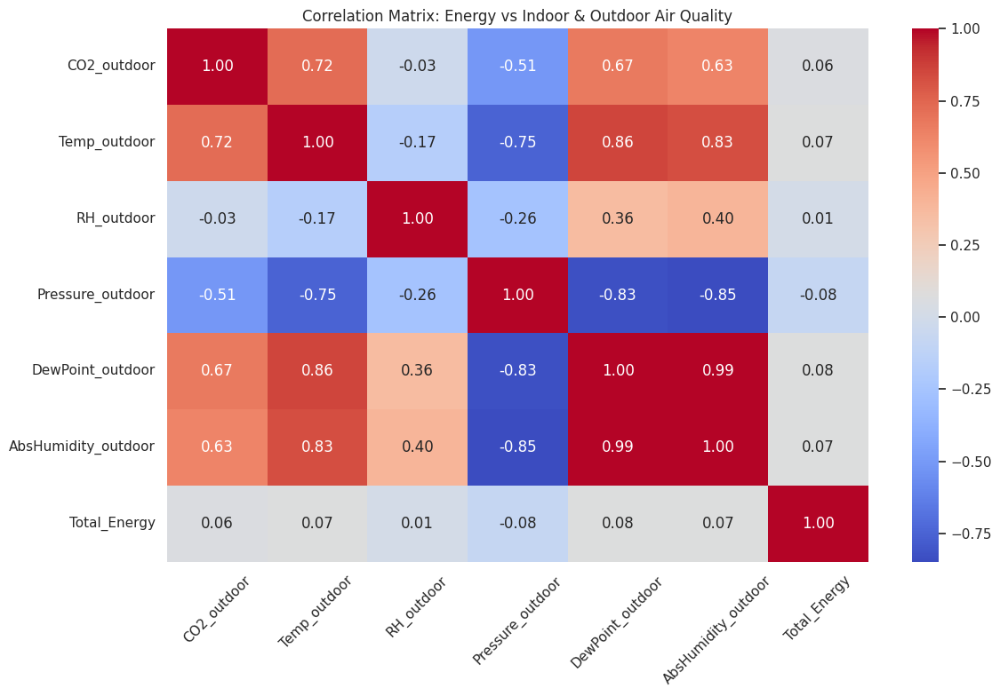

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Load the processed datasets
try:
    indoor_data = pd.read_csv('Processed_Indoor_Data.csv')
    outdoor_data = pd.read_csv('Processed_Outdoor_Data.csv')
    energy_data = pd.read_csv('Processed_Energy_Data.csv')
except FileNotFoundError as e:
    print("One or more processed CSV files were not found.")
    raise e

# 2. Ensure that the datetime column is parsed correctly.
# In our processing script we created a unified column called 'Datetime'
indoor_data['Datetime'] = pd.to_datetime(indoor_data['Datetime'], errors='coerce')
outdoor_data['Datetime'] = pd.to_datetime(outdoor_data['Datetime'], errors='coerce')
energy_data['Datetime'] = pd.to_datetime(energy_data['Datetime'], errors='coerce')

# 3. Sort each DataFrame by its datetime for an asof merge
indoor_data.sort_values('Datetime', inplace=True)
outdoor_data.sort_values('Datetime', inplace=True)
energy_data.sort_values('Datetime', inplace=True)

# 4. Merge datasets using the asof join to match nearby timestamps
# First, merge indoor and outdoor data (adding suffixes for overlapping column names)
merged_df = pd.merge_asof(indoor_data, outdoor_data, on='Datetime', suffixes=('_indoor', '_outdoor'))
# Then, merge the energy data
merged_df = pd.merge_asof(merged_df, energy_data, on='Datetime')

# 5. Create a Total_Energy column by summing energy columns (if desired)
# Adjust the column names as necessary. Here, we assume these names from the processing step.
merged_df['Total_Energy'] = (
    merged_df['Computer'] +
    merged_df['Plug_Load'] +
    merged_df['AC_Load'] +
    merged_df['Light_Fan']
)

# 6. Select variables for correlation.
# From indoor: we use CO2, Temp, RH, Pressure, DewPoint, AbsHumidity (if available)
# From outdoor: we use CO2, Temp, RH, Pressure, DewPoint, AbsHumidity (we assume these got the suffix _outdoor)
# From energy: we use Total_Energy (or you can pick individual load columns)
cols_to_correlate = [
    'CO2', 'Temp', 'RH', 'Pressure', 'DewPoint', 'AbsHumidity',            # Indoor variables (if available)
    'CO2_outdoor', 'Temp_outdoor', 'RH_outdoor', 'Pressure_outdoor',
    'DewPoint_outdoor', 'AbsHumidity_outdoor',
    'Total_Energy'
]

# Some columns might not exist if naming is different. Keep only those present.
cols_present = [col for col in cols_to_correlate if col in merged_df.columns]
corr_matrix = merged_df[cols_present].corr()

# 7. Print the correlation matrix (mean, min, max, std are inherent in describe(), but here we focus on correlation)
print("Correlation Matrix Between Energy, Indoor and Outdoor Air Quality:")
print(corr_matrix)

# 8. Visualize the correlation matrix with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix: Energy vs Indoor & Outdoor Air Quality')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


=== Daily Energy Data: Summary Statistics ===
         Computer   Plug_Load     AC_Load   Light_Fan
count  327.000000  327.000000  327.000000  327.000000
mean     0.008164    0.000455    0.030094    0.006165
std      0.010997    0.002329    0.052804    0.008829
min      0.000000    0.000000    0.000000    0.000000
25%      0.000000    0.000002    0.000012    0.000000
50%      0.000000    0.000017    0.000064    0.001939
75%      0.017798    0.000043    0.048323    0.009493
max      0.044584    0.017115    0.317935    0.055490

=== Daily Indoor Air Quality: Summary Statistics ===
              CO2        Temp     Pressure          RH    DewPoint  \
count  405.000000  405.000000   405.000000  405.000000  405.000000   
mean   427.452879   27.352930  1002.595556   64.780725   19.943066   
std     75.809923    4.340915     5.998432    8.831288    4.052134   
min    315.375000   17.325000   986.187500   38.587629    9.334375   
25%    367.447917   24.443750   997.051546   58.865979   16.5406

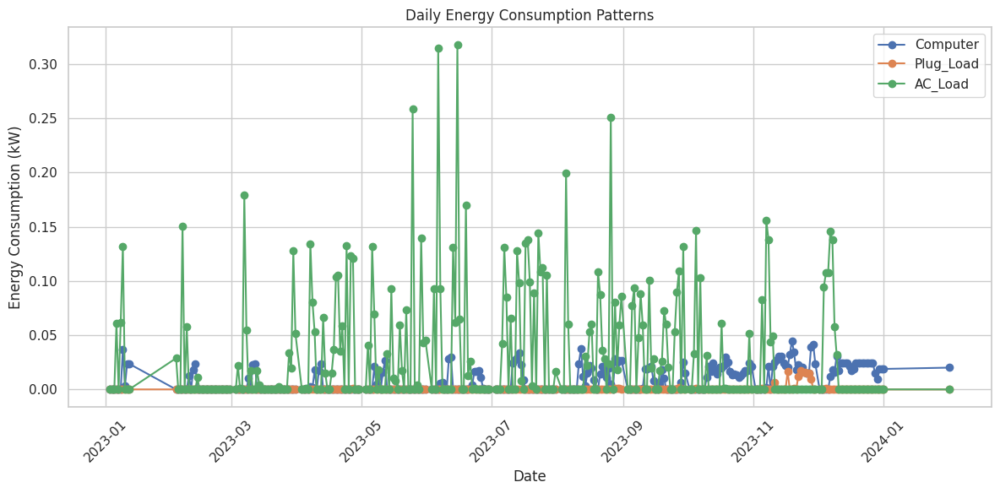

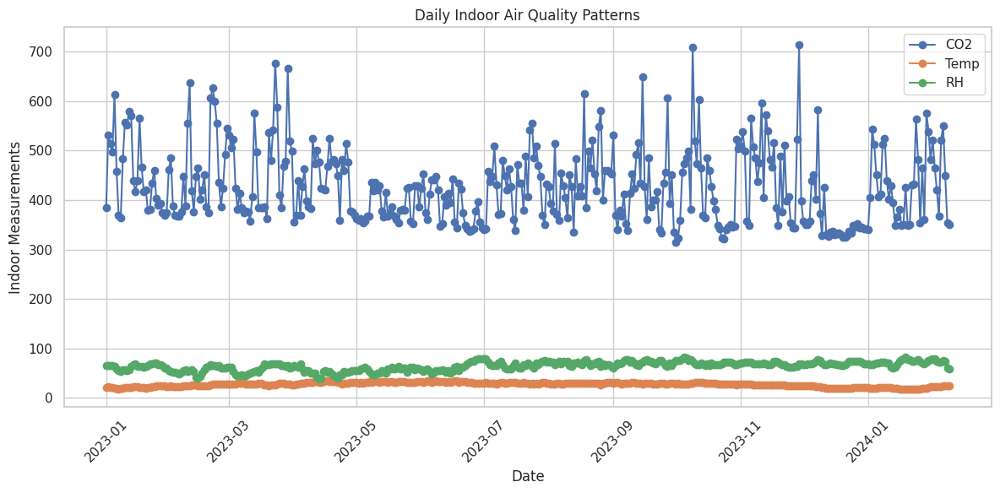

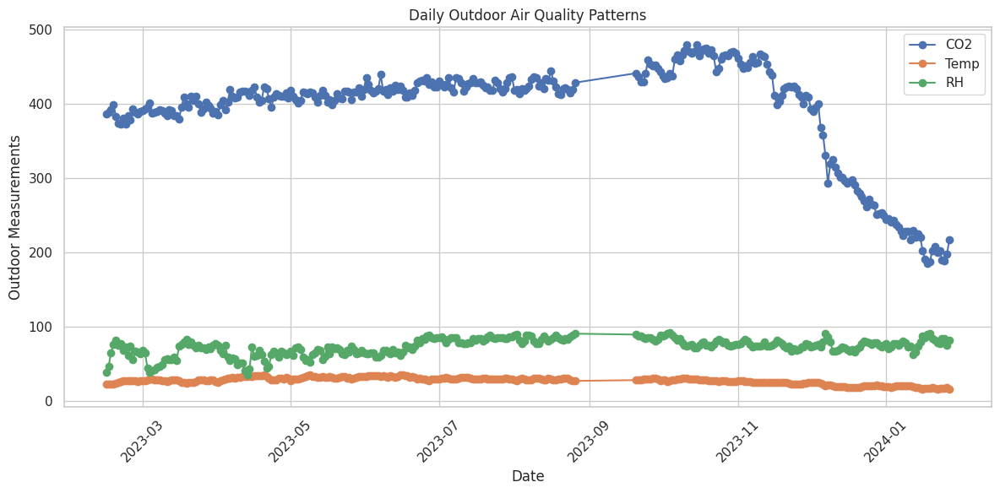

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

########################################
# 1. Load Processed Datasets
########################################
# Replace these file names with the correct paths if needed
energy_data = pd.read_csv('Processed_Energy_Data.csv')
indoor_data = pd.read_csv('Processed_Indoor_Data.csv')
outdoor_data = pd.read_csv('Processed_Outdoor_Data.csv')

########################################
# 2. Convert and Create Date Columns
########################################
# Ensure the 'Datetime' column is parsed as datetime.
# (Adjust the column name if your CSV uses a different one.)
energy_data['Datetime'] = pd.to_datetime(energy_data['Datetime'], errors='coerce')
indoor_data['Datetime'] = pd.to_datetime(indoor_data['Datetime'], errors='coerce')
outdoor_data['Datetime'] = pd.to_datetime(outdoor_data['Datetime'], errors='coerce')

# Create a new Date column (date only) for grouping.
energy_data['Date'] = energy_data['Datetime'].dt.date
indoor_data['Date'] = indoor_data['Datetime'].dt.date
outdoor_data['Date'] = outdoor_data['Datetime'].dt.date

########################################
# 3. Aggregate Data by Date Using Only Numeric Columns
########################################
# We use mean(numeric_only=True) so that only numeric columns are aggregated.
daily_energy  = energy_data.groupby('Date').mean(numeric_only=True)
daily_indoor  = indoor_data.groupby('Date').mean(numeric_only=True)
daily_outdoor = outdoor_data.groupby('Date').mean(numeric_only=True)

########################################
# 4. Print Summary Statistics
########################################
print("=== Daily Energy Data: Summary Statistics ===")
print(daily_energy.describe())

print("\n=== Daily Indoor Air Quality: Summary Statistics ===")
print(daily_indoor.describe())

print("\n=== Daily Outdoor Air Quality: Summary Statistics ===")
print(daily_outdoor.describe())

########################################
# 5. Visualize Daily Patterns
########################################
# Define a function to easily plot a set of columns on a time series graph.
def plot_daily_patterns(df, title, y_label, col_list):
    plt.figure(figsize=(12, 6))
    for col in col_list:
        # Plot the column only if it exists in the aggregated DataFrame.
        if col in df.columns:
            plt.plot(df.index, df[col], marker='o', label=col)
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel(y_label)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# For Energy data, typical columns might be: Computer, Plug_Load, AC_Load, and light + fan (adjust as needed)
energy_cols = ['Computer', 'Plug_Load', 'AC_Load', 'light + fan']
plot_daily_patterns(daily_energy, "Daily Energy Consumption Patterns",
                      "Energy Consumption (kW)", energy_cols)

# For Indoor Air Quality, we might want to look at CO2, Temp and RH (adjust as available)
indoor_cols = ['CO2', 'Temp', 'RH']
plot_daily_patterns(daily_indoor, "Daily Indoor Air Quality Patterns",
                      "Indoor Measurements", indoor_cols)

# For Outdoor Air Quality, we might also consider CO2, Temp and RH (adjust as available)
outdoor_cols = ['CO2', 'Temp', 'RH']
plot_daily_patterns(daily_outdoor, "Daily Outdoor Air Quality Patterns",
                      "Outdoor Measurements", outdoor_cols)


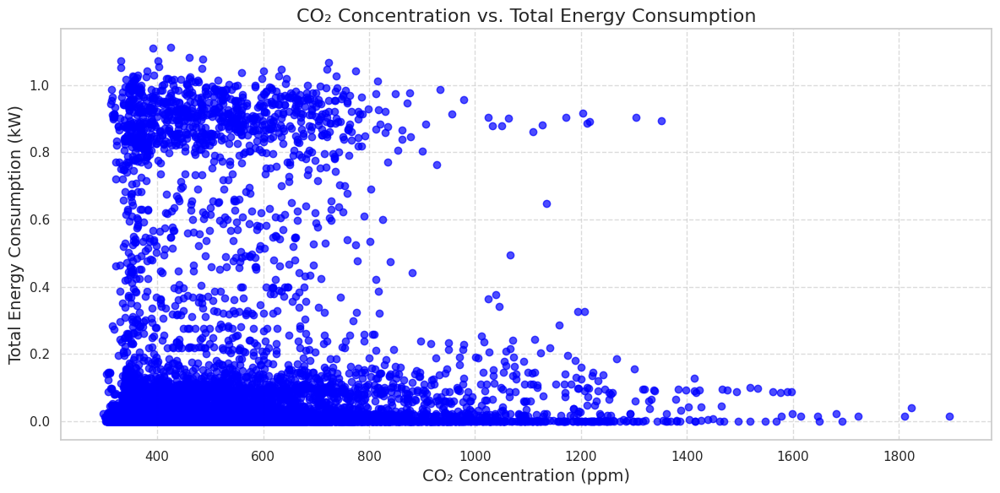

Plot generated and saved as 'CO2_vs_Energy_Plot.png'.


<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

########################################
# 1. Load and Preprocess Indoor Data
########################################
# Load the processed Indoor-Air-Quality CSV file
indoor_data = pd.read_csv('Processed_Indoor_Data.csv')

# Ensure the datetime column is parsed correctly.
# (Assuming the indoor file has a column named "Datetime".)
indoor_data['Datetime'] = pd.to_datetime(indoor_data['Datetime'], errors='coerce')

# For consistency, rename the CO2 column to "CO2" (if not already)
# (For example, if the column header contains units, you might want to change it.)
if 'testo 160 IAQ_51616142 [ppm]' in indoor_data.columns:
    indoor_data = indoor_data.rename(columns={'testo 160 IAQ_51616142 [ppm]': 'CO2'})

########################################
# 2. Load and Preprocess Energy Data
########################################
# Load the processed ENERGYDATA CSV file
energy_data = pd.read_csv('Processed_Energy_Data.csv')

# Ensure the datetime column is parsed as DateTime.
# Depending on your processed file, it might be named "Datetime" or "Time Bucket (Asia/Calcutta)".
if 'Datetime' not in energy_data.columns:
    # If the original column is titled differently, rename it.
    energy_data = energy_data.rename(columns={'Time Bucket (Asia/Calcutta)': 'Datetime'})
energy_data['Datetime'] = pd.to_datetime(energy_data['Datetime'], errors='coerce')

# Rename energy columns for easier use.
# The original energy file columns might be similar to:
# "Computer - kWatts", "Plug Load (kWatts)", "Air Conditioner-kWatts", "light + fan - kWatts"
# We rename these to standard names.
rename_dict = {
    'Computer - kWatts': 'Computer',
    'Plug Load (kWatts)': 'Plug_Load',
    'Air Conditioner-kWatts': 'AC_Load',
    'light + fan - kWatts': 'Light_Fan',
    'Light + fan': 'Light_Fan'  # In case the column appears with this name.
}
energy_data = energy_data.rename(columns=rename_dict)

########################################
# 3. Merge Datasets on Datetime
########################################
# Sort both DataFrames by their Datetime before an asof merge.
indoor_data.sort_values('Datetime', inplace=True)
energy_data.sort_values('Datetime', inplace=True)

# Merge data using an asof merge (nearest matching timestamp)
merged_data = pd.merge_asof(indoor_data, energy_data, on='Datetime', tolerance=pd.Timedelta('5min'))

########################################
# 4. Compute Total Energy Consumption
########################################
# For total energy, sum up the energy subcomponents.
# Make sure to use the renamed columns.
merged_data['Total_Energy'] = (
    merged_data['Computer'] +
    merged_data['Plug_Load'] +
    merged_data['AC_Load'] +
    merged_data['Light_Fan']
)

########################################
# 5. Plot CO2 vs Total Energy Consumption
########################################
plt.figure(figsize=(12, 6))
plt.scatter(merged_data['CO2'], merged_data['Total_Energy'], alpha=0.7, color='blue')
plt.title('CO₂ Concentration vs. Total Energy Consumption', fontsize=16)
plt.xlabel('CO₂ Concentration (ppm)', fontsize=14)
plt.ylabel('Total Energy Consumption (kW)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Optionally, save the plot
plt.savefig('CO2_vs_Energy_Plot.png')

print("Plot generated and saved as 'CO2_vs_Energy_Plot.png'.")


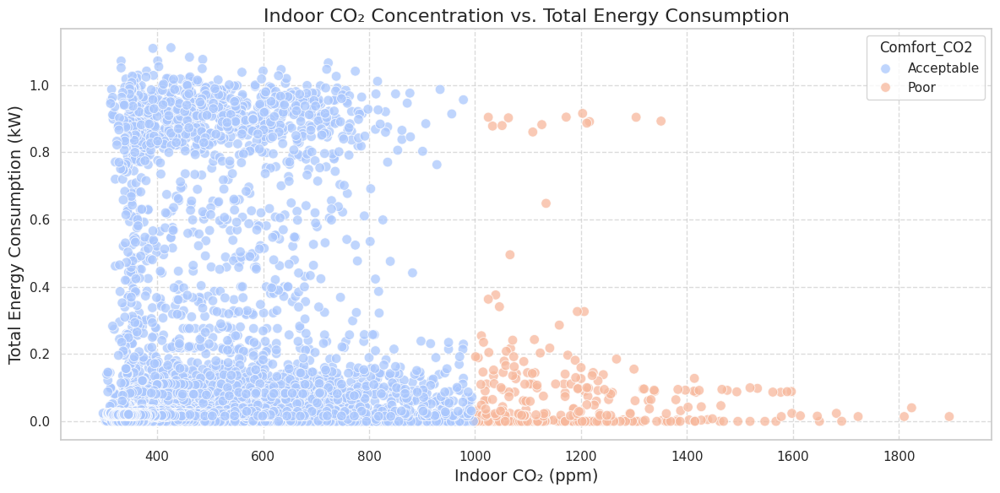

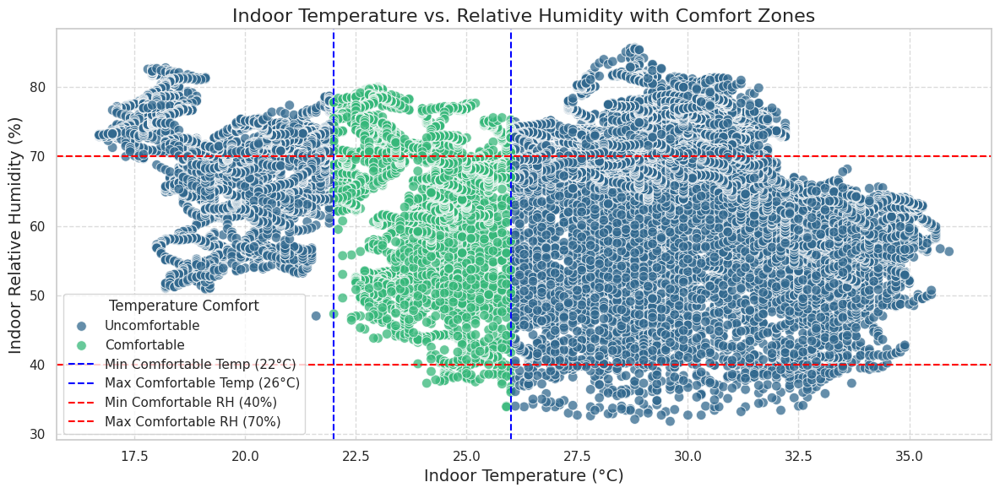

Merged comfort analysis data saved to 'Comfort_Analysis_Data.csv'.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Data
########################################
indoor_file = 'Indoor-Air-Quality.xlsx'
indoor_df = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns for clarity.
# Expected order: Date, Time, CO2 (ppm), Temperature, Pressure, RH, DewPoint, Absolute Humidity.
indoor_df.columns = ['Date', 'Time', 'CO2_indoor', 'Temp_indoor',
                       'Pressure_indoor', 'RH_indoor', 'DewPoint_indoor', 'AbsHumidity_indoor']

# Create a unified Datetime column.
# Both Date and Time are explicitly cast to string to avoid concatenation errors.
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str),
                                        errors='coerce')

# Convert key indoor columns to numeric.
indoor_df['CO2_indoor'] = pd.to_numeric(indoor_df['CO2_indoor'], errors='coerce')
indoor_df['Temp_indoor'] = pd.to_numeric(indoor_df['Temp_indoor'], errors='coerce')
indoor_df['RH_indoor'] = pd.to_numeric(indoor_df['RH_indoor'], errors='coerce')

########################################
# 2. Load and Preprocess Outdoor Data
########################################
outdoor_file = 'Outdoor-Air-Quality.xlsx'
# Skip header rows that contain summary information; adjust 'skiprows' as needed.
outdoor_df = pd.read_excel(outdoor_file, sheet_name='OUTDOOR DATA - Air quality', skiprows=8, header=None)

# Manually assign column names based on file layout.
outdoor_df.columns = ['Datetime', 'Time', 'CO2_outdoor', 'Temp_outdoor',
                        'Pressure_outdoor', 'RH_outdoor', 'DewPoint_outdoor', 'AbsHumidity_outdoor']

# Convert the outdoor Datetime column.
outdoor_df['Datetime'] = pd.to_datetime(outdoor_df['Datetime'], errors='coerce')
# Convert key outdoor columns to numeric.
outdoor_df['CO2_outdoor'] = pd.to_numeric(outdoor_df['CO2_outdoor'], errors='coerce')
outdoor_df['Temp_outdoor'] = pd.to_numeric(outdoor_df['Temp_outdoor'], errors='coerce')
outdoor_df['RH_outdoor'] = pd.to_numeric(outdoor_df['RH_outdoor'], errors='coerce')

########################################
# 3. Load and Preprocess Energy Data
########################################
energy_file = 'ENERGYDATA.xlsx'
energy_df = pd.read_excel(energy_file, sheet_name='ENERGYDATA')

# Rename energy data columns for clarity.
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert all energy-related columns to numeric. Non-numeric entries become NaN, then fill with 0.
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

########################################
# 4. Sort and Merge the Datasets
########################################
indoor_df.sort_values('Datetime', inplace=True)
outdoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)

# Merge indoor and outdoor datasets using an asof merge with a tolerance of 5 minutes.
merged_df = pd.merge_asof(indoor_df, outdoor_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))

# Merge the resulting dataset with the energy data.
merged_df = pd.merge_asof(merged_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))

########################################
# 5. Compute Total Energy Consumption
########################################
merged_df['Total_Energy'] = (merged_df['Computer'] +
                             merged_df['Plug_Load'] +
                             merged_df['AC_Load'] +
                             merged_df['Light_Fan'])

########################################
# 6. Compute Comfort Indicators
########################################
# Define simple thresholds:
# - Indoor CO₂ below 1000 ppm is "Acceptable"
# - Indoor temperature between 22°C and 26°C is "Comfortable"
# - Indoor relative humidity between 40% and 70% is "Comfortable"
merged_df['Comfort_CO2'] = merged_df['CO2_indoor'].apply(
    lambda x: 'Acceptable' if (not pd.isna(x) and x < 1000) else 'Poor'
)
merged_df['Comfort_Temp'] = merged_df['Temp_indoor'].apply(
    lambda x: 'Comfortable' if (not pd.isna(x) and 22 <= x <= 26) else 'Uncomfortable'
)
merged_df['Comfort_RH'] = merged_df['RH_indoor'].apply(
    lambda x: 'Comfortable' if (not pd.isna(x) and 40 <= x <= 70) else 'Uncomfortable'
)

########################################
# 7. Visualization
########################################
# Plot 1: Indoor CO₂ vs. Total Energy Consumption colored by CO₂ Comfort indicator.
plt.figure(figsize=(12, 6))
sns.scatterplot(data=merged_df, x='CO2_indoor', y='Total_Energy',
                hue='Comfort_CO2', palette='coolwarm', s=70, alpha=0.75)
plt.title('Indoor CO₂ Concentration vs. Total Energy Consumption', fontsize=16)
plt.xlabel('Indoor CO₂ (ppm)', fontsize=14)
plt.ylabel('Total Energy Consumption (kW)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot 2: Indoor Temperature vs. Relative Humidity with comfort boundaries.
plt.figure(figsize=(12, 6))
sns.scatterplot(data=merged_df, x='Temp_indoor', y='RH_indoor',
                hue='Comfort_Temp', palette='viridis', s=70, alpha=0.75)
plt.axvline(22, color='blue', linestyle='--', label='Min Comfortable Temp (22°C)')
plt.axvline(26, color='blue', linestyle='--', label='Max Comfortable Temp (26°C)')
plt.axhline(40, color='red', linestyle='--', label='Min Comfortable RH (40%)')
plt.axhline(70, color='red', linestyle='--', label='Max Comfortable RH (70%)')
plt.title('Indoor Temperature vs. Relative Humidity with Comfort Zones', fontsize=16)
plt.xlabel('Indoor Temperature (°C)', fontsize=14)
plt.ylabel('Indoor Relative Humidity (%)', fontsize=14)
plt.legend(title='Temperature Comfort')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

########################################
# 8. Save the Merged Dataset for Further Analysis
########################################
merged_df.to_csv("Comfort_Analysis_Data.csv", index=False)
print("Merged comfort analysis data saved to 'Comfort_Analysis_Data.csv'.")




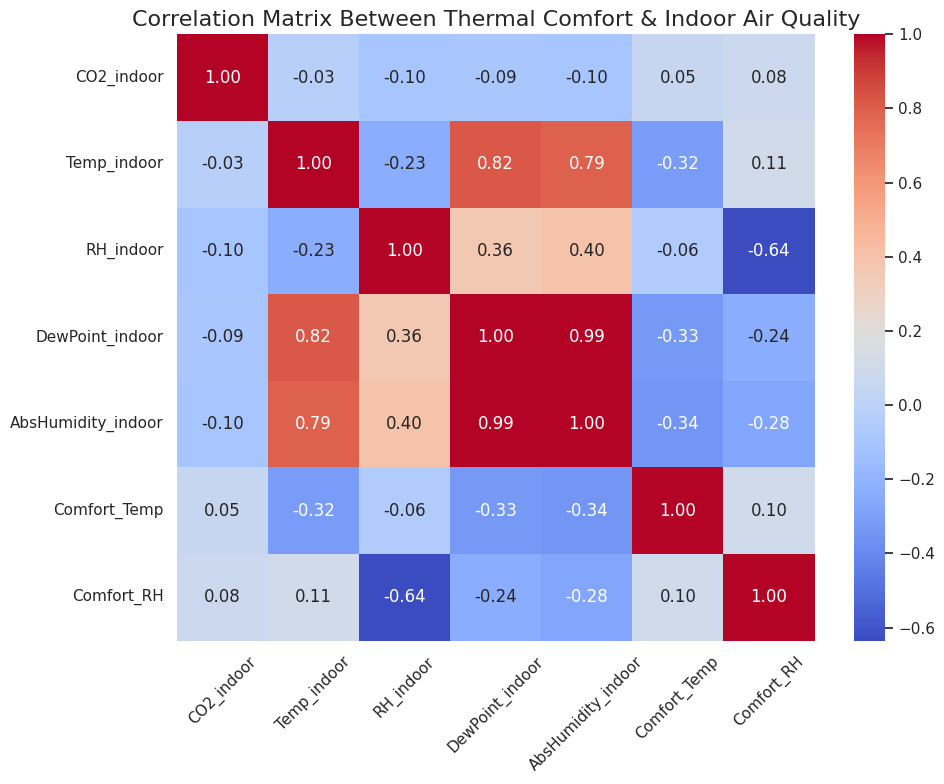

Processed data and correlation matrix have been saved.


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set a clean plotting style
sns.set(style='whitegrid')

########################################
# 1. Load and Preprocess Indoor Data
########################################
# Load the indoor air quality data from the Excel file.
# Based on the provided sample, the file has a sheet "PAoffice"
# where the first column is Date and the second is Time.
# The remaining columns (in order) are:
# CO₂ (ppm), Temperature (°C), Pressure (mbar), Relative Humidity (%RH),
# Dew Point (°C td) and Absolute Humidity (g/m³).

df = pd.read_excel("Indoor-Air-Quality.xlsx", sheet_name="PAoffice")

# Rename columns for clarity
df.columns = ['Date', 'Time', 'CO2_indoor', 'Temp_indoor', 'Pressure_indoor',
              'RH_indoor', 'DewPoint_indoor', 'AbsHumidity_indoor']

# Create a unified Datetime column.
# Convert both the Date and Time columns to string to avoid concatenation issues.
df['Datetime'] = pd.to_datetime(df['Date'].astype(str) + " " + df['Time'].astype(str),
                                errors='coerce')

# Convert measurement columns to numeric (if not already)
numeric_cols = ['CO2_indoor', 'Temp_indoor', 'Pressure_indoor',
                'RH_indoor', 'DewPoint_indoor', 'AbsHumidity_indoor']
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

########################################
# 2. Create Thermal Comfort (Binary) Indicators
########################################
# We define a comfortable temperature as being between 22°C and 26°C.
# And comfortable relative humidity as between 40% and 70%.
# We create binary columns: 1 if in the “comfortable range”, 0 otherwise.

df['Comfort_Temp'] = df['Temp_indoor'].apply(lambda x: 1 if 22 <= x <= 26 else 0)
df['Comfort_RH']   = df['RH_indoor'].apply(lambda x: 1 if 40 <= x <= 70 else 0)

########################################
# 3. Compute Correlation Matrix
########################################
# We select the indoor air quality variables along with our comfort indicators.
cols_for_corr = ['CO2_indoor', 'Temp_indoor', 'RH_indoor',
                 'DewPoint_indoor', 'AbsHumidity_indoor',
                 'Comfort_Temp', 'Comfort_RH']

corr_matrix = df[cols_for_corr].corr()

########################################
# 4. Visualize the Correlation Matrix
########################################
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix Between Thermal Comfort & Indoor Air Quality", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

########################################
# 5. (Optional) Save the Processed Data and Correlation Matrix
########################################
df.to_csv("Processed_Indoor_Data.csv", index=False)
corr_matrix.to_csv("Correlation_Matrix_ThermalComfort_IndoorAirQuality.csv")
print("Processed data and correlation matrix have been saved.")


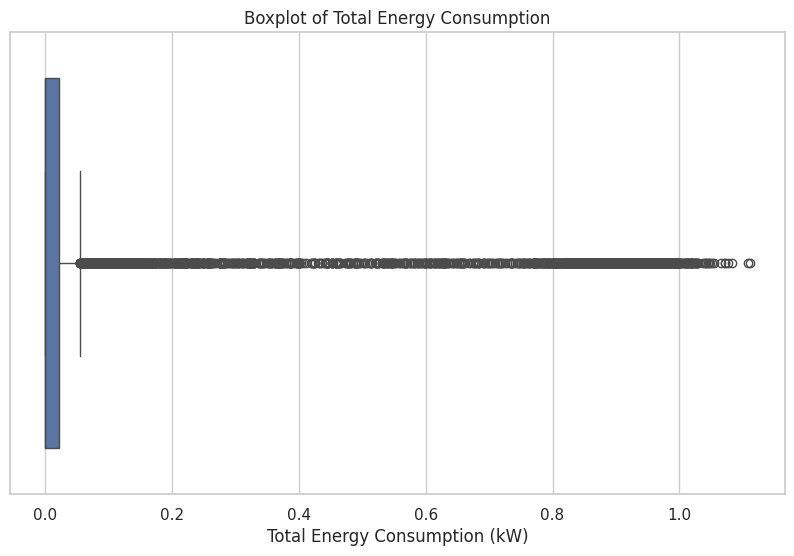

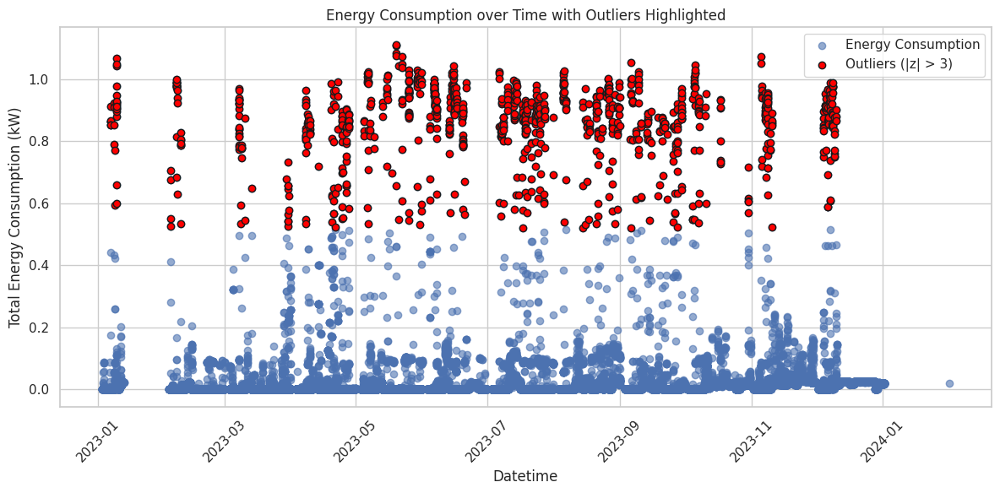

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# Set a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Energy Data
########################################
# Read the energy dataset from the Excel file
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename columns for clarity (adjust as needed)
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Parse the datetime column
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Replace non-numeric placeholders (e.g. "No CT") with NaN and then fill with 0
energy_df.replace("No CT", np.nan, inplace=True)
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Compute a Total Energy Consumption column (sum of all loads)
energy_df['Total_Energy'] = (energy_df['Computer'] +
                             energy_df['Plug_Load'] +
                             energy_df['AC_Load'] +
                             energy_df['Light_Fan'])

########################################
# 2. Plot Boxplot for Total Energy Consumption
########################################
plt.figure(figsize=(10,6))
sns.boxplot(x=energy_df['Total_Energy'])
plt.title('Boxplot of Total Energy Consumption')
plt.xlabel('Total Energy Consumption (kW)')
plt.show()

########################################
# 3. Detect and Plot Outliers with Z-Scores
########################################
# Compute z-scores for the Total Energy column
energy_df['Z_Total_Energy'] = zscore(energy_df['Total_Energy'])

# Outliers: absolute z-score greater than 3
threshold = 3
outliers = energy_df[np.abs(energy_df['Z_Total_Energy']) > threshold]

plt.figure(figsize=(12,6))
plt.scatter(energy_df['Datetime'], energy_df['Total_Energy'],
            label='Energy Consumption', alpha=0.6)
plt.scatter(outliers['Datetime'], outliers['Total_Energy'],
            color='red', label='Outliers (|z| > 3)', edgecolor='k')
plt.xlabel('Datetime')
plt.ylabel('Total Energy Consumption (kW)')
plt.title('Energy Consumption over Time with Outliers Highlighted')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


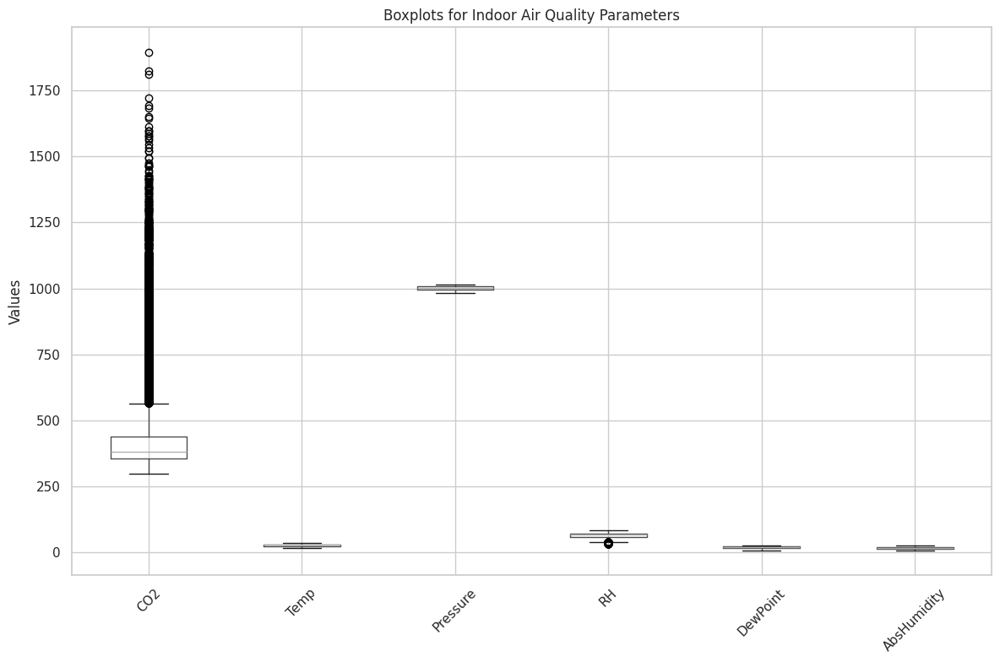

Outliers detected using Z-Scores:
CO2: 0 outliers
Temp: 0 outliers
Pressure: 19 outliers
RH: 87 outliers
DewPoint: 0 outliers
AbsHumidity: 0 outliers


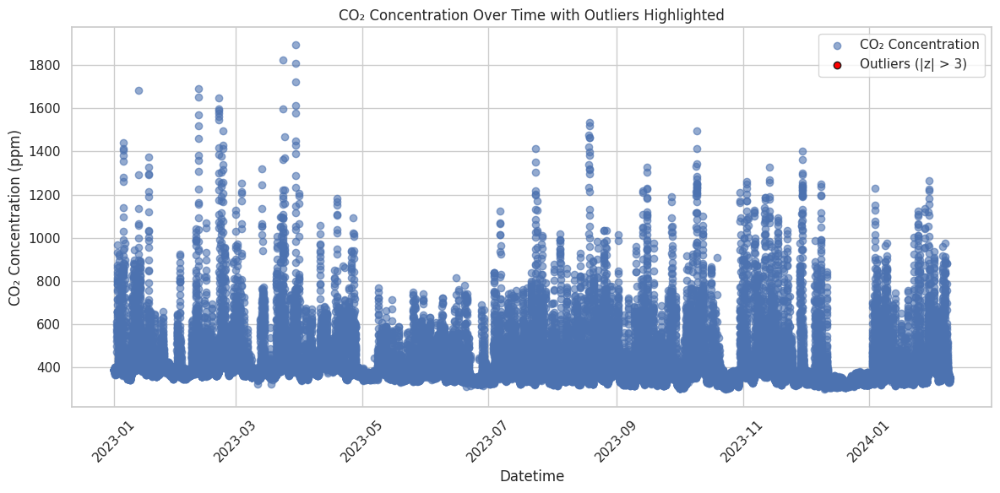

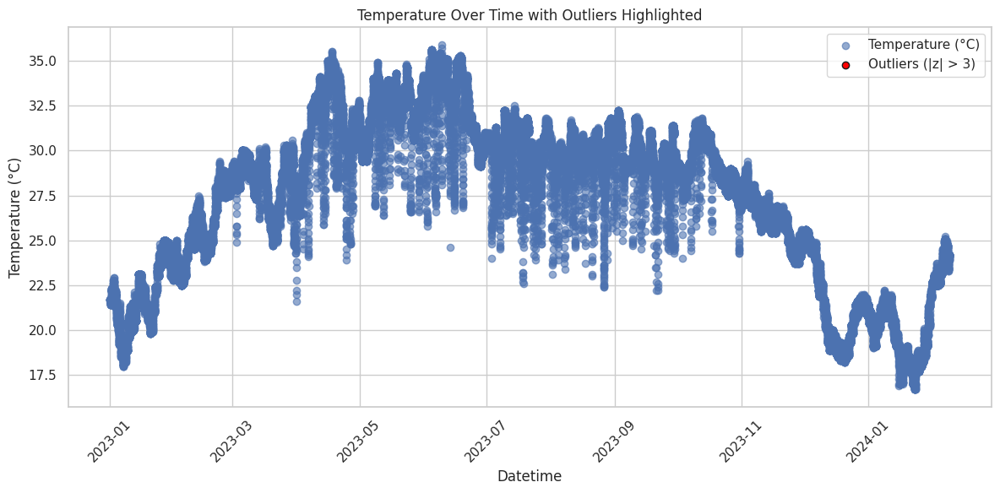

Processed data and outlier summary have been saved.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# Set a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load the indoor air quality dataset from the Excel file
indoor_file = 'Indoor-Air-Quality.xlsx'
indoor_df = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns for clarity (adjust names based on the file structure)
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified Datetime column by concatenating Date and Time
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert measurement columns to numeric (if not already)
numeric_cols = ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
for col in numeric_cols:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

########################################
# 2. Detect Outliers Using Boxplots
########################################
# Plot boxplots for each numeric column to identify outliers visually
plt.figure(figsize=(12, 8))
indoor_df[numeric_cols].boxplot()
plt.title('Boxplots for Indoor Air Quality Parameters')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

########################################
# 3. Detect Outliers Using Z-Scores
########################################
# Compute z-scores for each numeric column to identify statistical outliers
z_scores = indoor_df[numeric_cols].apply(zscore)

# Define a threshold for outlier detection (e.g., |z-score| > 3)
threshold = 3
outliers_zscore = (np.abs(z_scores) > threshold)

# Print summary of outliers detected for each parameter using z-scores
print("Outliers detected using Z-Scores:")
for col in numeric_cols:
    print(f"{col}: {outliers_zscore[col].sum()} outliers")

########################################
# 4. Visualize Outliers for CO₂ Concentration Over Time
########################################
plt.figure(figsize=(12, 6))
plt.scatter(indoor_df['Datetime'], indoor_df['CO2'], label='CO₂ Concentration', alpha=0.6)
plt.scatter(indoor_df['Datetime'][outliers_zscore['CO2']], indoor_df['CO2'][outliers_zscore['CO2']],
            color='red', label='Outliers (|z| > 3)', edgecolor='k')
plt.xlabel('Datetime')
plt.ylabel('CO₂ Concentration (ppm)')
plt.title('CO₂ Concentration Over Time with Outliers Highlighted')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

########################################
# 5. Visualize Outliers for Temperature Over Time
########################################
plt.figure(figsize=(12, 6))
plt.scatter(indoor_df['Datetime'], indoor_df['Temp'], label='Temperature (°C)', alpha=0.6)
plt.scatter(indoor_df['Datetime'][outliers_zscore['Temp']], indoor_df['Temp'][outliers_zscore['Temp']],
            color='red', label='Outliers (|z| > 3)', edgecolor='k')
plt.xlabel('Datetime')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Over Time with Outliers Highlighted')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

########################################
# 6. Save Processed Data and Outlier Summary (Optional)
########################################
outlier_summary = pd.DataFrame({
    "Parameter": numeric_cols,
    "Outlier_Count": [outliers_zscore[col].sum() for col in numeric_cols]
})
outlier_summary.to_csv("Indoor_Air_Quality_Outlier_Summary.csv", index=False)
indoor_df.to_csv("Processed_Indoor_Air_Quality.csv", index=False)

print("Processed data and outlier summary have been saved.")


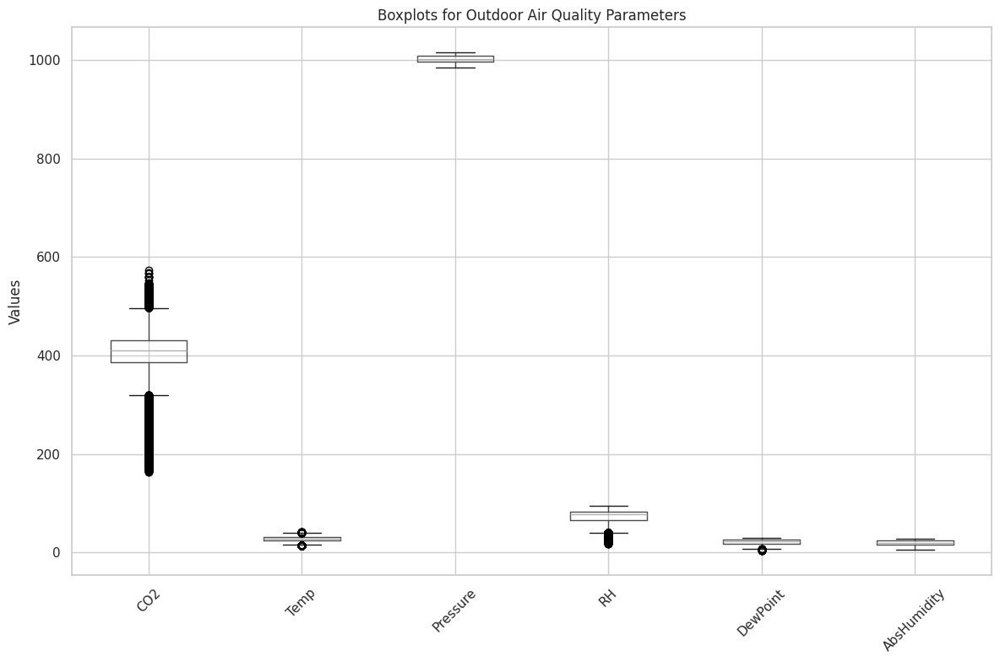

Outliers detected using Z-Scores:
CO2: 0 outliers
Temp: 0 outliers
Pressure: 17 outliers
RH: 371 outliers
DewPoint: 75 outliers
AbsHumidity: 0 outliers


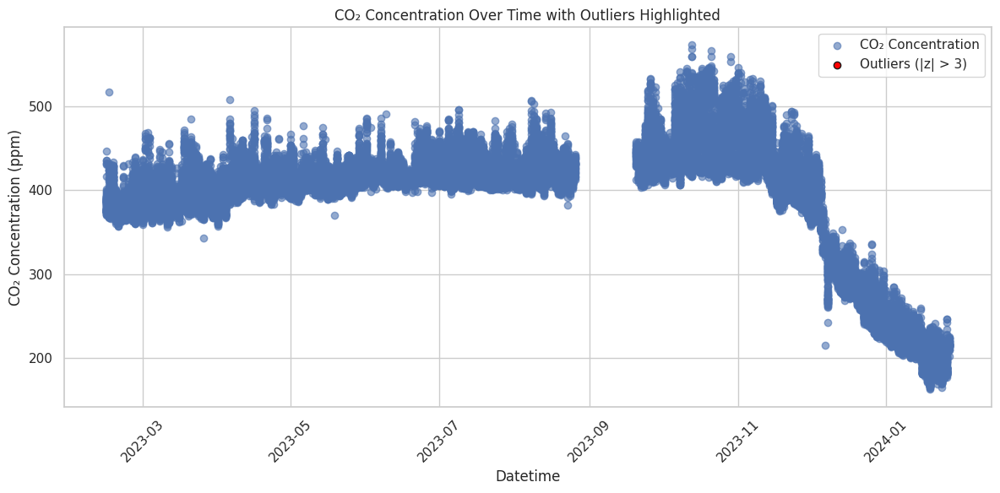

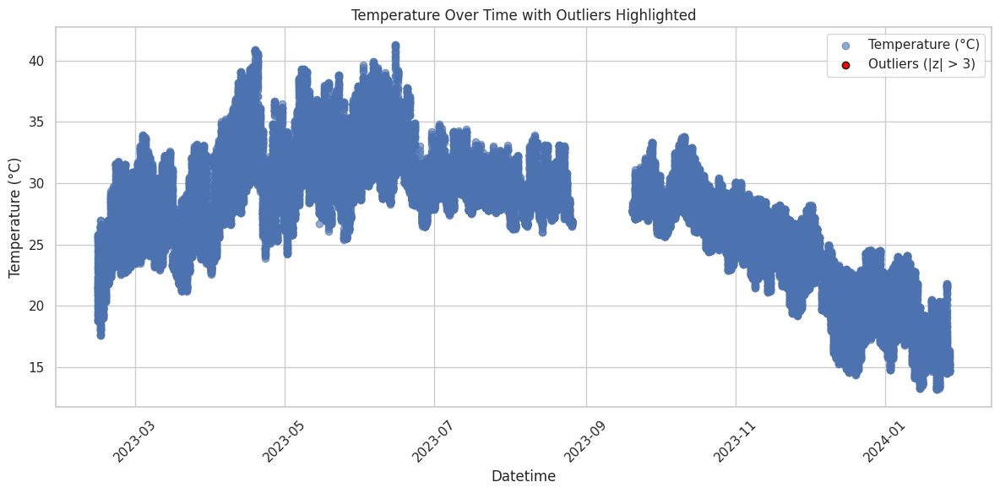

Processed data and outlier summary have been saved.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# Set a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Outdoor Air Quality Data
########################################
# Load the outdoor air quality dataset from the Excel file
outdoor_file = 'Outdoor-Air-Quality.xlsx'
outdoor_df = pd.read_excel(outdoor_file, sheet_name='OUTDOOR DATA - Air quality', skiprows=8, header=None)

# Rename columns for clarity (adjust names based on the file structure)
outdoor_df.columns = ['Datetime', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Convert Datetime column to proper datetime format
outdoor_df['Datetime'] = pd.to_datetime(outdoor_df['Datetime'], errors='coerce')

# Convert measurement columns to numeric (if not already)
numeric_cols = ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
for col in numeric_cols:
    outdoor_df[col] = pd.to_numeric(outdoor_df[col], errors='coerce')

########################################
# 2. Detect Outliers Using Boxplots
########################################
# Plot boxplots for each numeric column to identify outliers visually
plt.figure(figsize=(12, 8))
outdoor_df[numeric_cols].boxplot()
plt.title('Boxplots for Outdoor Air Quality Parameters')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

########################################
# 3. Detect Outliers Using Z-Scores
########################################
# Compute z-scores for each numeric column to identify statistical outliers
z_scores = outdoor_df[numeric_cols].apply(zscore)

# Define a threshold for outlier detection (e.g., |z-score| > 3)
threshold = 3
outliers_zscore = (np.abs(z_scores) > threshold)

# Print summary of outliers detected for each parameter using z-scores
print("Outliers detected using Z-Scores:")
for col in numeric_cols:
    print(f"{col}: {outliers_zscore[col].sum()} outliers")

########################################
# 4. Visualize Outliers for CO₂ Concentration Over Time
########################################
plt.figure(figsize=(12, 6))
plt.scatter(outdoor_df['Datetime'], outdoor_df['CO2'], label='CO₂ Concentration', alpha=0.6)
plt.scatter(outdoor_df['Datetime'][outliers_zscore['CO2']], outdoor_df['CO2'][outliers_zscore['CO2']],
            color='red', label='Outliers (|z| > 3)', edgecolor='k')
plt.xlabel('Datetime')
plt.ylabel('CO₂ Concentration (ppm)')
plt.title('CO₂ Concentration Over Time with Outliers Highlighted')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

########################################
# 5. Visualize Outliers for Temperature Over Time
########################################
plt.figure(figsize=(12, 6))
plt.scatter(outdoor_df['Datetime'], outdoor_df['Temp'], label='Temperature (°C)', alpha=0.6)
plt.scatter(outdoor_df['Datetime'][outliers_zscore['Temp']], outdoor_df['Temp'][outliers_zscore['Temp']],
            color='red', label='Outliers (|z| > 3)', edgecolor='k')
plt.xlabel('Datetime')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Over Time with Outliers Highlighted')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

########################################
# 6. Save Processed Data and Outlier Summary (Optional)
########################################
outlier_summary = pd.DataFrame({
    "Parameter": numeric_cols,
    "Outlier_Count": [outliers_zscore[col].sum() for col in numeric_cols]
})
outlier_summary.to_csv("Outdoor_Air_Quality_Outlier_Summary.csv", index=False)
outdoor_df.to_csv("Processed_Outdoor_Air_Quality.csv", index=False)

print("Processed data and outlier summary have been saved.")


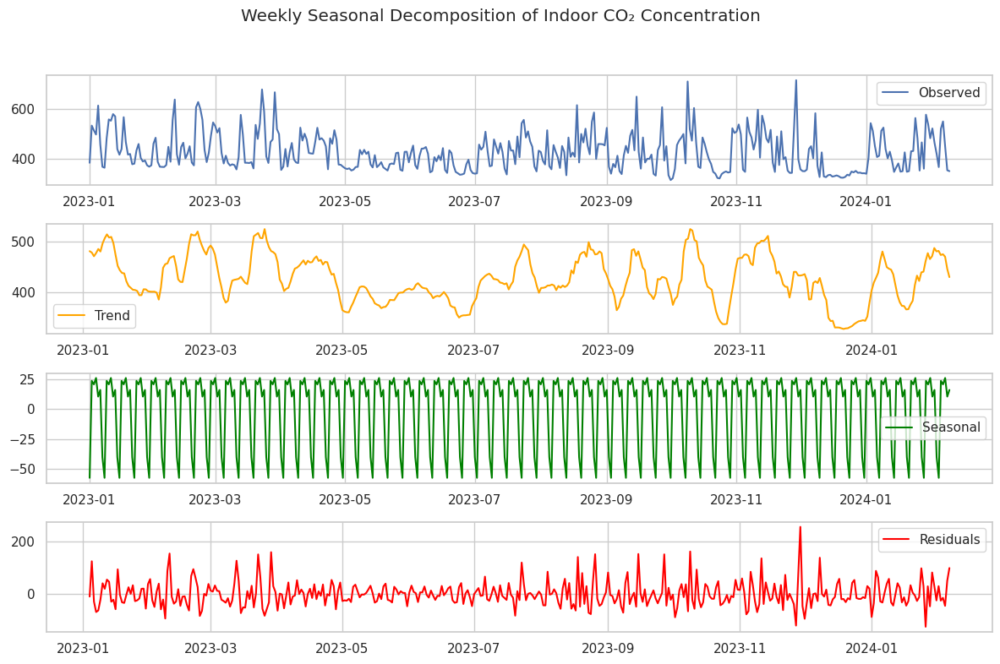

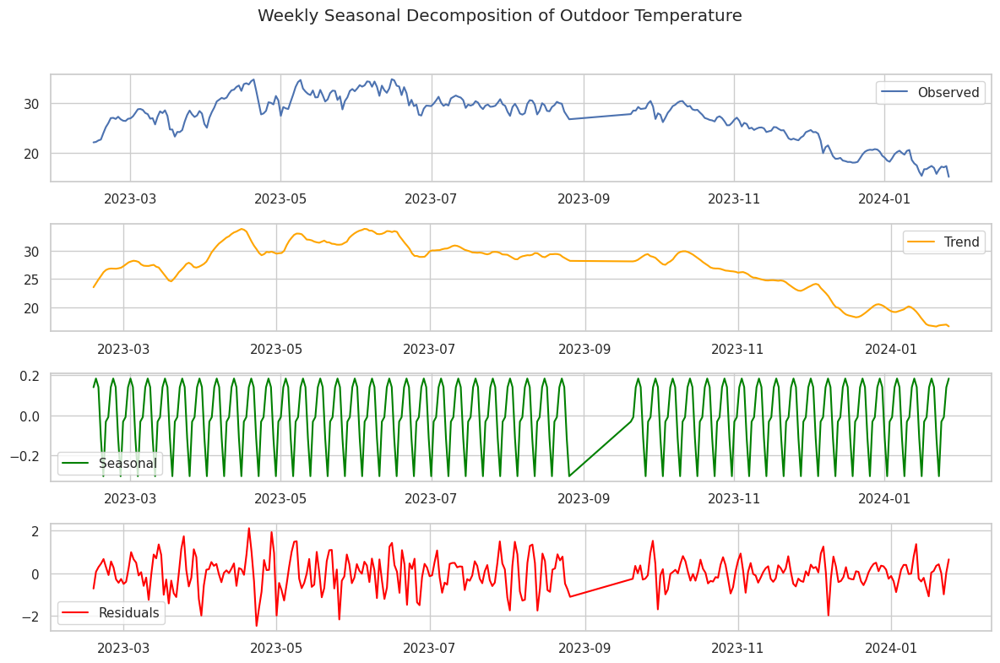

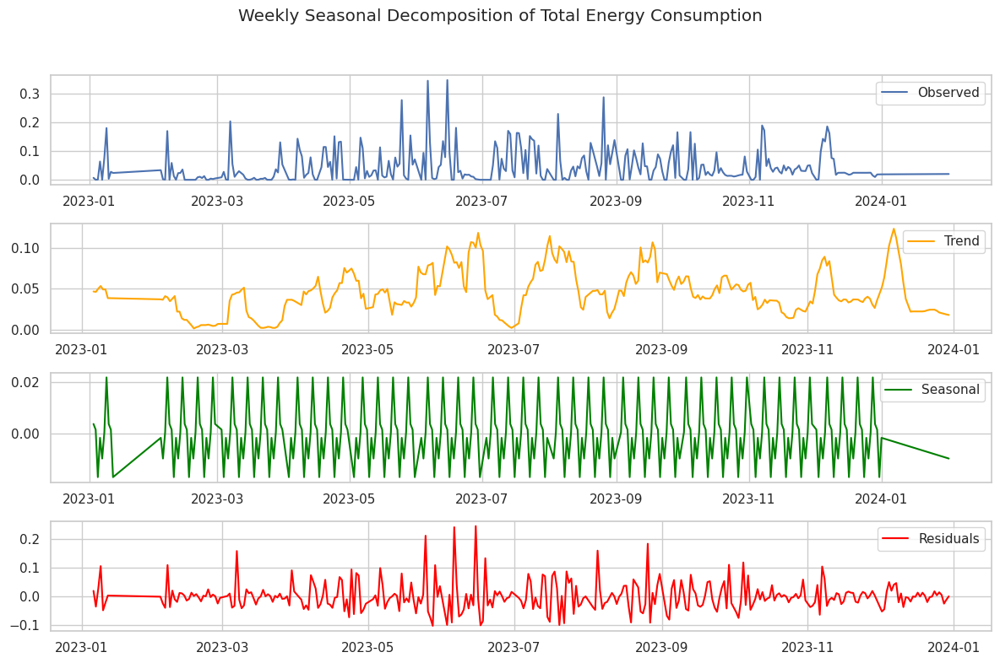

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Use a clean Seaborn style
sns.set(style="whitegrid")

########################################
# 1. Indoor Air Quality Data
########################################
# Load indoor data from Excel (sheet "PAoffice")
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity. Expected order:
# Date, Time, CO₂ (ppm), Temp (°C), Pressure (mbar), RH (%), DewPoint (°C td), AbsHumidity (g/m³)
indoor_df.columns = ['Date', 'Time', 'CO2_indoor', 'Temp_indoor',
                     'Pressure_indoor', 'RH_indoor', 'DewPoint_indoor', 'AbsHumidity_indoor']

# Create unified Datetime column (convert both Date and Time to string first)
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str),
                                        errors='coerce')

# Drop the original Date and Time columns
indoor_df.drop(['Date', 'Time'], axis=1, inplace=True)

# Convert key indoor measurement columns to numeric (if needed)
numeric_cols_indoor = ['CO2_indoor', 'Temp_indoor', 'Pressure_indoor', 'RH_indoor', 'DewPoint_indoor', 'AbsHumidity_indoor']
for col in numeric_cols_indoor:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Aggregate indoor data to daily averages using the date portion of the Datetime
indoor_daily = indoor_df.groupby(indoor_df['Datetime'].dt.date).mean()

########################################
# 2. Outdoor Air Quality Data
########################################
# Load outdoor data; note that the file contains header/metadata rows
outdoor_df = pd.read_excel('Outdoor-Air-Quality.xlsx', sheet_name='OUTDOOR DATA - Air quality', skiprows=8, header=None)

# Manually assign column names based on file structure:
outdoor_df.columns = ['Datetime', 'Time', 'CO2_outdoor', 'Temp_outdoor',
                        'Pressure_outdoor', 'RH_outdoor', 'DewPoint_outdoor', 'AbsHumidity_outdoor']

# Convert the outdoor "Datetime" column to datetime; drop the extra "Time" column
outdoor_df['Datetime'] = pd.to_datetime(outdoor_df['Datetime'], errors='coerce')
outdoor_df.drop('Time', axis=1, inplace=True)

# Convert key outdoor measurement columns to numeric
numeric_cols_outdoor = ['CO2_outdoor', 'Temp_outdoor', 'Pressure_outdoor', 'RH_outdoor', 'DewPoint_outdoor', 'AbsHumidity_outdoor']
for col in numeric_cols_outdoor:
    outdoor_df[col] = pd.to_numeric(outdoor_df[col], errors='coerce')

# Aggregate outdoor data to daily averages using the date portion of the Datetime
outdoor_daily = outdoor_df.groupby(outdoor_df['Datetime'].dt.date).mean()

########################################
# 3. Energy Data
########################################
# Load energy data from Excel (sheet "ENERGYDATA")
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename columns for clarity. Expected order:
# Time Bucket (Asia/Calcutta), Computer - kWatts, Plug Load (kWatts), Air Conditioner-kWatts, light + fan - kWatts.
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert the Datetime column to datetime
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy columns to numeric; replace non-numeric entries (e.g., "No CT") with NaN then fill with 0.
energy_cols = ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
for col in energy_cols:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Compute Total Energy as the sum of the energy components
energy_df['Total_Energy'] = energy_df[energy_cols].sum(axis=1)

# Aggregate energy data to daily averages using the date portion of the Datetime
energy_daily = energy_df.groupby(energy_df['Datetime'].dt.date).mean()

########################################
# 4. Seasonal Decomposition with Weekly Periodicity
########################################
# Since we have only 405 daily observations (about 1.1 years), we use period=7 (weekly seasonality).

# Decompose Indoor CO2 (as an example)
decomp_indoor = seasonal_decompose(indoor_daily['CO2_indoor'], model='additive', period=7)
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(decomp_indoor.observed, label='Observed')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomp_indoor.trend, label='Trend', color='orange')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomp_indoor.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomp_indoor.resid, label='Residuals', color='red')
plt.legend(loc='best')
plt.suptitle('Weekly Seasonal Decomposition of Indoor CO₂ Concentration')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Decompose Outdoor Temperature (example)
decomp_outdoor = seasonal_decompose(outdoor_daily['Temp_outdoor'], model='additive', period=7)
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(decomp_outdoor.observed, label='Observed')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomp_outdoor.trend, label='Trend', color='orange')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomp_outdoor.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomp_outdoor.resid, label='Residuals', color='red')
plt.legend(loc='best')
plt.suptitle('Weekly Seasonal Decomposition of Outdoor Temperature')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Decompose Total Energy Consumption (example)
decomp_energy = seasonal_decompose(energy_daily['Total_Energy'], model='additive', period=7)
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(decomp_energy.observed, label='Observed')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomp_energy.trend, label='Trend', color='orange')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomp_energy.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomp_energy.resid, label='Residuals', color='red')
plt.legend(loc='best')
plt.suptitle('Weekly Seasonal Decomposition of Total Energy Consumption')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


First few rows with occupancy indicator:
             Datetime    CO2  Occupancy
0 2023-01-01 00:00:00  385.0          0
1 2023-01-01 00:15:00  387.0          0
2 2023-01-01 00:30:00  390.0          0
3 2023-01-01 00:45:00  389.0          0
4 2023-01-01 01:00:00  391.0          0


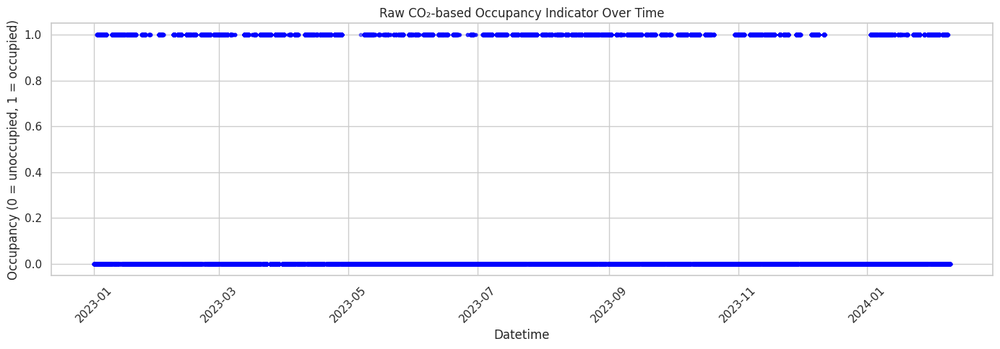

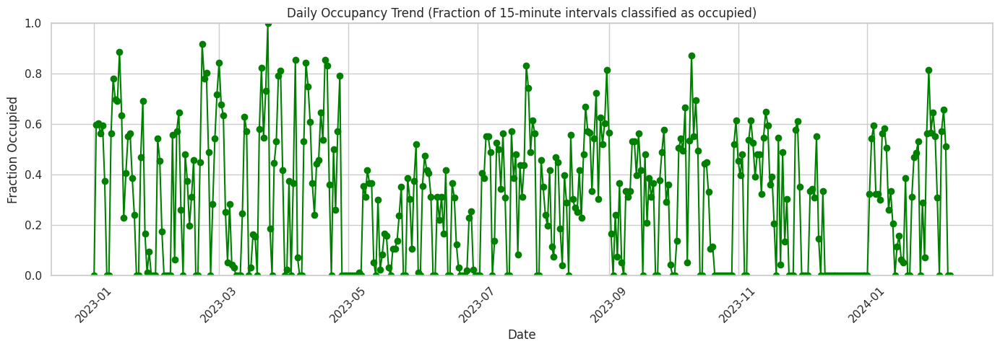

Processed indoor data and daily occupancy trend have been saved.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

# ----- PARAMETERS -----
# Set the CO2 threshold (in ppm) for occupancy detection.
CO2_THRESHOLD = 420

# ----- 1. Load and Preprocess Indoor Data -----
# Load the indoor air quality data from the Excel file and sheet "PAoffice"
indoor_file = 'Indoor-Air-Quality.xlsx'
df = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns for clarity; the file is assumed to have the following columns:
# [Date, Time, CO2 (ppm), Temperature (°C), Pressure (mbar), RH (%), DewPoint (°C td), AbsHumidity (g/m³)]
df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column by concatenating Date and Time (both first cast to string)
df['Datetime'] = pd.to_datetime(df['Date'].astype(str) + " " + df['Time'].astype(str),
                                errors='coerce')

# Convert the CO2 column to numeric (in case there are non‐numeric entries)
df['CO2'] = pd.to_numeric(df['CO2'], errors='coerce')

# ----- 2. Compute CO2-based Occupancy Indicator -----
# Here we define an occupancy indicator: 1 if CO2 is above the threshold, 0 otherwise.
df['Occupancy'] = np.where(df['CO2'] > CO2_THRESHOLD, 1, 0)

# For additional insight, you might plot the raw CO₂ level as well.
print("First few rows with occupancy indicator:")
print(df[['Datetime', 'CO2', 'Occupancy']].head())

# ----- 3. Aggregate Occupancy to Daily Values -----
# Group by the date part of the Datetime column and compute the mean occupancy.
df['DateOnly'] = df['Datetime'].dt.date
daily_occupancy = df.groupby('DateOnly')['Occupancy'].mean()  # This gives the fraction of time “occupied” in each day

# ----- 4. Plot Occupancy Trends -----
# Plot A: Raw Occupancy indicator (scatter plot) for each record
plt.figure(figsize=(14, 5))
plt.scatter(df['Datetime'], df['Occupancy'], c='blue', alpha=0.5, s=10)
plt.title('Raw CO₂-based Occupancy Indicator Over Time')
plt.xlabel('Datetime')
plt.ylabel('Occupancy (0 = unoccupied, 1 = occupied)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot B: Daily Occupancy Trend (line plot of proportion occupied)
plt.figure(figsize=(14, 5))
plt.plot(daily_occupancy.index, daily_occupancy.values, marker='o', linestyle='-', color='green')
plt.title('Daily Occupancy Trend (Fraction of 15-minute intervals classified as occupied)')
plt.xlabel('Date')
plt.ylabel('Fraction Occupied')
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

# Optionally save the processed data and daily occupancy trend.
df.to_csv("Processed_Indoor_AirQuality_with_Occupancy.csv", index=False)
daily_occupancy.to_csv("Daily_Occupancy_Trend.csv", header=["Occupancy_Ratio"])

print("Processed indoor data and daily occupancy trend have been saved.")


Peak demand hour: 12:00 with average energy consumption of 0.14 kW


<ipython-input-18-2a6a4e707011>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_energy.index, y=hourly_energy.values, palette="viridis")


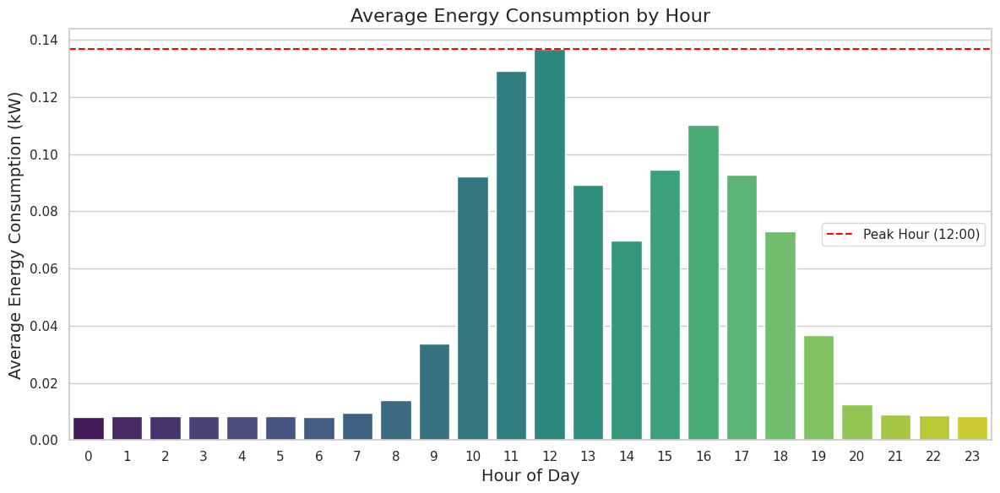

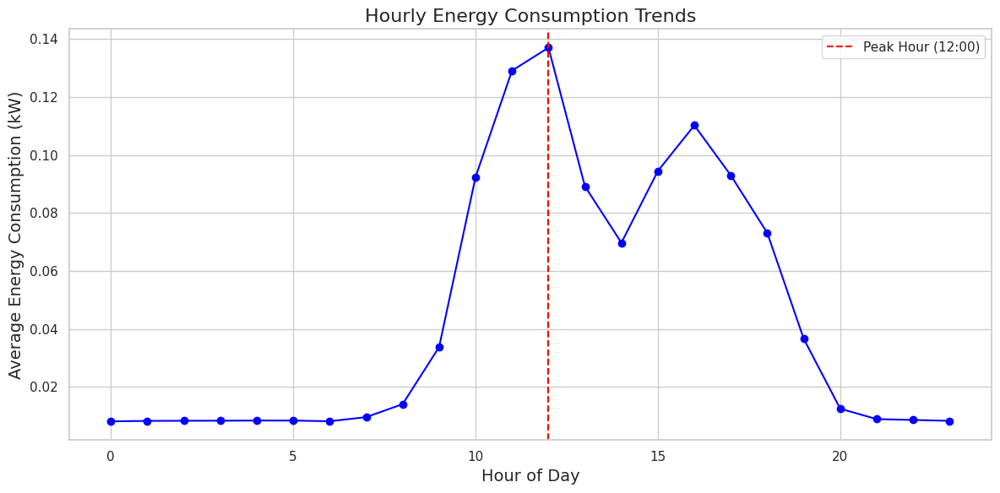

Hourly energy consumption data saved to 'Hourly_Energy_Consumption.csv'.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Energy Data
########################################
# Load the energy dataset from the ENERGYDATA.xlsx file (sheet "ENERGYDATA")
energy_df = pd.read_excel("ENERGYDATA.xlsx", sheet_name="ENERGYDATA")

# Rename columns for clarity (adjust names as needed)
energy_df.columns = ["Datetime", "Computer", "Plug_Load", "AC_Load", "Light_Fan"]

# Parse the Datetime column to ensure proper time-series analysis
energy_df["Datetime"] = pd.to_datetime(energy_df["Datetime"], errors="coerce")

# Replace non-numeric placeholders (e.g., "No CT") with NaN, then fill with 0
for col in ["Computer", "Plug_Load", "AC_Load", "Light_Fan"]:
    energy_df[col] = pd.to_numeric(energy_df[col], errors="coerce")
energy_df.fillna(0, inplace=True)

# Compute Total Energy Consumption as the sum of all energy components
energy_df["Total_Energy"] = energy_df[["Computer", "Plug_Load", "AC_Load", "Light_Fan"]].sum(axis=1)

########################################
# 2. Aggregate Data by Hour
########################################
# Extract the hour from the Datetime column
energy_df["Hour"] = energy_df["Datetime"].dt.hour

# Group by hour and compute the mean energy consumption for each hour
hourly_energy = energy_df.groupby("Hour")["Total_Energy"].mean()

########################################
# 3. Identify Peak Demand Hours
########################################
# Find the hour(s) with the highest average energy consumption
peak_hour = hourly_energy.idxmax()
peak_value = hourly_energy.max()
print(f"Peak demand hour: {peak_hour}:00 with average energy consumption of {peak_value:.2f} kW")

########################################
# 4. Visualize Peak Demand Hours
########################################

# Bar plot for hourly average energy consumption
plt.figure(figsize=(12, 6))
sns.barplot(x=hourly_energy.index, y=hourly_energy.values, palette="viridis")
plt.axhline(peak_value, color="red", linestyle="--", label=f"Peak Hour ({peak_hour}:00)")
plt.title("Average Energy Consumption by Hour", fontsize=16)
plt.xlabel("Hour of Day", fontsize=14)
plt.ylabel("Average Energy Consumption (kW)", fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()

# Line plot for hourly average energy consumption trends
plt.figure(figsize=(12, 6))
plt.plot(hourly_energy.index, hourly_energy.values, marker="o", color="blue")
plt.axvline(peak_hour, color="red", linestyle="--", label=f"Peak Hour ({peak_hour}:00)")
plt.title("Hourly Energy Consumption Trends", fontsize=16)
plt.xlabel("Hour of Day", fontsize=14)
plt.ylabel("Average Energy Consumption (kW)", fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()

########################################
# 5. Save Results (Optional)
########################################
hourly_energy.to_csv("Hourly_Energy_Consumption.csv", header=["Average_Energy"])
print("Hourly energy consumption data saved to 'Hourly_Energy_Consumption.csv'.")


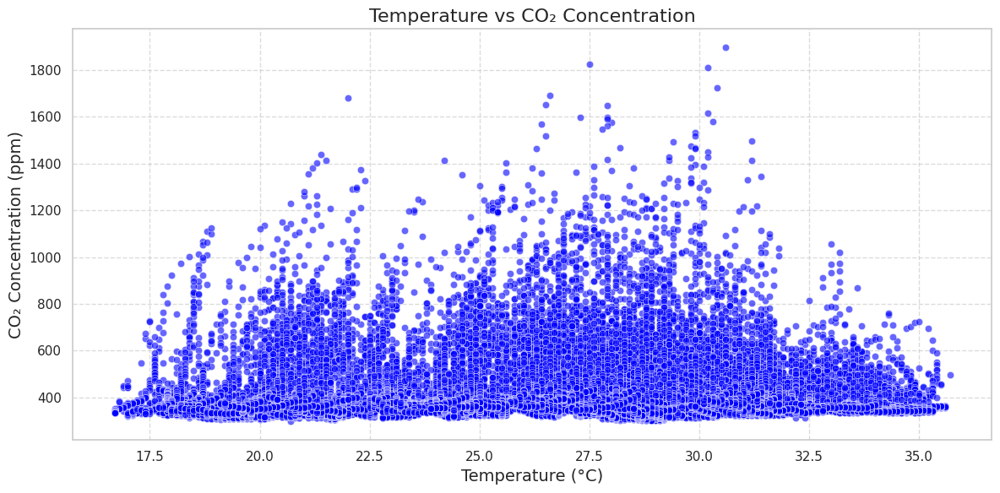

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load the indoor air quality dataset from the Excel file (sheet "PAoffice")
indoor_file = 'Indoor-Air-Quality.xlsx'
indoor_df = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns for clarity based on the file structure
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified Datetime column by concatenating Date and Time (convert both to strings first)
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + " " + indoor_df['Time'].astype(str), errors='coerce')

# Convert CO₂ and Temperature columns to numeric (in case of non-numeric entries like "###")
indoor_df['CO2'] = pd.to_numeric(indoor_df['CO2'], errors='coerce')
indoor_df['Temperature'] = pd.to_numeric(indoor_df['Temperature'], errors='coerce')

########################################
# 2. Plot Temperature vs CO₂ Concentration
########################################

plt.figure(figsize=(12, 6))
sns.scatterplot(data=indoor_df, x='Temperature', y='CO2', alpha=0.6, color='blue')
plt.title('Temperature vs CO₂ Concentration', fontsize=16)
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('CO₂ Concentration (ppm)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


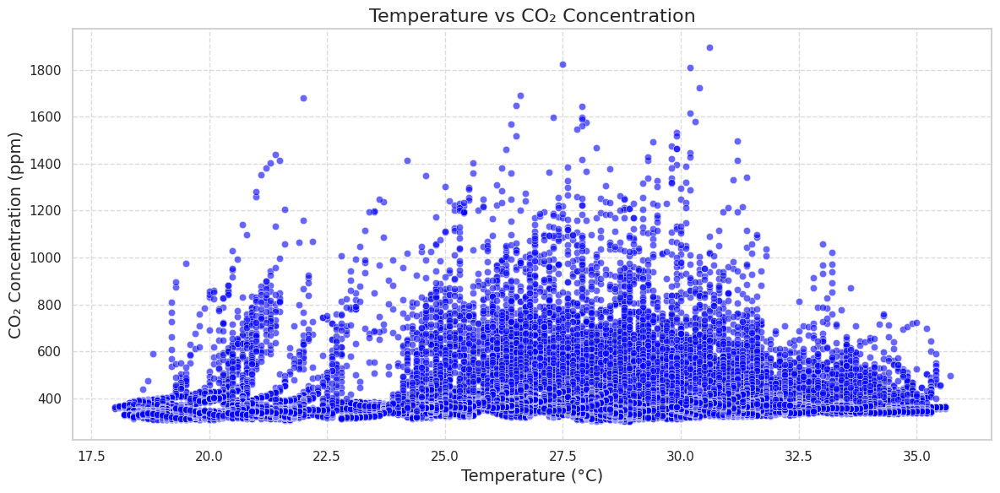

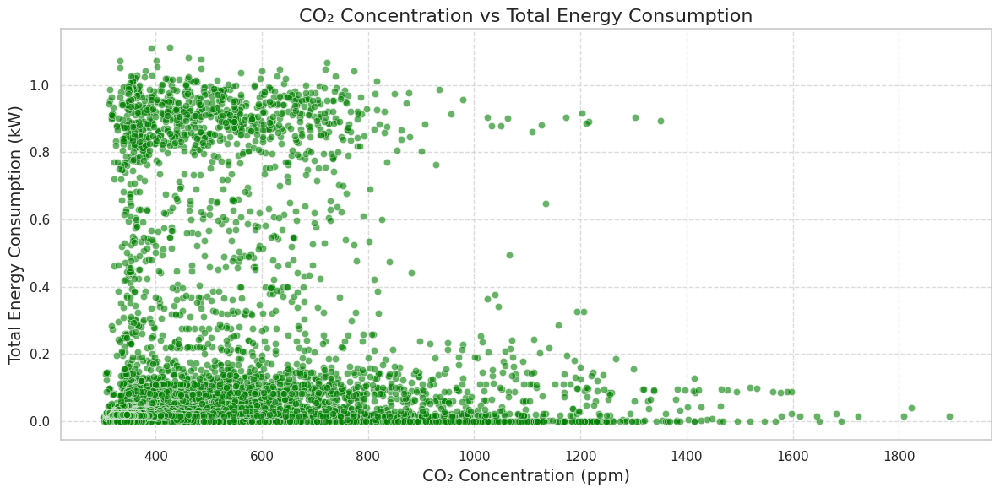

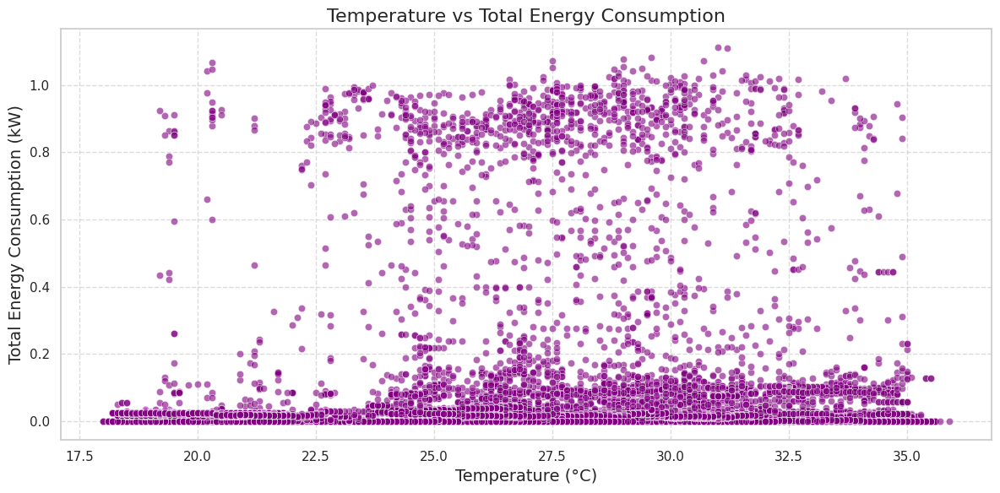

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
indoor_file = 'Indoor-Air-Quality.xlsx'
indoor_df = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified Datetime column by concatenating Date and Time
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + " " + indoor_df['Time'].astype(str), errors='coerce')

# Convert CO₂ and Temperature columns to numeric (handle non-numeric entries like "###")
indoor_df['CO2'] = pd.to_numeric(indoor_df['CO2'], errors='coerce')
indoor_df['Temperature'] = pd.to_numeric(indoor_df['Temperature'], errors='coerce')

########################################
# 2. Load and Preprocess Energy Data
########################################
energy_file = 'ENERGYDATA.xlsx'
energy_df = pd.read_excel(energy_file, sheet_name='ENERGYDATA')

# Rename columns for clarity
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Parse the Datetime column to ensure proper time-series analysis
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Replace non-numeric placeholders (e.g., "No CT") with NaN, then fill with 0
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Compute Total Energy Consumption as the sum of all energy components
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

########################################
# 3. Merge Indoor Air Quality and Energy Data
########################################
# Merge datasets on Datetime column using an inner join
merged_df = pd.merge(indoor_df, energy_df, on='Datetime', how='inner')

########################################
# 4. Generate Scatter Plots for Analysis
########################################

# Plot A: Temperature vs CO₂ Concentration
plt.figure(figsize=(12, 6))
sns.scatterplot(data=merged_df, x='Temperature', y='CO2', alpha=0.6, color='blue')
plt.title('Temperature vs CO₂ Concentration', fontsize=16)
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('CO₂ Concentration (ppm)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot B: CO₂ Concentration vs Total Energy Consumption
plt.figure(figsize=(12, 6))
sns.scatterplot(data=merged_df, x='CO2', y='Total_Energy', alpha=0.6, color='green')
plt.title('CO₂ Concentration vs Total Energy Consumption', fontsize=16)
plt.xlabel('CO₂ Concentration (ppm)', fontsize=14)
plt.ylabel('Total Energy Consumption (kW)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot C: Temperature vs Total Energy Consumption
plt.figure(figsize=(12, 6))
sns.scatterplot(data=merged_df, x='Temperature', y='Total_Energy', alpha=0.6, color='purple')
plt.title('Temperature vs Total Energy Consumption', fontsize=16)
plt.xlabel('Temperature (°C)', fontsize=14)
plt.ylabel('Total Energy Consumption (kW)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


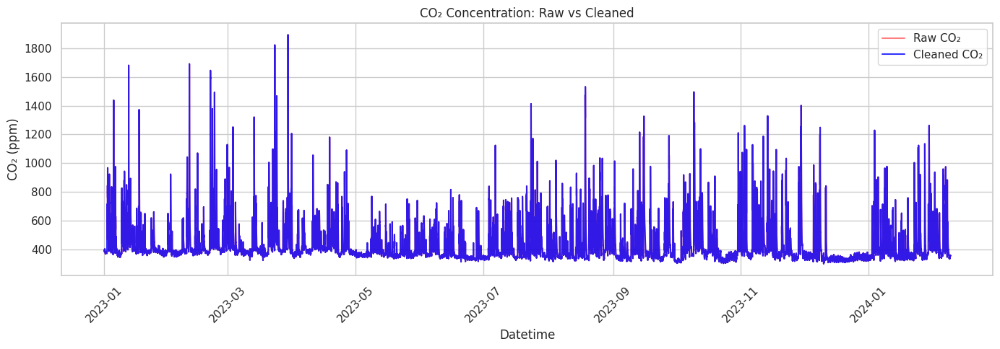

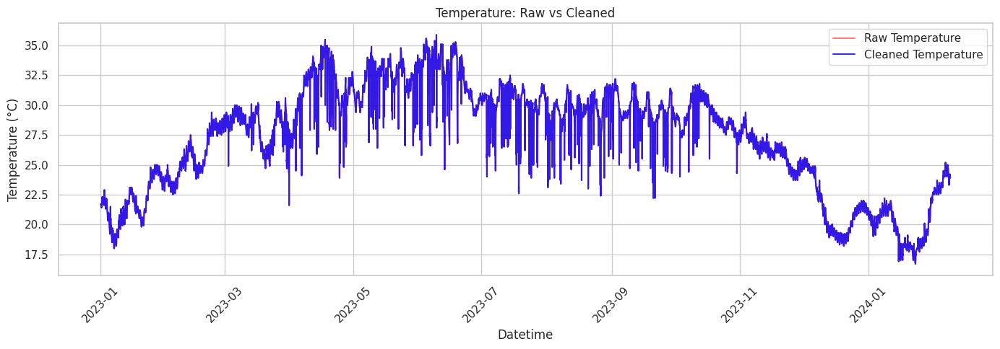

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data (Raw vs Cleaned)
########################################

# Load the raw indoor air quality data from the Excel file (sheet "PAoffice")
raw_indoor = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity.
# Here we assume the file has the following columns:
# Date, Time, CO₂, Temperature, Pressure, RH, DewPoint, AbsHumidity
raw_indoor.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified Datetime column by concatenating Date and Time.
raw_indoor['Datetime'] = pd.to_datetime(raw_indoor['Date'].astype(str) + " " + raw_indoor['Time'].astype(str),
                                         errors='coerce')

# Sort the DataFrame by the Datetime column.
raw_indoor = raw_indoor.sort_values('Datetime')

# Convert the CO2 and Temperature columns to numeric.
# Non-numeric values such as "###" will become NaN.
raw_indoor['CO2'] = pd.to_numeric(raw_indoor['CO2'], errors='coerce')
raw_indoor['Temperature'] = pd.to_numeric(raw_indoor['Temperature'], errors='coerce')

########################################
# 2. Create a Cleaned Version of the Data
########################################

# Make a copy of the raw data for cleaning.
clean_indoor = raw_indoor.copy()

# Perform cleaning—for example, fill missing (NaN) values using linear interpolation.
clean_indoor['CO2'] = clean_indoor['CO2'].interpolate(method='linear')
clean_indoor['Temperature'] = clean_indoor['Temperature'].interpolate(method='linear')

########################################
# 3. Plot Raw vs Cleaned Time Series
########################################

# Plot the CO₂ time series.
plt.figure(figsize=(14, 5))
plt.plot(raw_indoor['Datetime'], raw_indoor['CO2'], label='Raw CO₂', color='red', alpha=0.5)
plt.plot(clean_indoor['Datetime'], clean_indoor['CO2'], label='Cleaned CO₂', color='blue', alpha=0.8)
plt.title('CO₂ Concentration: Raw vs Cleaned')
plt.xlabel('Datetime')
plt.ylabel('CO₂ (ppm)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot the Temperature time series.
plt.figure(figsize=(14, 5))
plt.plot(raw_indoor['Datetime'], raw_indoor['Temperature'], label='Raw Temperature', color='red', alpha=0.5)
plt.plot(clean_indoor['Datetime'], clean_indoor['Temperature'], label='Cleaned Temperature', color='blue', alpha=0.8)
plt.title('Temperature: Raw vs Cleaned')
plt.xlabel('Datetime')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Peak demand hour: 12:00 with average energy consumption of 0.14 kW


<ipython-input-22-2a6a4e707011>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_energy.index, y=hourly_energy.values, palette="viridis")


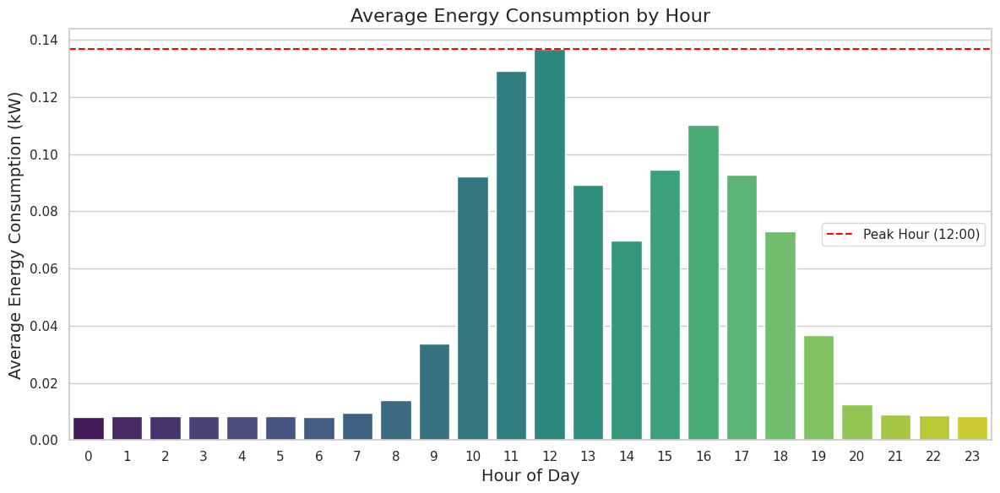

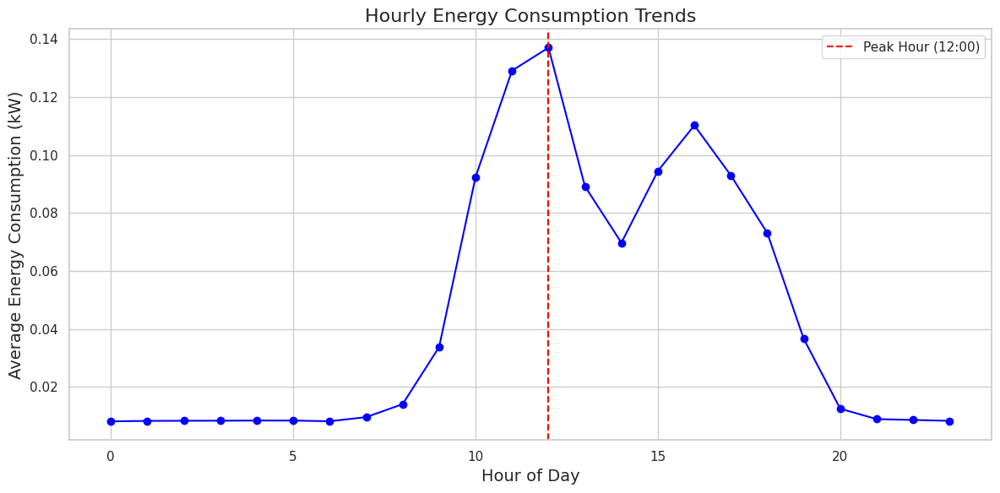

Hourly energy consumption data saved to 'Hourly_Energy_Consumption.csv'.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Energy Data
########################################
# Load the energy dataset from the ENERGYDATA.xlsx file (sheet "ENERGYDATA")
energy_df = pd.read_excel("ENERGYDATA.xlsx", sheet_name="ENERGYDATA")

# Rename columns for clarity (adjust names as needed)
energy_df.columns = ["Datetime", "Computer", "Plug_Load", "AC_Load", "Light_Fan"]

# Parse the Datetime column to ensure proper time-series analysis
energy_df["Datetime"] = pd.to_datetime(energy_df["Datetime"], errors="coerce")

# Replace non-numeric placeholders (e.g., "No CT") with NaN, then fill with 0
for col in ["Computer", "Plug_Load", "AC_Load", "Light_Fan"]:
    energy_df[col] = pd.to_numeric(energy_df[col], errors="coerce")
energy_df.fillna(0, inplace=True)

# Compute Total Energy Consumption as the sum of all energy components
energy_df["Total_Energy"] = energy_df[["Computer", "Plug_Load", "AC_Load", "Light_Fan"]].sum(axis=1)

########################################
# 2. Aggregate Data by Hour
########################################
# Extract the hour from the Datetime column
energy_df["Hour"] = energy_df["Datetime"].dt.hour

# Group by hour and compute the mean energy consumption for each hour
hourly_energy = energy_df.groupby("Hour")["Total_Energy"].mean()

########################################
# 3. Identify Peak Demand Hours
########################################
# Find the hour(s) with the highest average energy consumption
peak_hour = hourly_energy.idxmax()
peak_value = hourly_energy.max()
print(f"Peak demand hour: {peak_hour}:00 with average energy consumption of {peak_value:.2f} kW")

########################################
# 4. Visualize Peak Demand Hours
########################################

# Bar plot for hourly average energy consumption
plt.figure(figsize=(12, 6))
sns.barplot(x=hourly_energy.index, y=hourly_energy.values, palette="viridis")
plt.axhline(peak_value, color="red", linestyle="--", label=f"Peak Hour ({peak_hour}:00)")
plt.title("Average Energy Consumption by Hour", fontsize=16)
plt.xlabel("Hour of Day", fontsize=14)
plt.ylabel("Average Energy Consumption (kW)", fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()

# Line plot for hourly average energy consumption trends
plt.figure(figsize=(12, 6))
plt.plot(hourly_energy.index, hourly_energy.values, marker="o", color="blue")
plt.axvline(peak_hour, color="red", linestyle="--", label=f"Peak Hour ({peak_hour}:00)")
plt.title("Hourly Energy Consumption Trends", fontsize=16)
plt.xlabel("Hour of Day", fontsize=14)
plt.ylabel("Average Energy Consumption (kW)", fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()

########################################
# 5. Save Results (Optional)
########################################
hourly_energy.to_csv("Hourly_Energy_Consumption.csv", header=["Average_Energy"])
print("Hourly energy consumption data saved to 'Hourly_Energy_Consumption.csv'.")


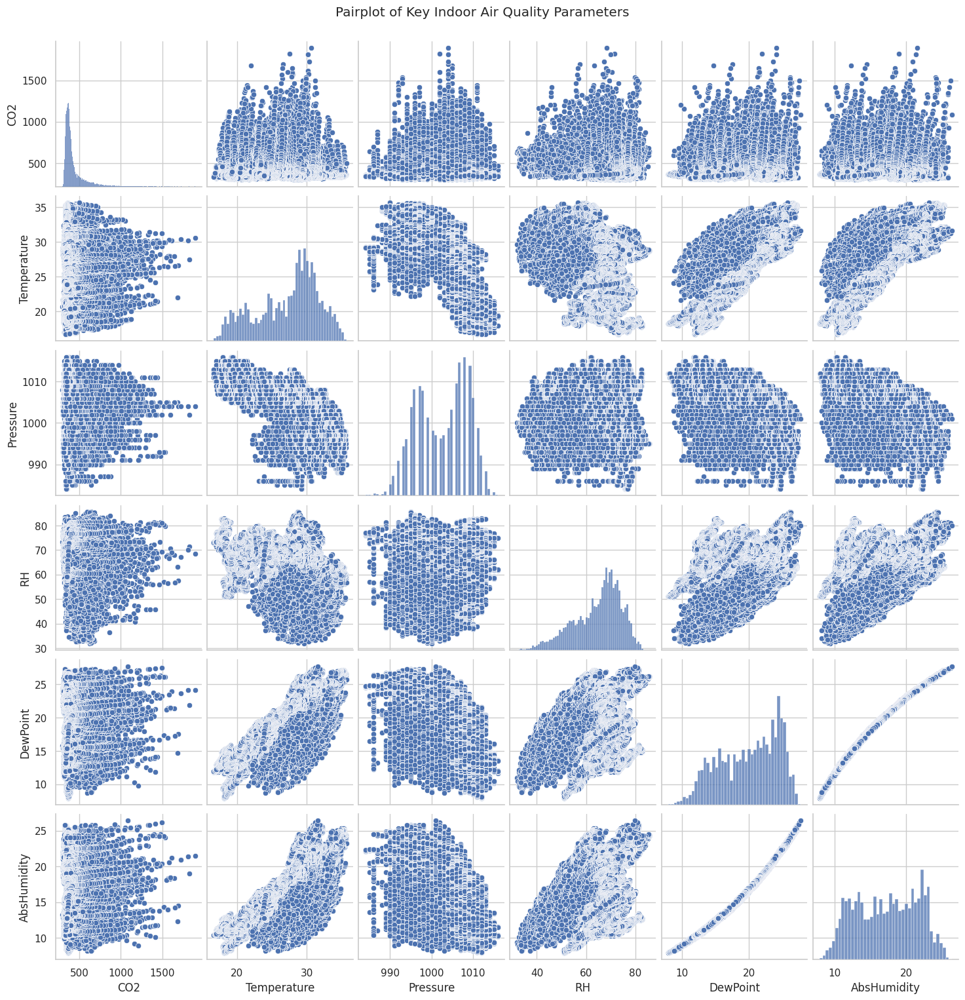

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the indoor air quality data from the Excel file and sheet "PAoffice"
# For this example we assume the file columns are as described in the assignment documentation.
df = pd.read_excel("Indoor-Air-Quality.xlsx", sheet_name="PAoffice")

# Rename columns for clarity.
# Adjust these names if your dataset headers differ.
df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Convert key measurement columns to numeric (non-numeric entries like "###" become NaN)
numeric_cols = ['CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Optionally drop rows with missing values for the selected variables
df_clean = df.dropna(subset=numeric_cols)

# Create a pairplot to display pairwise relationships among the key IAQ variables.
sns.pairplot(df_clean[numeric_cols])
plt.suptitle("Pairplot of Key Indoor Air Quality Parameters", y=1.02)
plt.show()


<ipython-input-25-1b2ec83bc74c>:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['CO2'].fillna(method='ffill', inplace=True)
<ipython-input-25-1b2ec83bc74c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['CO2'].fillna(method='ffill', inplace=True)


<Figure size 1200x800 with 0 Axes>

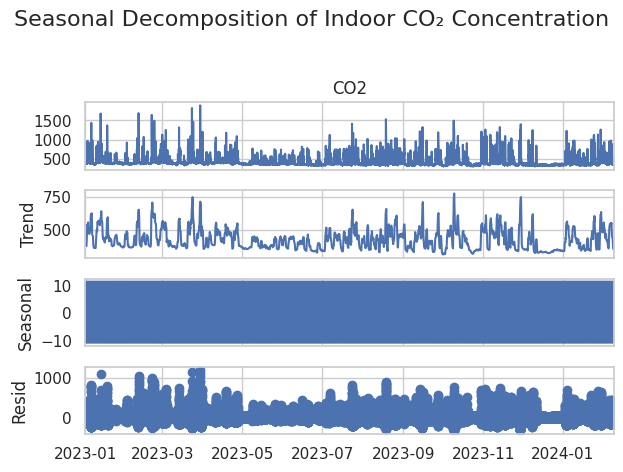

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# -------------------------------
# 1. Load and Preprocess the Data
# -------------------------------

# Load indoor air quality data from the Excel file (sheet "PAoffice")
df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity
# The expected order is: Date, Time, CO₂ (ppm), Temperature (°C), Pressure (mbar), RH (%), DewPoint (°C td), Absolute Humidity (g/m³)
df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column by concatenating the Date and Time strings
df['Datetime'] = pd.to_datetime(df['Date'].astype(str) + ' ' + df['Time'].astype(str), errors='coerce')

# Drop any rows that could not be parsed into a datetime
df = df.dropna(subset=['Datetime'])

# Set the Datetime column as the DataFrame index
df.set_index('Datetime', inplace=True)

# Convert the CO2 column to numeric, coercing any non-numeric values to NaN
df['CO2'] = pd.to_numeric(df['CO2'], errors='coerce')

# Fill missing CO2 values (for example, by forward filling)
df['CO2'].fillna(method='ffill', inplace=True)

# ------------------------------------------
# 2. Time Series Decomposition (Daily Seasonality)
# ------------------------------------------
# With 15-minute resolution data, there are 96 periods per day.
decomposition = seasonal_decompose(df['CO2'], model='additive', period=96)

# Plot the seasonal decomposition results
plt.figure(figsize=(12, 8))
decomposition.plot()
plt.suptitle('Seasonal Decomposition of Indoor CO₂ Concentration', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


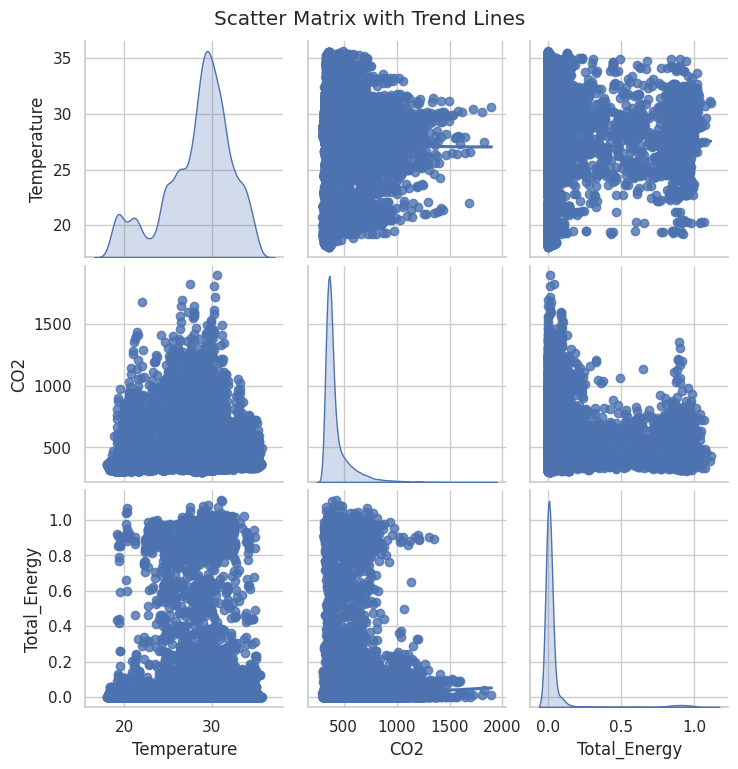

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use Seaborn’s clean style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load indoor data from the Excel file (sheet "PAoffice")
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity. (Assuming order: Date, Time, CO₂ (ppm), Temperature (°C), Pressure, RH, DewPoint, Absolute Humidity)
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column by concatenating Date and Time.
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + " " + indoor_df['Time'].astype(str),
                                        errors='coerce')

# Convert relevant columns to numeric
indoor_df['CO2'] = pd.to_numeric(indoor_df['CO2'], errors='coerce')
indoor_df['Temperature'] = pd.to_numeric(indoor_df['Temperature'], errors='coerce')

########################################
# 2. Load and Preprocess Energy Data
########################################
# Load the energy dataset from ENERGYDATA.xlsx (sheet "ENERGYDATA")
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename columns for clarity (expected order: Datetime, Computer, Plug_Load, AC_Load, light + fan)
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Parse the Datetime column
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy measurement columns to numeric; replace non-numeric entries with NaN and then 0
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Compute the Total Energy Consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

########################################
# 3. Merge Indoor and Energy Data
########################################
# Sort both dataframes by Datetime
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)

# Merge using an asof join (nearest matching timestamp within a tolerance)
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', tolerance=pd.Timedelta('5min'))

########################################
# 4. Create a Scatter Matrix (Pairplot) with LOESS Trend Lines
########################################
# Select the key variables: Temperature, CO2, Total Energy Consumption
subset_df = merged_df[['Temperature', 'CO2', 'Total_Energy']].dropna()

# Create a pairplot using regplot style so that a trend line is drawn.
# The 'plot_kws' parameter passes {'lowess': True} to create a LOESS smoother.
sns.pairplot(subset_df, kind='reg', diag_kind='kde', plot_kws={'lowess': True})

plt.suptitle("Scatter Matrix with Trend Lines", y=1.02)
plt.show()


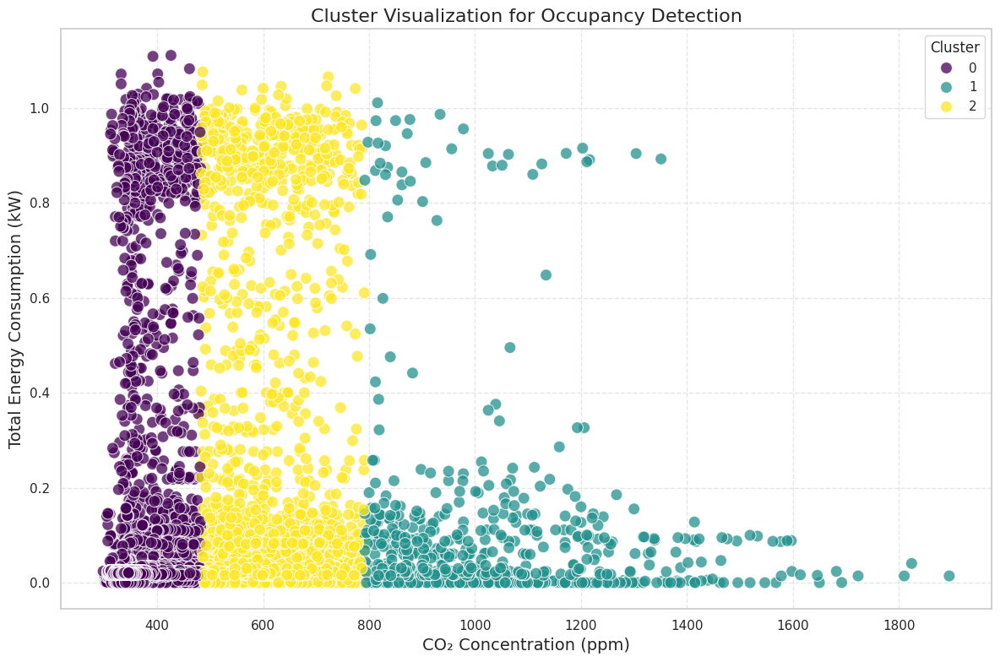

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Use Seaborn’s clean style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load the indoor data from "Indoor-Air-Quality.xlsx" (sheet "PAoffice")
try:
    indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')
except FileNotFoundError:
    raise FileNotFoundError("Indoor-Air-Quality.xlsx not found. Please check your file path.")

# Assume the columns are: Date, Time, CO₂, Temperature, Pressure, RH, DewPoint, AbsHumidity.
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
# Create a unified datetime column by concatenating Date and Time (forcing both to strings)
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str),
                                        errors='coerce')
# Convert CO2 to numeric; non-numeric entries (like "###") become NaN.
indoor_df['CO2'] = pd.to_numeric(indoor_df['CO2'], errors='coerce')
# Keep only datetime and CO2, and drop rows with missing values
indoor_df = indoor_df[['Datetime', 'CO2']].dropna()

########################################
# 2. Load and Preprocess Energy Data
########################################
# Load energy data from "ENERGYDATA.xlsx" (sheet "ENERGYDATA")
try:
    energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')
except FileNotFoundError:
    raise FileNotFoundError("ENERGYDATA.xlsx not found. Please check your file path.")

# Rename columns; expected order: Datetime, Computer, Plug_Load, AC_Load, Light_Fan
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
# Parse the datetime column
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')
# Convert energy columns to numeric
energy_cols = ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
for col in energy_cols:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
# Fill missing values with zero so that non-numeric placeholders (e.g. "No CT") become 0
energy_df.fillna(0, inplace=True)
# Compute a Total Energy column as the sum of energy components
energy_df['Total_Energy'] = energy_df[energy_cols].sum(axis=1)
# Keep only Datetime and Total_Energy, drop rows with missing values
energy_df = energy_df[['Datetime', 'Total_Energy']].dropna()

########################################
# 3. Merge Indoor and Energy Data
########################################
# First, sort both dataframes by Datetime.
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)
# Merge using an asof merge (with a tolerance of 5 minutes)
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', tolerance=pd.Timedelta('5min'))
merged_df = merged_df.dropna()

########################################
# 4. Cluster Visualization for Occupancy Detection
########################################
# We use K-Means clustering on two features: CO2 (as a proxy for occupancy) and Total_Energy.
features = merged_df[['CO2', 'Total_Energy']].values

# Set number of clusters; for example, use 3 clusters.
kmeans = KMeans(n_clusters=3, random_state=42)
merged_df['Cluster'] = kmeans.fit_predict(features)

# Plot a scatter plot showing clusters with x-axis = CO2 and y-axis = Total_Energy.
plt.figure(figsize=(12, 8))
sns.scatterplot(data=merged_df, x='CO2', y='Total_Energy', hue='Cluster', palette='viridis', s=100, alpha=0.75)
plt.title("Cluster Visualization for Occupancy Detection", fontsize=16)
plt.xlabel("CO₂ Concentration (ppm)", fontsize=14)
plt.ylabel("Total Energy Consumption (kW)", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


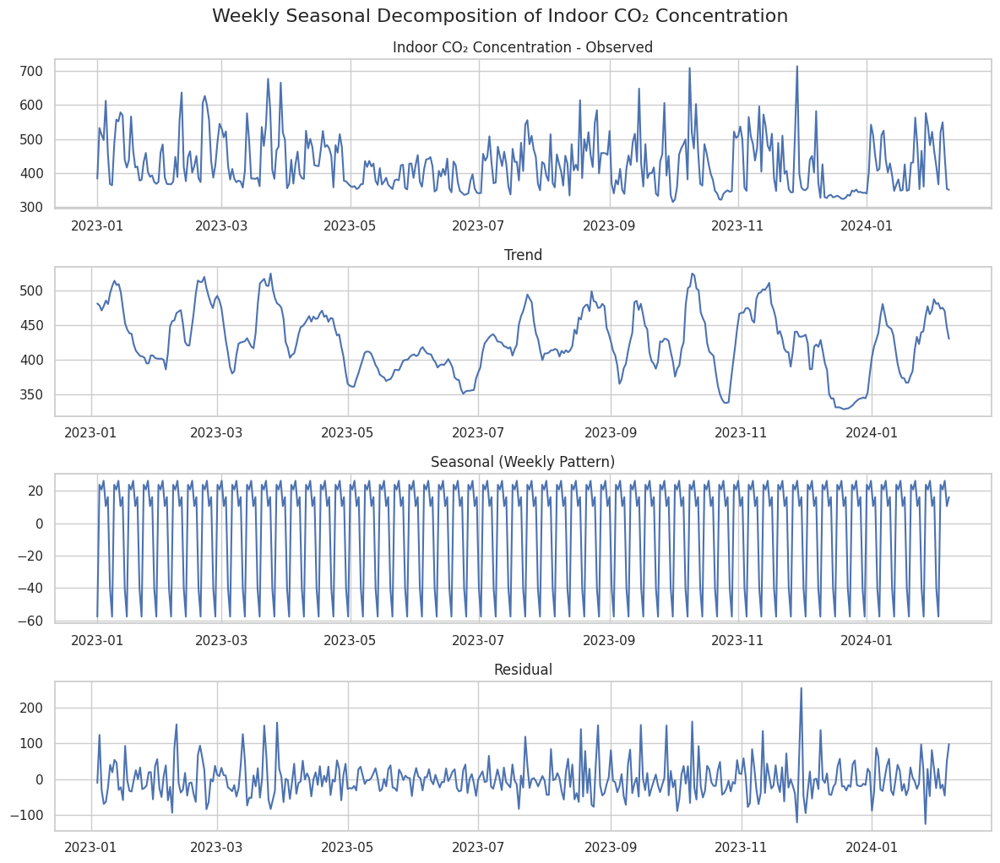

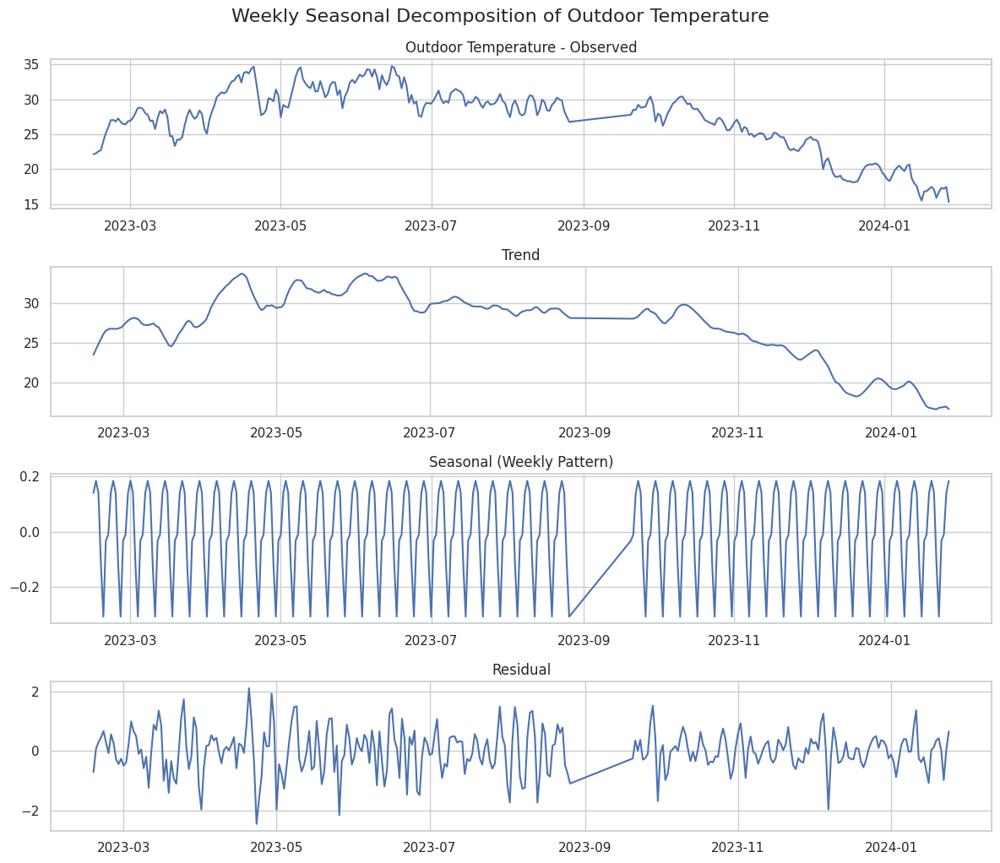

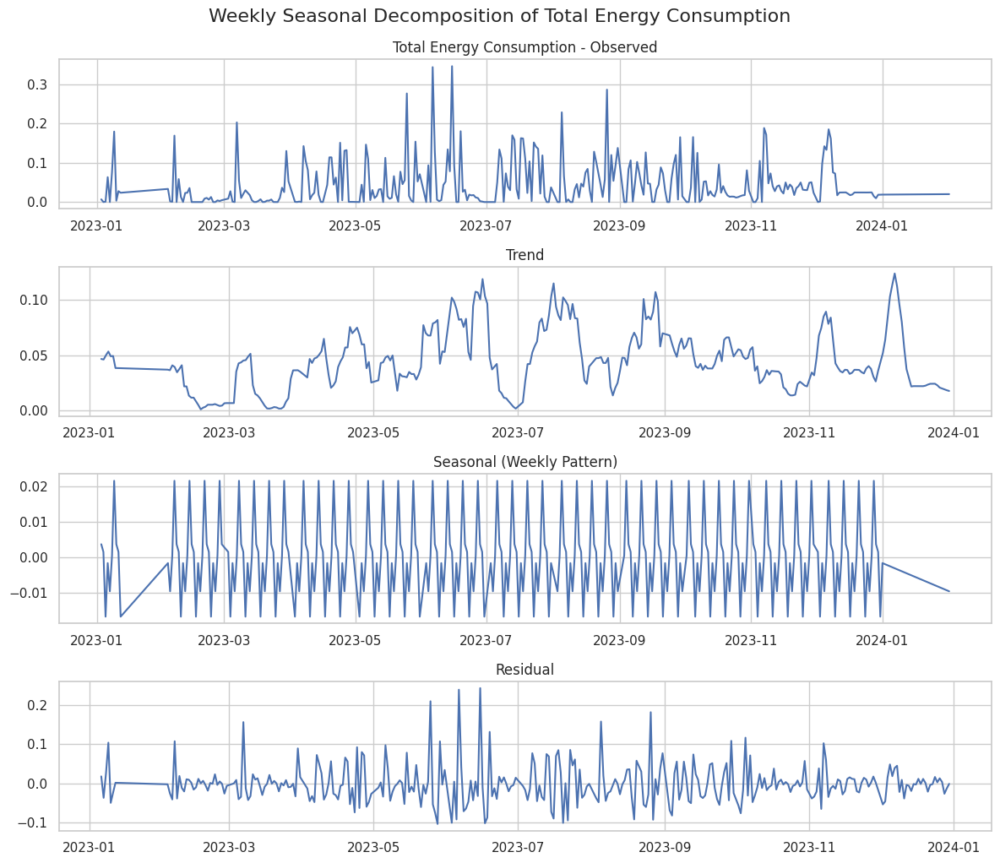

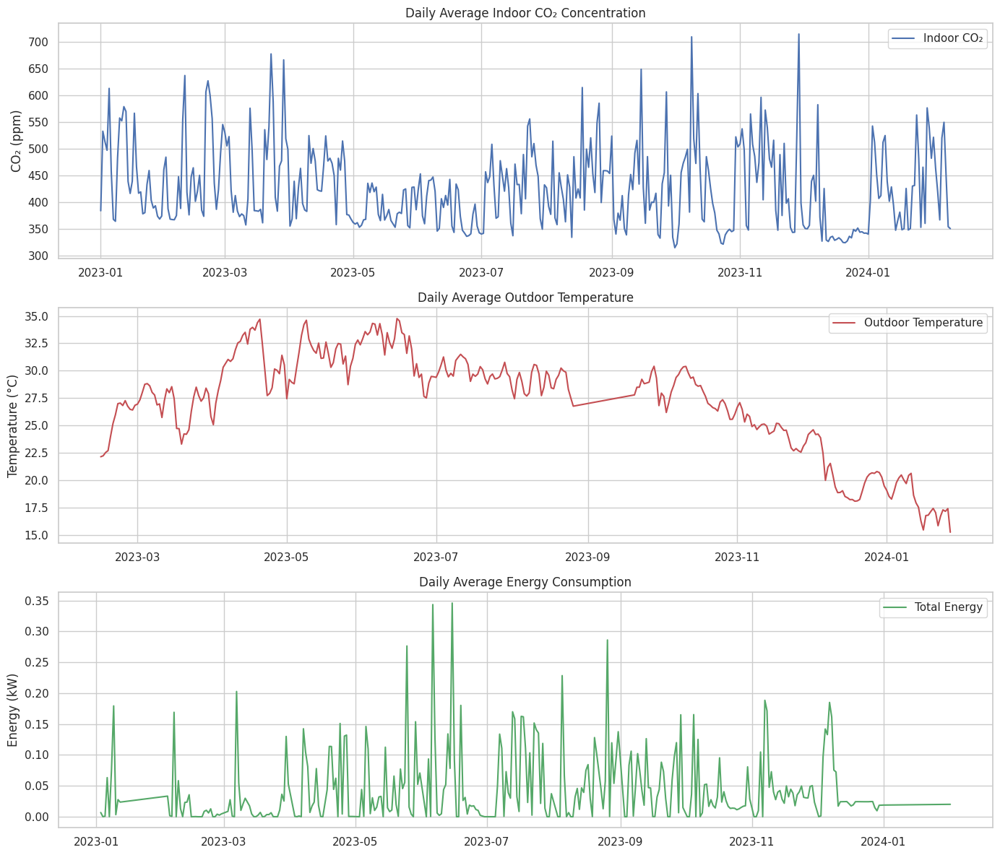

Seasonal analysis completed successfully.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Set a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load the indoor air quality data
indoor_file = 'Indoor-Air-Quality.xlsx'
indoor_df = pd.read_excel(indoor_file, sheet_name='PAoffice')

# The indoor file has columns in this format: Date, Time, CO2, Temperature, etc.
# First two columns are Date and Time, rename them accordingly
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified Datetime column
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert measurement columns to numeric
for col in ['CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Group by date for daily analysis
indoor_daily = indoor_df.groupby(indoor_df['Datetime'].dt.date).mean(numeric_only=True)

########################################
# 2. Load and Preprocess Outdoor Air Quality Data
########################################
# Load the outdoor air quality data, skipping header rows
outdoor_file = 'Outdoor-Air-Quality.xlsx'
outdoor_df = pd.read_excel(outdoor_file, sheet_name='OUTDOOR DATA - Air quality', skiprows=8, header=None)

# Assign column names based on the file structure
outdoor_df.columns = ['Datetime', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Convert the Datetime column to datetime
outdoor_df['Datetime'] = pd.to_datetime(outdoor_df['Datetime'], errors='coerce')

# Convert measurement columns to numeric
for col in ['CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    outdoor_df[col] = pd.to_numeric(outdoor_df[col], errors='coerce')

# Group by date for daily analysis
outdoor_daily = outdoor_df.groupby(outdoor_df['Datetime'].dt.date).mean(numeric_only=True)

########################################
# 3. Load and Preprocess Energy Data
########################################
# Load the energy data
energy_file = 'ENERGYDATA.xlsx'
energy_df = pd.read_excel(energy_file, sheet_name='ENERGYDATA')

# Rename columns based on the file structure
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert the Datetime column to datetime
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy columns to numeric, replacing "No CT" with NaN
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')

# Fill NaN values with 0
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Group by date for daily analysis
energy_daily = energy_df.groupby(energy_df['Datetime'].dt.date).mean(numeric_only=True)

########################################
# 4. Seasonal Decomposition with Weekly Period
########################################
# Use a weekly period (7 days) for seasonal decomposition
# This works better with limited data (less than 2 years)

# Function to plot seasonal decomposition
def plot_seasonal_decomposition(series, title, period=7):
    # Make sure we have enough data for the period
    if len(series) >= period*2:
        decomposition = seasonal_decompose(series, model='additive', period=period)

        plt.figure(figsize=(12, 10))
        plt.subplot(411)
        plt.plot(decomposition.observed)
        plt.title(f'{title} - Observed')
        plt.subplot(412)
        plt.plot(decomposition.trend)
        plt.title('Trend')
        plt.subplot(413)
        plt.plot(decomposition.seasonal)
        plt.title('Seasonal (Weekly Pattern)')
        plt.subplot(414)
        plt.plot(decomposition.resid)
        plt.title('Residual')
        plt.tight_layout()
        plt.suptitle(f'Weekly Seasonal Decomposition of {title}', y=1.02, fontsize=16)
        plt.show()
    else:
        print(f"Not enough data for {title} decomposition. Need at least {period*2} data points, but have {len(series)}.")

# Plot seasonal decompositions
plot_seasonal_decomposition(indoor_daily['CO2'], 'Indoor CO₂ Concentration')
plot_seasonal_decomposition(outdoor_daily['Temperature'], 'Outdoor Temperature')
plot_seasonal_decomposition(energy_daily['Total_Energy'], 'Total Energy Consumption')

########################################
# 5. Plot Combined Time Series
########################################
# Plot daily averages for key variables
plt.figure(figsize=(14, 12))

# Plot 1: Indoor CO₂
plt.subplot(3, 1, 1)
plt.plot(indoor_daily.index, indoor_daily['CO2'], 'b-', label='Indoor CO₂')
plt.title('Daily Average Indoor CO₂ Concentration')
plt.ylabel('CO₂ (ppm)')
plt.legend()

# Plot 2: Outdoor Temperature
plt.subplot(3, 1, 2)
plt.plot(outdoor_daily.index, outdoor_daily['Temperature'], 'r-', label='Outdoor Temperature')
plt.title('Daily Average Outdoor Temperature')
plt.ylabel('Temperature (°C)')
plt.legend()

# Plot 3: Total Energy Consumption
plt.subplot(3, 1, 3)
plt.plot(energy_daily.index, energy_daily['Total_Energy'], 'g-', label='Total Energy')
plt.title('Daily Average Energy Consumption')
plt.ylabel('Energy (kW)')
plt.legend()

plt.tight_layout()
plt.show()

print("Seasonal analysis completed successfully.")


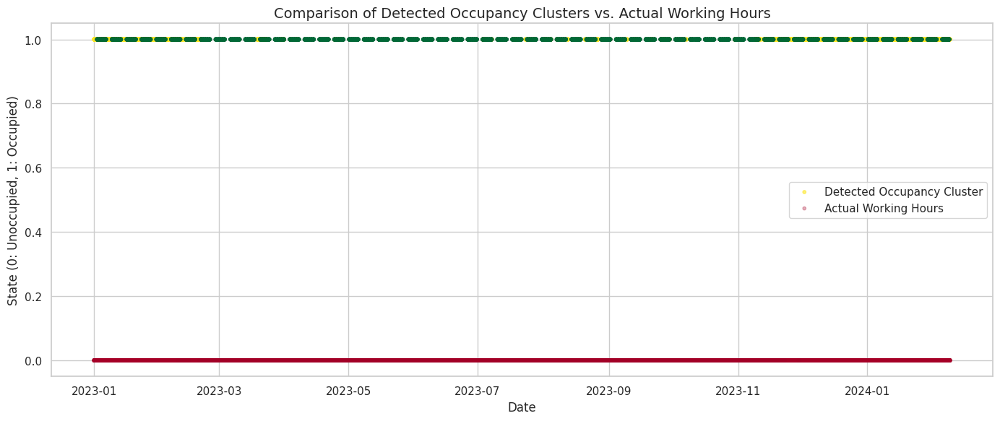

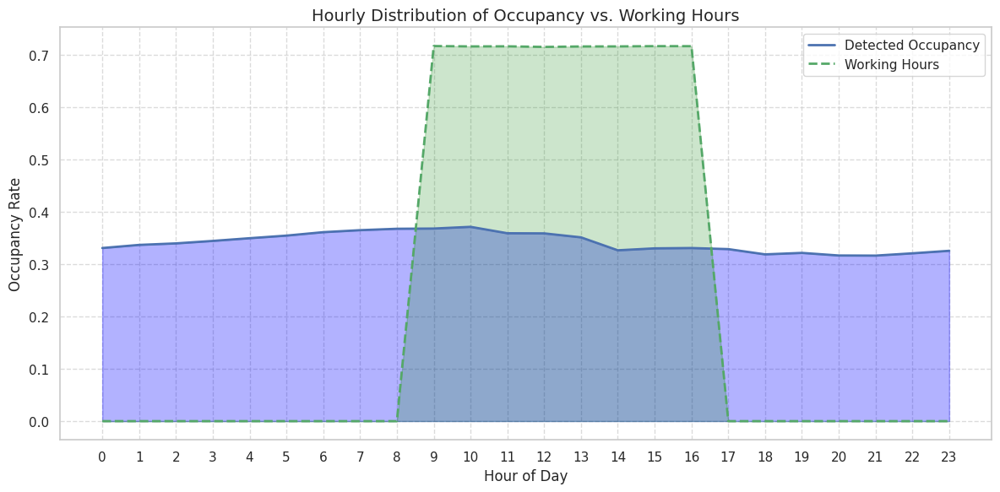

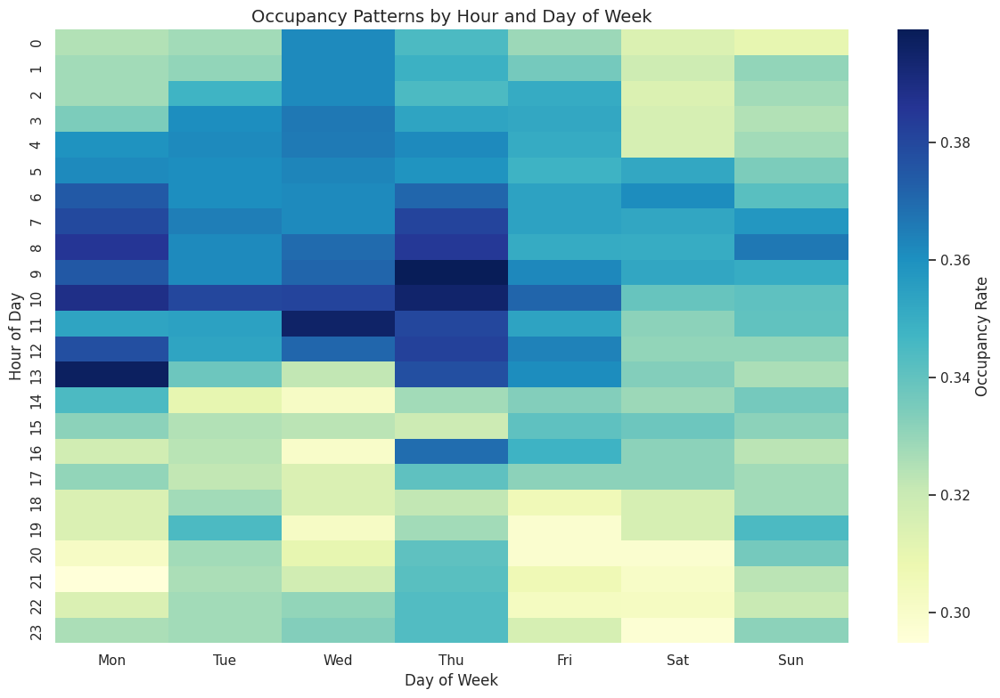

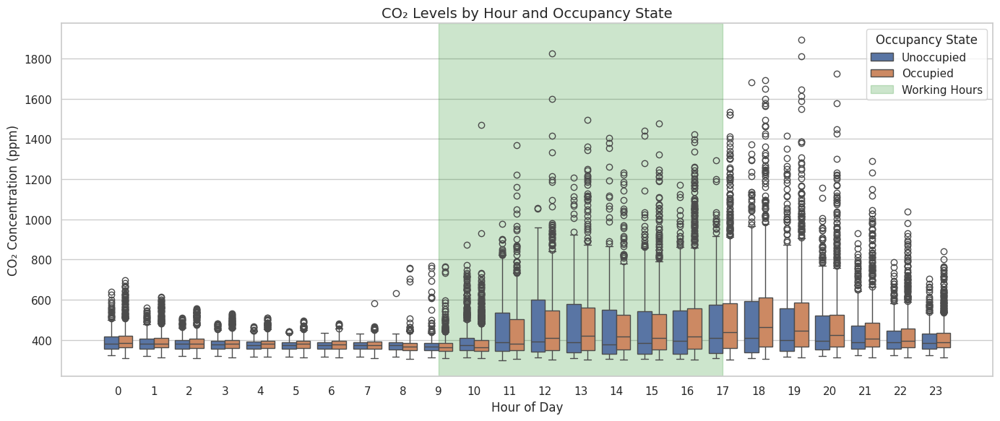

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Load the indoor air quality data
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert CO2 and Temperature to numeric, coercing any non-numeric values to NaN
indoor_df['CO2'] = pd.to_numeric(indoor_df['CO2'], errors='coerce')
indoor_df['Temperature'] = pd.to_numeric(indoor_df['Temperature'], errors='coerce')

# Drop rows with NaN values in CO2 or Temperature
indoor_df = indoor_df.dropna(subset=['CO2', 'Temperature'])

# Extract time features
indoor_df['Hour'] = indoor_df['Datetime'].dt.hour
indoor_df['Weekday'] = indoor_df['Datetime'].dt.weekday
indoor_df['IsWorkingHour'] = ((indoor_df['Hour'] >= 9) & (indoor_df['Hour'] < 17) & (indoor_df['Weekday'] < 5)).astype(int)

# Prepare features for clustering
features = indoor_df[['CO2', 'Temperature']].copy()
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Perform K-means clustering with 2 clusters (occupied vs. unoccupied)
kmeans = KMeans(n_clusters=2, random_state=42)
indoor_df['Cluster'] = kmeans.fit_predict(features_scaled)

# Determine which cluster represents "occupied" (higher CO2 values)
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
occupied_cluster = 0 if cluster_centers[0][0] > cluster_centers[1][0] else 1

# Map clusters to "Occupied" or "Unoccupied" labels
indoor_df['OccupancyState'] = indoor_df['Cluster'].map({occupied_cluster: 'Occupied', 1-occupied_cluster: 'Unoccupied'})

# Plot 1: Compare clusters with working hours over time
plt.figure(figsize=(14, 6))
plt.scatter(indoor_df['Datetime'], indoor_df['Cluster'], c=indoor_df['Cluster'], cmap='viridis',
            alpha=0.6, s=10, label='Detected Occupancy Cluster')
plt.scatter(indoor_df['Datetime'], indoor_df['IsWorkingHour'], c=indoor_df['IsWorkingHour'],
            cmap='RdYlGn', alpha=0.3, s=10, label='Actual Working Hours')
plt.title('Comparison of Detected Occupancy Clusters vs. Actual Working Hours', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('State (0: Unoccupied, 1: Occupied)', fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# Plot 2: Distribution of clusters by hour of day
plt.figure(figsize=(12, 6))
hourly_occupancy = indoor_df.groupby('Hour')['Cluster'].mean()
hourly_working = indoor_df.groupby('Hour')['IsWorkingHour'].mean()

plt.plot(hourly_occupancy.index, hourly_occupancy.values, 'b-', linewidth=2, label='Detected Occupancy')
plt.plot(hourly_working.index, hourly_working.values, 'g--', linewidth=2, label='Working Hours')
plt.fill_between(hourly_occupancy.index, hourly_occupancy.values, alpha=0.3, color='blue')
plt.fill_between(hourly_working.index, hourly_working.values, alpha=0.2, color='green')
plt.title('Hourly Distribution of Occupancy vs. Working Hours', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Occupancy Rate', fontsize=12)
plt.xticks(range(0, 24))
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

# Plot 3: Heatmap of occupancy by hour and weekday
plt.figure(figsize=(12, 8))
hour_weekday_occupancy = indoor_df.pivot_table(
    values='Cluster', index='Hour', columns='Weekday', aggfunc='mean')
sns.heatmap(hour_weekday_occupancy, cmap='YlGnBu',
            xticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
            yticklabels=range(0, 24), cbar_kws={'label': 'Occupancy Rate'})
plt.title('Occupancy Patterns by Hour and Day of Week', fontsize=14)
plt.xlabel('Day of Week', fontsize=12)
plt.ylabel('Hour of Day', fontsize=12)
plt.tight_layout()
plt.show()

# Plot 4: CO2 levels by cluster with working hours
plt.figure(figsize=(14, 6))
sns.boxplot(x='Hour', y='CO2', hue='OccupancyState', data=indoor_df)
plt.axvspan(9, 17, alpha=0.2, color='green', label='Working Hours')
plt.title('CO₂ Levels by Hour and Occupancy State', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('CO₂ Concentration (ppm)', fontsize=12)
plt.legend(title='Occupancy State')
plt.tight_layout()
plt.show()


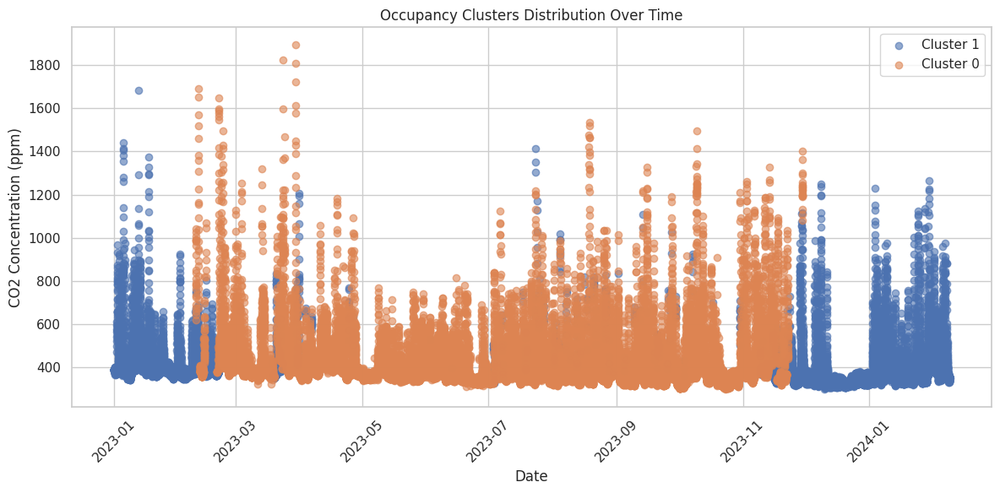

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Load the indoor air quality data
df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity
df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column
df['Datetime'] = pd.to_datetime(df['Date'].astype(str) + ' ' + df['Time'].astype(str), errors='coerce')

# Convert CO2 to numeric, replacing any non-numeric values with NaN
df['CO2'] = pd.to_numeric(df['CO2'], errors='coerce')

# Drop rows with missing values
df = df.dropna(subset=['Datetime', 'CO2'])

# Prepare features for clustering
X = df[['CO2', 'Temperature']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform K-means clustering
kmeans = KMeans(n_clusters=2, random_state=42)
df['Cluster'] = kmeans.fit_predict(X_scaled)

# Create the scatter plot
plt.figure(figsize=(12, 6))
for cluster in df['Cluster'].unique():
    cluster_data = df[df['Cluster'] == cluster]
    plt.scatter(cluster_data['Datetime'], cluster_data['CO2'],
                label=f'Cluster {cluster}', alpha=0.6)

plt.title('Occupancy Clusters Distribution Over Time')
plt.xlabel('Date')
plt.ylabel('CO2 Concentration (ppm)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


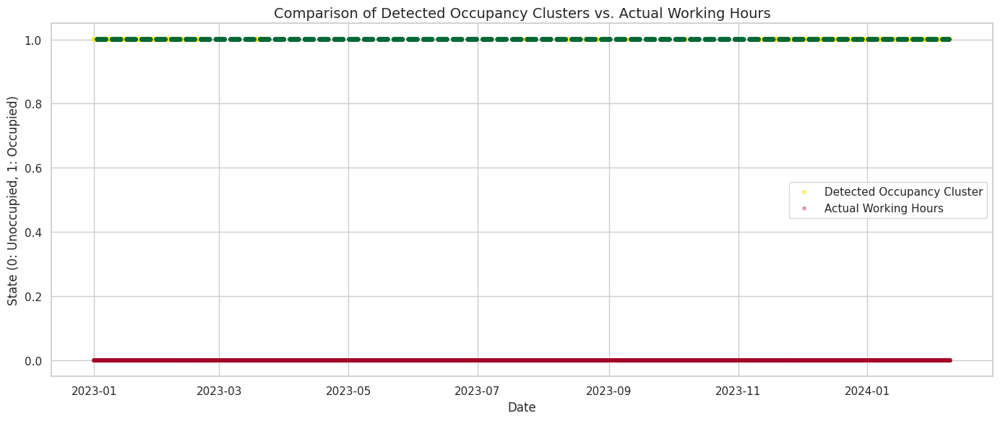

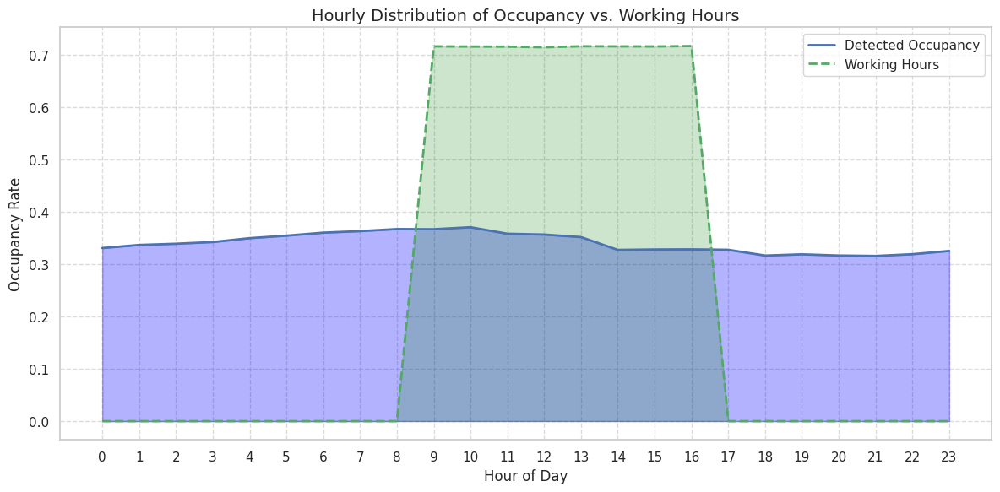

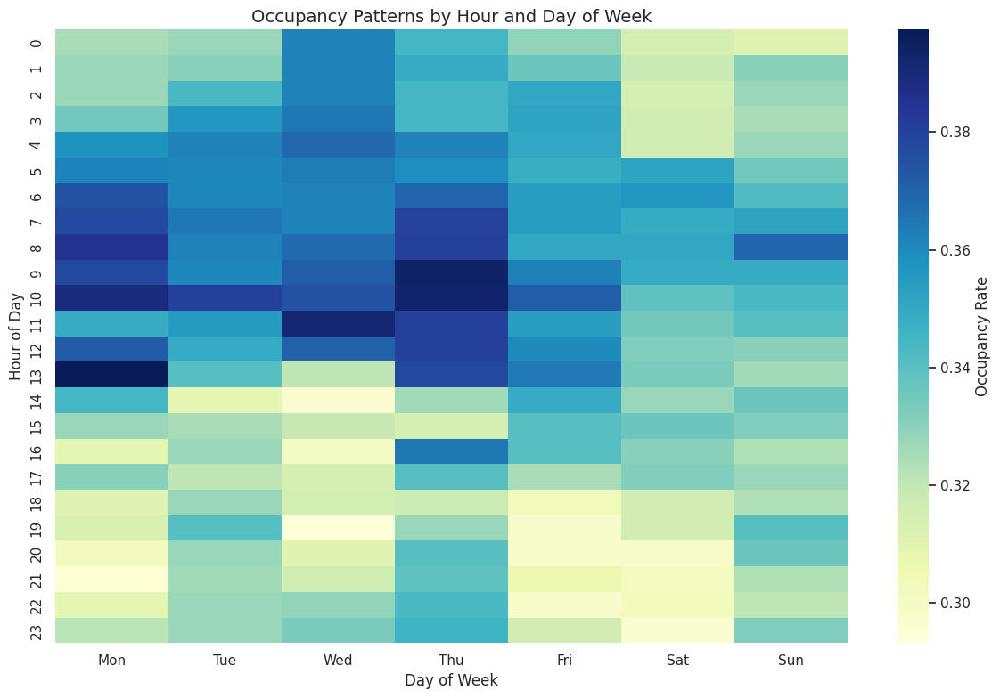

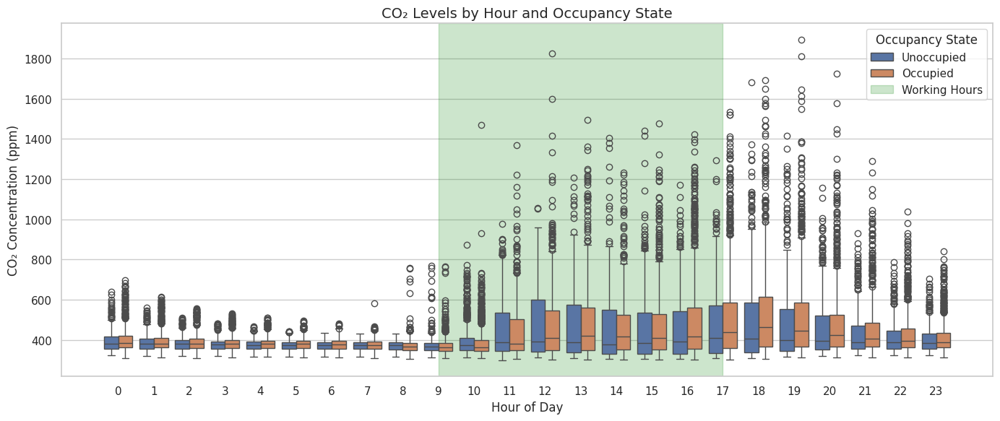

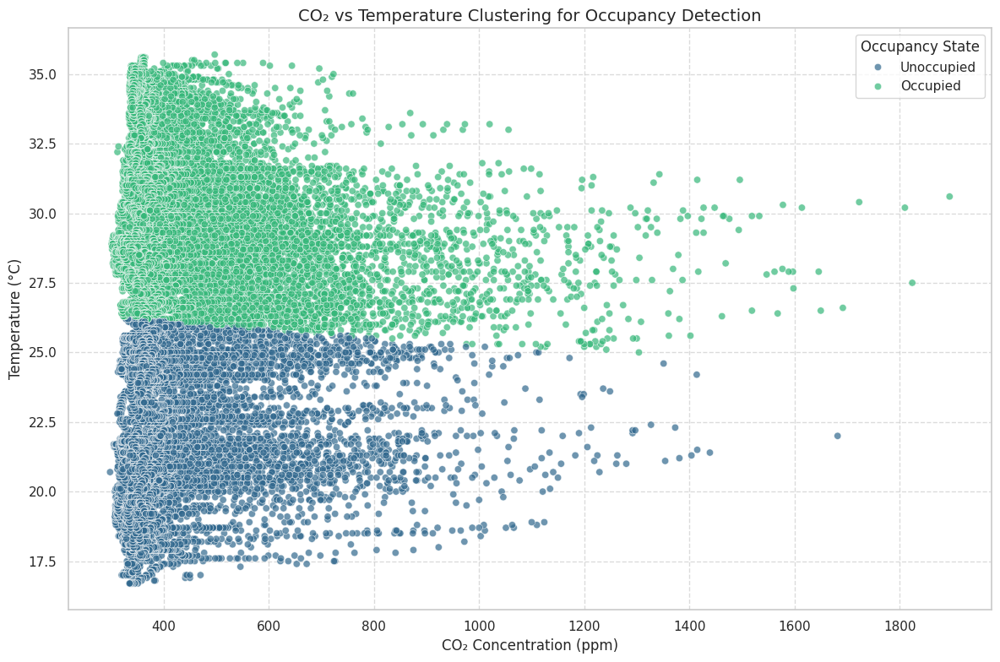

Cluster Centers (CO2, Temperature):
Cluster 0 (Occupied): CO2 = 431.5 ppm, Temperature = 30.1°C
Cluster 1 (Unoccupied): CO2 = 420.4 ppm, Temperature = 22.1°C


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Set a clean plotting style
sns.set(style="whitegrid")

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load the indoor air quality data
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert CO2 and Temperature to numeric, coercing any non-numeric values to NaN
indoor_df['CO2'] = pd.to_numeric(indoor_df['CO2'], errors='coerce')
indoor_df['Temperature'] = pd.to_numeric(indoor_df['Temperature'], errors='coerce')

# Extract time features
indoor_df['Hour'] = indoor_df['Datetime'].dt.hour
indoor_df['Weekday'] = indoor_df['Datetime'].dt.weekday
indoor_df['IsWorkingHour'] = ((indoor_df['Hour'] >= 9) & (indoor_df['Hour'] < 17) & (indoor_df['Weekday'] < 5)).astype(int)

########################################
# 2. Handle Missing Values and Prepare Features
########################################
# Select features for clustering
features = indoor_df[['CO2', 'Temperature']].copy()

# Use SimpleImputer to handle missing values - replace NaNs with the mean
imputer = SimpleImputer(strategy='mean')
features_imputed = imputer.fit_transform(features)

# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_imputed)

########################################
# 3. Perform K-means Clustering
########################################
# Perform K-means clustering with 2 clusters (occupied vs. unoccupied)
kmeans = KMeans(n_clusters=2, random_state=42)
indoor_df['Cluster'] = kmeans.fit_predict(features_scaled)

# Determine which cluster represents "occupied" (higher CO2 values)
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
occupied_cluster = 0 if cluster_centers[0][0] > cluster_centers[1][0] else 1

# Map clusters to "Occupied" or "Unoccupied" labels
indoor_df['OccupancyState'] = indoor_df['Cluster'].map({occupied_cluster: 'Occupied', 1-occupied_cluster: 'Unoccupied'})

########################################
# 4. Visualize Clustering Results
########################################
# Plot 1: Compare clusters with working hours over time
plt.figure(figsize=(14, 6))
plt.scatter(indoor_df['Datetime'], indoor_df['Cluster'], c=indoor_df['Cluster'], cmap='viridis',
            alpha=0.6, s=10, label='Detected Occupancy Cluster')
plt.scatter(indoor_df['Datetime'], indoor_df['IsWorkingHour'], c=indoor_df['IsWorkingHour'],
            cmap='RdYlGn', alpha=0.3, s=10, label='Actual Working Hours')
plt.title('Comparison of Detected Occupancy Clusters vs. Actual Working Hours', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('State (0: Unoccupied, 1: Occupied)', fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# Plot 2: Distribution of clusters by hour of day
plt.figure(figsize=(12, 6))
hourly_occupancy = indoor_df.groupby('Hour')['Cluster'].mean()
hourly_working = indoor_df.groupby('Hour')['IsWorkingHour'].mean()

plt.plot(hourly_occupancy.index, hourly_occupancy.values, 'b-', linewidth=2, label='Detected Occupancy')
plt.plot(hourly_working.index, hourly_working.values, 'g--', linewidth=2, label='Working Hours')
plt.fill_between(hourly_occupancy.index, hourly_occupancy.values, alpha=0.3, color='blue')
plt.fill_between(hourly_working.index, hourly_working.values, alpha=0.2, color='green')
plt.title('Hourly Distribution of Occupancy vs. Working Hours', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Occupancy Rate', fontsize=12)
plt.xticks(range(0, 24))
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

# Plot 3: Heatmap of occupancy by hour and weekday
plt.figure(figsize=(12, 8))
hour_weekday_occupancy = indoor_df.pivot_table(
    values='Cluster', index='Hour', columns='Weekday', aggfunc='mean')
sns.heatmap(hour_weekday_occupancy, cmap='YlGnBu',
            xticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
            yticklabels=range(0, 24), cbar_kws={'label': 'Occupancy Rate'})
plt.title('Occupancy Patterns by Hour and Day of Week', fontsize=14)
plt.xlabel('Day of Week', fontsize=12)
plt.ylabel('Hour of Day', fontsize=12)
plt.tight_layout()
plt.show()

# Plot 4: CO2 levels by cluster with working hours
plt.figure(figsize=(14, 6))
sns.boxplot(x='Hour', y='CO2', hue='OccupancyState', data=indoor_df)
plt.axvspan(9, 17, alpha=0.2, color='green', label='Working Hours')
plt.title('CO₂ Levels by Hour and Occupancy State', fontsize=14)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('CO₂ Concentration (ppm)', fontsize=12)
plt.legend(title='Occupancy State')
plt.tight_layout()
plt.show()

# Plot 5: Scatter plot of CO2 vs Temperature with clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x='CO2', y='Temperature', hue='OccupancyState', data=indoor_df, palette='viridis', alpha=0.7)
plt.title('CO₂ vs Temperature Clustering for Occupancy Detection', fontsize=14)
plt.xlabel('CO₂ Concentration (ppm)', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.legend(title='Occupancy State')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("Cluster Centers (CO2, Temperature):")
for i, center in enumerate(cluster_centers):
    state = "Occupied" if i == occupied_cluster else "Unoccupied"
    print(f"Cluster {i} ({state}): CO2 = {center[0]:.1f} ppm, Temperature = {center[1]:.1f}°C")


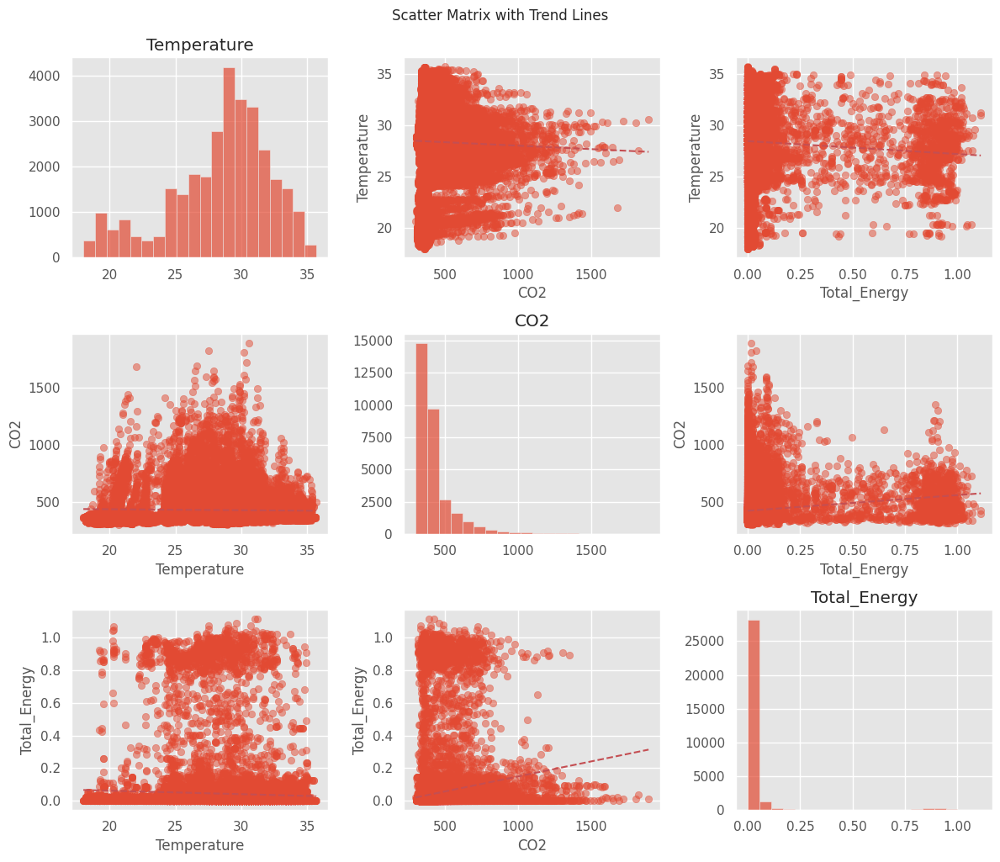

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Use a built-in matplotlib style instead of seaborn
plt.style.use('ggplot')  # Alternative: 'fivethirtyeight', 'bmh', etc.

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load the indoor air quality data from the Excel file (sheet "PAoffice")
indoor_file = 'Indoor-Air-Quality.xlsx'
indoor_df = pd.read_excel(indoor_file, sheet_name='PAoffice')

# Rename columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column by concatenating Date and Time
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert CO₂ and Temperature columns to numeric (handle non-numeric entries like "###")
indoor_df['CO2'] = pd.to_numeric(indoor_df['CO2'], errors='coerce')
indoor_df['Temperature'] = pd.to_numeric(indoor_df['Temperature'], errors='coerce')

########################################
# 2. Load and Preprocess Outdoor Air Quality Data
########################################
outdoor_file = 'Outdoor-Air-Quality.xlsx'
outdoor_df = pd.read_excel(outdoor_file, sheet_name='OUTDOOR DATA - Air quality', skiprows=8, header=None)

# Assign column names manually
outdoor_df.columns = ['Datetime', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Convert the Datetime column to datetime
outdoor_df['Datetime'] = pd.to_datetime(outdoor_df['Datetime'], errors='coerce')

# Convert measurement columns to numeric
for col in ['CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    outdoor_df[col] = pd.to_numeric(outdoor_df[col], errors='coerce')

########################################
# 3. Load and Preprocess Energy Data
########################################
energy_file = 'ENERGYDATA.xlsx'
energy_df = pd.read_excel(energy_file, sheet_name='ENERGYDATA')

# Rename columns for clarity
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert the Datetime column to datetime
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy columns to numeric, replacing non-numeric values with NaN
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

########################################
# 4. Create Scatter Matrix with Trend Lines
########################################
# Merge datasets on Datetime column
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))

# Select key variables for the scatter matrix
variables = ['Temperature', 'CO2', 'Total_Energy']
subset_df = merged_df[variables].dropna()

# Create individual scatter plots with trend lines
fig, axes = plt.subplots(3, 3, figsize=(12, 10))

for i, var1 in enumerate(variables):
    for j, var2 in enumerate(variables):
        ax = axes[i, j]

        if i == j:  # Diagonal: histogram
            ax.hist(subset_df[var1], bins=20, alpha=0.7)
            ax.set_title(var1)
        else:  # Off-diagonal: scatter plot with trend line
            ax.scatter(subset_df[var2], subset_df[var1], alpha=0.5)

            # Add trend line
            z = np.polyfit(subset_df[var2], subset_df[var1], 1)
            p = np.poly1d(z)
            x_range = np.linspace(subset_df[var2].min(), subset_df[var2].max(), 100)
            ax.plot(x_range, p(x_range), 'r--')

            ax.set_xlabel(var2)
            ax.set_ylabel(var1)

plt.tight_layout()
plt.suptitle("Scatter Matrix with Trend Lines", y=1.02)
plt.show()


In [ ]:
# Install seaborn (run this cell first)
!pip install seaborn

# Then import it
import seaborn as sns


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Now you can use seaborn styles
sns.set(style="whitegrid")

# Rest of your code remains the same


Columns in merged_df: ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity', 'Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan', 'Total_Energy']


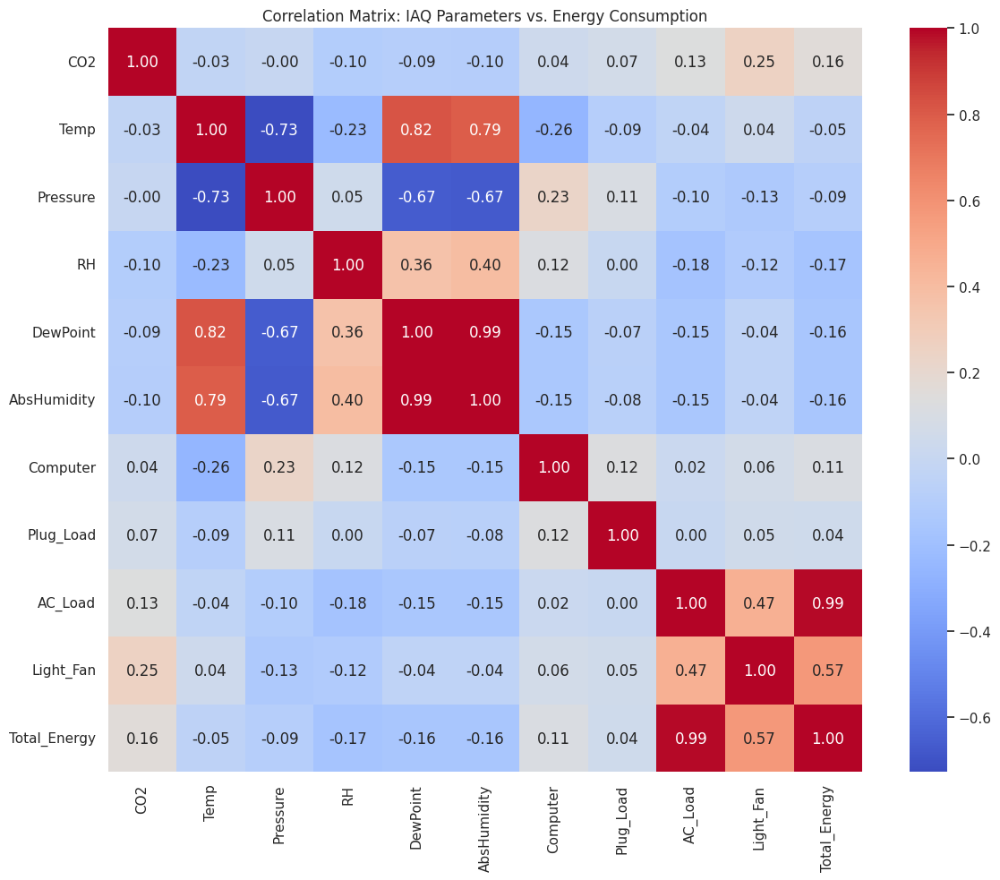

Correlation Coefficients between IAQ Parameters and Energy Consumption:
             Computer  Plug_Load   AC_Load  Light_Fan  Total_Energy
CO2          0.039617   0.065932  0.130409   0.251199      0.158515
Temp        -0.259787  -0.089668 -0.035719   0.040493     -0.051565
Pressure     0.232126   0.105666 -0.100039  -0.132247     -0.088131
RH           0.120658   0.003388 -0.177718  -0.115281     -0.169492
DewPoint    -0.146229  -0.072147 -0.149139  -0.041154     -0.157384
AbsHumidity -0.145706  -0.079005 -0.148781  -0.042480     -0.157338


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Load preprocessed datasets
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename indoor columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert indoor measurements to numeric
for col in ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Process energy data
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy columns to numeric, replacing "No CT" with NaN
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Sort both dataframes by datetime
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)

# Merge datasets based on nearest timestamp
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))

# Define IAQ parameters and energy variables using the actual column names in the merged dataframe
iaq_params = ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
energy_vars = ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan', 'Total_Energy']

# Verify columns exist in the dataframe
print("Columns in merged_df:", merged_df.columns.tolist())

# Compute correlation matrix using only columns that exist in the dataframe
correlation_matrix = merged_df[iaq_params + energy_vars].corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix: IAQ Parameters vs. Energy Consumption')
plt.tight_layout()
plt.show()

# Extract specific correlations between IAQ and energy variables
iaq_energy_corr = correlation_matrix.loc[iaq_params, energy_vars]
print("Correlation Coefficients between IAQ Parameters and Energy Consumption:")
print(iaq_energy_corr)

# Save the correlation matrix to a CSV file
iaq_energy_corr.to_csv('IAQ_Energy_Correlations.csv')


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Load the datasets
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename columns for indoor data
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create datetime column for indoor data
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert indoor measurements to numeric
for col in ['CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Rename columns for energy data
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert datetime for energy data
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy columns to numeric (replacing "No CT" with NaN)
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Sort both datasets by datetime
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)

# Merge datasets based on nearest timestamp
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))

# Drop rows with missing values
merged_df = merged_df.dropna(subset=['CO2', 'Temperature', 'RH', 'Total_Energy'])


In [ ]:
# Define IAQ factors and target variable
iaq_factors = ['CO2', 'Temperature', 'RH', 'Pressure', 'DewPoint', 'AbsHumidity']
target = 'Total_Energy'

# Function to build and evaluate simple linear regression model
def build_simple_regression(X, y, feature_name):
    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create and fit the model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Get coefficient and intercept
    coef = model.coef_[0]
    intercept = model.intercept_

    return {
        'feature': feature_name,
        'r2': r2,
        'rmse': rmse,
        'coefficient': coef,
        'intercept': intercept,
        'model': model,
        'X_test': X_test,
        'y_test': y_test,
        'y_pred': y_pred
    }

# Build regression models for each IAQ factor
results = []
for factor in iaq_factors:
    X = merged_df[[factor]]
    y = merged_df[target]
    result = build_simple_regression(X, y, factor)
    results.append(result)

# Create a results dataframe
results_df = pd.DataFrame([{
    'IAQ Factor': r['feature'],
    'R² Value': r['r2'],
    'RMSE': r['rmse'],
    'Coefficient': r['coefficient'],
    'Intercept': r['intercept']
} for r in results])

print("Simple Linear Regression Results:")
print(results_df.sort_values('R² Value', ascending=False))


In [ ]:
# Plot regression lines for each IAQ factor
plt.figure(figsize=(15, 10))

for i, result in enumerate(results):
    plt.subplot(2, 3, i+1)

    feature = result['feature']
    X_test = result['X_test']
    y_test = result['y_test']
    y_pred = result['y_pred']
    r2 = result['r2']
    coef = result['coefficient']
    intercept = result['intercept']

    plt.scatter(X_test, y_test, alpha=0.5)
    plt.plot(X_test, y_pred, color='red', linewidth=2)

    plt.title(f'{feature} vs. Total Energy (R² = {r2:.3f})')
    plt.xlabel(feature)
    plt.ylabel('Total Energy Consumption (kW)')
    plt.annotate(f'y = {coef:.4f}x + {intercept:.4f}',
                 xy=(0.05, 0.95), xycoords='axes fraction',
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

# Plot the best predictor with more detail
best_result = max(results, key=lambda x: x['r2'])
best_feature = best_result['feature']

plt.figure(figsize=(10, 6))
plt.scatter(merged_df[best_feature], merged_df['Total_Energy'], alpha=0.5)
X_line = np.array([merged_df[best_feature].min(), merged_df[best_feature].max()]).reshape(-1, 1)
y_line = best_result['model'].predict(X_line)
plt.plot(X_line, y_line, color='red', linewidth=2)
plt.title(f'{best_feature} vs. Total Energy Consumption (R² = {best_result["r2"]:.3f})')
plt.xlabel(best_feature)
plt.ylabel('Total Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
# Build multiple linear regression model
X_multi = merged_df[iaq_factors]
y_multi = merged_df[target]

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_multi, y_multi, test_size=0.2, random_state=42)

# Create and fit the model
multi_model = LinearRegression()
multi_model.fit(X_train, y_train)

# Make predictions
y_pred = multi_model.predict(X_test)

# Evaluate the model
r2_multi = r2_score(y_test, y_pred)
rmse_multi = np.sqrt(mean_squared_error(y_test, y_pred))

print("\nMultiple Linear Regression Results:")
print(f"R² Value: {r2_multi:.3f}")
print(f"RMSE: {rmse_multi:.3f}")

# Create a dataframe of coefficients
coef_df = pd.DataFrame({
    'IAQ Factor': iaq_factors,
    'Coefficient': multi_model.coef_
})
print("\nMultiple Regression Coefficients:")
print(coef_df.sort_values('Coefficient', ascending=False))

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Multiple Linear Regression: Actual vs. Predicted Energy Consumption')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb

# Load and merge the datasets
indoor_df = pd.read_csv('Processed_Indoor_Air_Quality.csv')
energy_df = pd.read_csv('Processed_Energy_Data.csv')

# Merge datasets on Datetime column
merged_df = pd.merge(indoor_df, energy_df, on='Datetime')

# Select features and target
features = ['CO2', 'Temperature', 'RH', 'Pressure', 'DewPoint', 'AbsHumidity']
target = 'Total_Energy'

X = merged_df[features]
y = merged_df[target]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


KeyError: "['Temperature'] not in index"

Columns in merged_df: ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity', 'Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan', 'Total_Energy']
NaN values in X: 0
NaN values in y: 0
Random Forest - R²: 0.3046, RMSE: 0.1313

Feature Importance:
  Feature  Importance
2      RH    0.359485
1    Temp    0.324072
0     CO2    0.316443


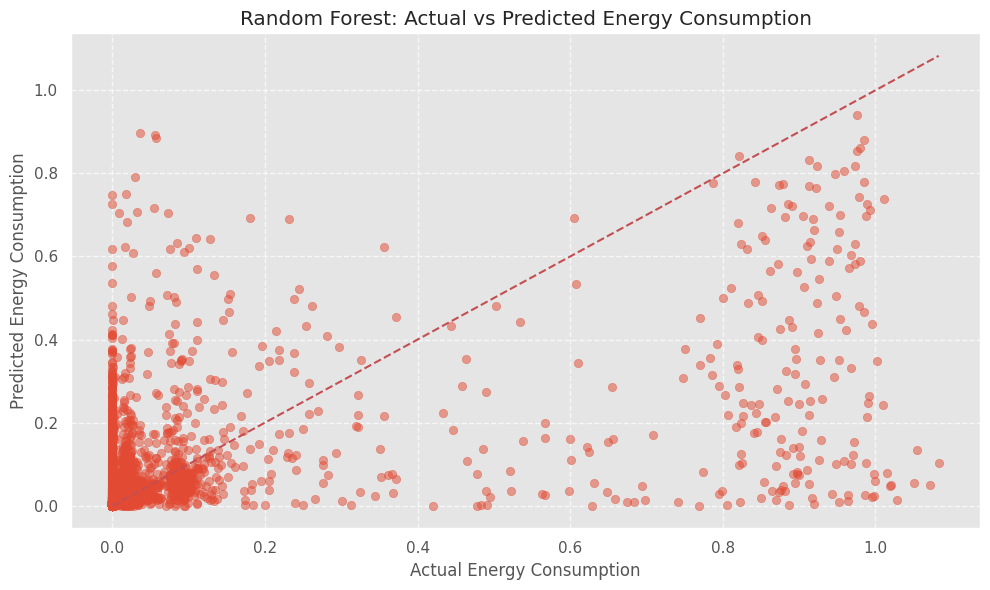

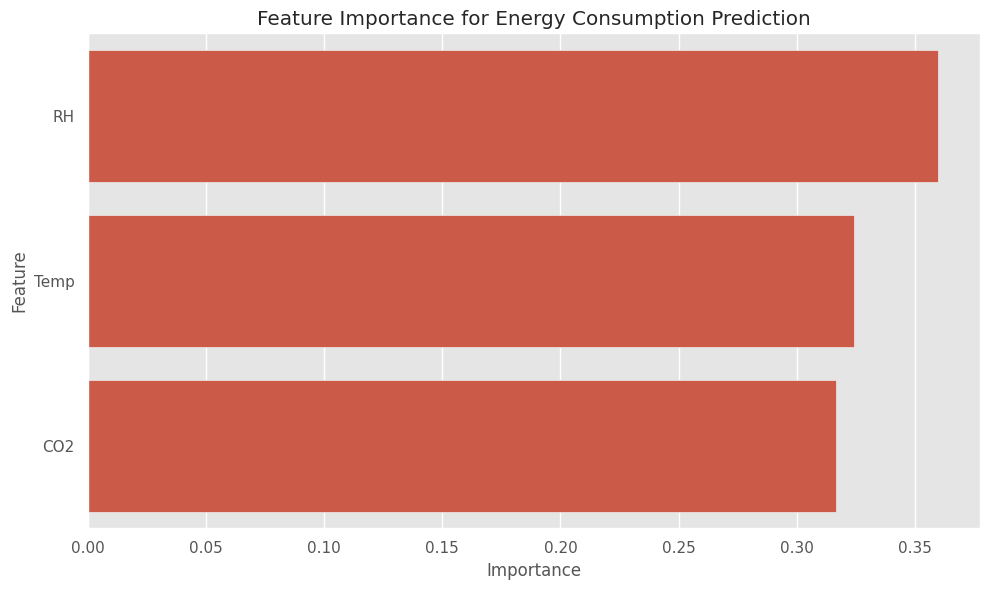

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the indoor air quality data
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert all measurement columns to numeric
for col in ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Load the energy data
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename columns for clarity
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert datetime column
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy columns to numeric
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')

# Replace NaN values with 0 for energy data
energy_df = energy_df.fillna(0)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Sort both dataframes by datetime
indoor_df = indoor_df.sort_values('Datetime')
energy_df = energy_df.sort_values('Datetime')

# Merge datasets
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))

# Print columns to verify
print("Columns in merged_df:", merged_df.columns.tolist())

# Remove rows with NaN values in any column that will be used for modeling
merged_df = merged_df.dropna(subset=['CO2', 'Temp', 'RH', 'Total_Energy'])

# Define features and target
features = ['CO2', 'Temp', 'RH']
X = merged_df[features]
y = merged_df['Total_Energy']

# Verify no NaN values in X and y
print("NaN values in X:", X.isna().sum().sum())
print("NaN values in y:", y.isna().sum())

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
rf_r2 = r2_score(y_test, rf_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_pred))

print(f"Random Forest - R²: {rf_r2:.4f}, RMSE: {rf_rmse:.4f}")

# Feature importance
feature_importance = pd.DataFrame({
    'Feature': features,
    'Importance': rf_model.feature_importances_
})
print("\nFeature Importance:")
print(feature_importance.sort_values('Importance', ascending=False))

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, rf_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Energy Consumption')
plt.ylabel('Predicted Energy Consumption')
plt.title('Random Forest: Actual vs Predicted Energy Consumption')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance.sort_values('Importance', ascending=False))
plt.title('Feature Importance for Energy Consumption Prediction')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


<ipython-input-45-9ab1b68ca241>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')


ARIMA RMSE: 0.0794


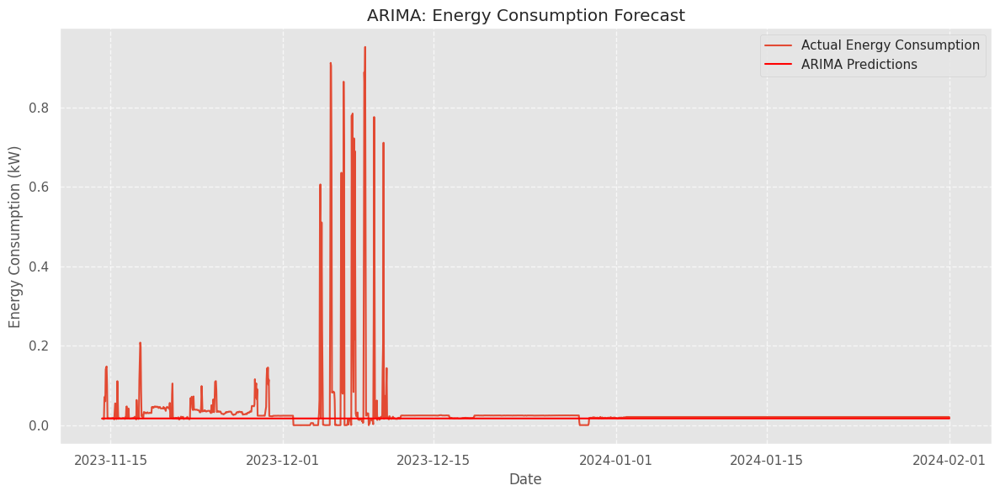

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

# Load energy data
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Preprocess data
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'])
energy_df.set_index('Datetime', inplace=True)

# Convert non-numeric values to numeric
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df.sum(axis=1)

# Resample to hourly data for better forecasting
# Using 'h' instead of 'H' to address the FutureWarning
hourly_energy = energy_df['Total_Energy'].resample('h').mean()

# Fill any NaN values that might have been introduced during resampling
hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')

# Split into train and test sets
train_size = int(len(hourly_energy) * 0.8)
train, test = hourly_energy[:train_size], hourly_energy[train_size:]

# Make sure there are no NaN values in the test set
test = test.dropna()

# Fit ARIMA model
model = ARIMA(train, order=(5,1,0))
model_fit = model.fit()

# Make predictions
predictions = model_fit.forecast(steps=len(test))

# Ensure predictions and test have the same index
predictions = pd.Series(predictions, index=test.index)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test, predictions))
print(f'ARIMA RMSE: {rmse:.4f}')

# Plot results
plt.figure(figsize=(12, 6))
plt.plot(test.index, test, label='Actual Energy Consumption')
plt.plot(test.index, predictions, color='red', label='ARIMA Predictions')
plt.title('ARIMA: Energy Consumption Forecast')
plt.xlabel('Date')
plt.ylabel('Energy Consumption (kW)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Epoch 1/50


<ipython-input-44-eae6d31d38f4>:30: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


236/236 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0181
Epoch 2/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0141
Epoch 3/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0133
Epoch 4/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0117
Epoch 5/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0116
Epoch 6/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0108
Epoch 7/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0108
Epoch 8/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0124
Epoch 9/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0117
Epoch 10/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0125
Epoch 11/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0112
Epoch 12/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0116
Epoch 13/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0121
Epoch 14/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0116
Epoch 15/50
236/236 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.01

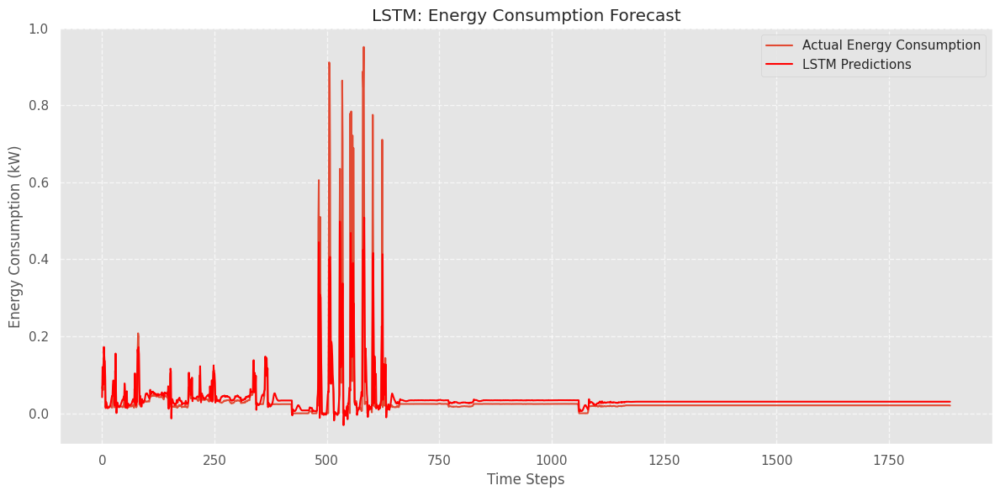

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error

# Load and preprocess energy data
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')
energy_df.set_index('Datetime', inplace=True)

# Convert non-numeric values to numeric
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')

# Fill missing values with 0 (or use other imputation methods)
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df.sum(axis=1)

# Resample to hourly data
hourly_energy = energy_df['Total_Energy'].resample('h').mean()

# Fill any NaN values that might have been introduced during resampling
hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(hourly_energy.values.reshape(-1, 1))

# Create sequences for LSTM
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length, 0])
        y.append(data[i + seq_length, 0])
    return np.array(X), np.array(y)

# Use 24 hours of data to predict the next hour
seq_length = 24

# Make sure we have enough data
if len(scaled_data) > seq_length:
    X, y = create_sequences(scaled_data, seq_length)

    # Split into train and test sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Reshape input for LSTM [samples, time steps, features]
    X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
    X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

    # Build LSTM model
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], 1)),
        Dropout(0.2),
        LSTM(50),
        Dropout(0.2),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1)

    # Make predictions
    predictions = model.predict(X_test)

    # Inverse transform to original scale
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    predictions = scaler.inverse_transform(predictions)

    # Check for NaN values before calculating RMSE
    if np.isnan(y_test_actual).any() or np.isnan(predictions).any():
        # Remove NaN values
        mask = ~(np.isnan(y_test_actual) | np.isnan(predictions))
        y_test_clean = y_test_actual[mask]
        predictions_clean = predictions[mask]

        # Calculate RMSE only if we have valid data points
        if len(y_test_clean) > 0:
            rmse = np.sqrt(mean_squared_error(y_test_clean, predictions_clean))
            print(f'LSTM RMSE: {rmse:.4f}')
        else:
            print("No valid data points for RMSE calculation after removing NaNs")
    else:
        # Calculate RMSE if no NaNs
        rmse = np.sqrt(mean_squared_error(y_test_actual, predictions))
        print(f'LSTM RMSE: {rmse:.4f}')

    # Plot results
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_actual, label='Actual Energy Consumption')
    plt.plot(predictions, color='red', label='LSTM Predictions')
    plt.title('LSTM: Energy Consumption Forecast')
    plt.xlabel('Time Steps')
    plt.ylabel('Energy Consumption (kW)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
else:
    print(f"Not enough data for LSTM modeling. Need at least {seq_length+1} data points, but have {len(scaled_data)}.")


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Load energy data
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Preprocess data
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'])
energy_df.set_index('Datetime', inplace=True)

# Convert energy columns to numeric, replacing "No CT" with NaN
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Resample to hourly data
hourly_energy = energy_df['Total_Energy'].resample('H').mean()

# Function for ARIMA rolling forecast
def arima_rolling_forecast(data, n_test, order, epochs):
    history = data[:-n_test].tolist()
    predictions = []

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        for t in range(n_test):
            model = ARIMA(history, order=order)
            model_fit = model.fit()
            output = model_fit.forecast()
            yhat = output[0]
            predictions.append(yhat)
            obs = data[-n_test+t]
            history.append(obs)
            print(f"Predicted: {yhat:.2f}, Expected: {obs:.2f}")

    return predictions

# Set parameters
n_test = 24 * 7  # One week of hourly data
order = (1, 1, 1)  # ARIMA order (p,d,q)
epochs = 5

# Perform rolling forecast
predictions = arima_rolling_forecast(hourly_energy, n_test, order, epochs)

# Evaluate the model
rmse = sqrt(mean_squared_error(hourly_energy[-n_test:], predictions[-n_test:]))
print(f'ARIMA RMSE: {rmse:.4f}')

# Plot results
plt.figure(figsize=(12, 6))
plt.plot(hourly_energy.index[-n_test:], hourly_energy[-n_test:], label='Actual Energy Consumption')
plt.plot(hourly_energy.index[-n_test:], predictions[-n_test:], color='red', label='ARIMA Predictions')
plt.title('ARIMA: Energy Consumption Forecast (Multi-Epoch)')
plt.xlabel('Date')
plt.ylabel('Energy Consumption (kW)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


<ipython-input-42-21c606aceeae>:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_energy = energy_df['Total_Energy'].resample('H').mean()
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Epoch 1/5


<ipython-input-42-21c606aceeae>:40: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  obs = data[-n_test+t]


Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan
Predicted: 0.04, Expected: nan


KeyboardInterrupt: 

Simple Linear Regression Results:
  IAQ Parameter  R² Value      RMSE  Coefficient
2            RH  0.028691  0.155892    -0.002733
0           CO2  0.025127  0.156178     0.000183
4      DewPoint  0.024758  0.156207    -0.005938
5   AbsHumidity  0.024739  0.156209    -0.006032
3      Pressure  0.007769  0.157562    -0.002383
1          Temp  0.002664  0.157967    -0.002123


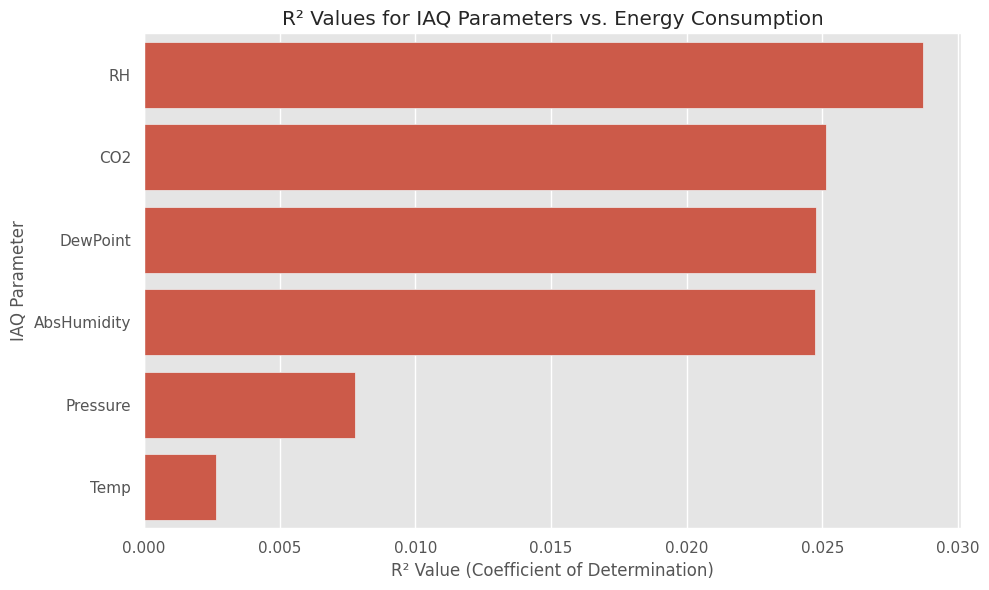

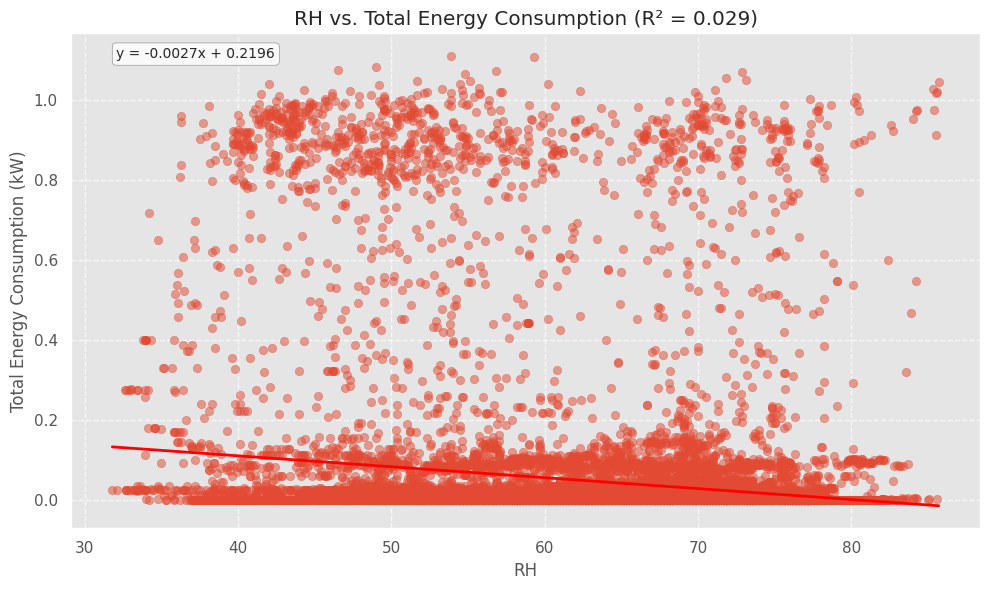


Multiple Linear Regression Results:
R² Value: 0.095
RMSE: 0.150

Multiple Regression Coefficients:
  IAQ Parameter  Coefficient
1          Temp     0.032085
2            RH     0.009274
0           CO2     0.000137
3      Pressure    -0.007191
5   AbsHumidity    -0.009732
4      DewPoint    -0.036052


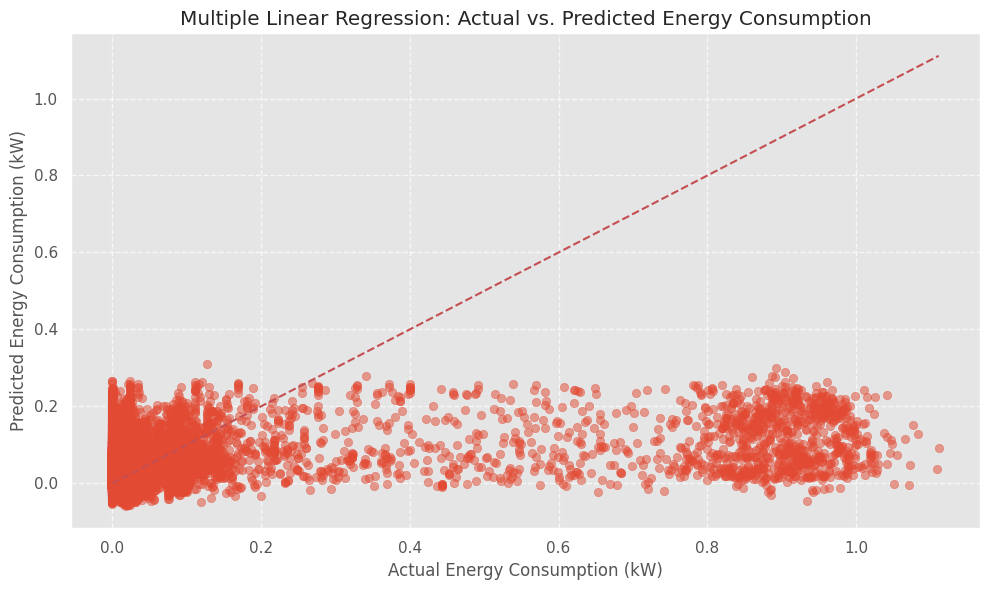

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

# Set style for plots
plt.style.use('ggplot')

# Load datasets
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Create datetime column for indoor data
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert columns to numeric
for col in ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Convert energy data datetime and numeric columns
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Sort dataframes by datetime
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)

# Merge datasets with a 5-minute tolerance
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))
merged_df = merged_df.dropna(subset=['CO2', 'Temp', 'RH', 'Total_Energy'])

# Define IAQ parameters and target variable
iaq_params = ['CO2', 'Temp', 'RH', 'Pressure', 'DewPoint', 'AbsHumidity']
target = 'Total_Energy'

# Function to build simple linear regression and calculate R²
def build_simple_regression(feature, target_col):
    X = merged_df[[feature]].values
    y = merged_df[target_col].values

    model = LinearRegression()
    model.fit(X, y)

    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred))

    return {
        'feature': feature,
        'r2': r2,
        'rmse': rmse,
        'coefficient': model.coef_[0],
        'intercept': model.intercept_,
        'model': model
    }

# Build regression models for each IAQ parameter
results = []
for param in iaq_params:
    result = build_simple_regression(param, target)
    results.append(result)

# Create results dataframe
results_df = pd.DataFrame([{
    'IAQ Parameter': r['feature'],
    'R² Value': r['r2'],
    'RMSE': r['rmse'],
    'Coefficient': r['coefficient']
} for r in results]).sort_values('R² Value', ascending=False)

print("Simple Linear Regression Results:")
print(results_df)

# Visualize R² values
plt.figure(figsize=(10, 6))
sns.barplot(x='R² Value', y='IAQ Parameter', data=results_df)
plt.title('R² Values for IAQ Parameters vs. Energy Consumption')
plt.xlabel('R² Value (Coefficient of Determination)')
plt.ylabel('IAQ Parameter')
plt.tight_layout()
plt.show()

# Plot regression line for the parameter with highest R²
best_param = results_df.iloc[0]['IAQ Parameter']
best_result = next(r for r in results if r['feature'] == best_param)

plt.figure(figsize=(10, 6))
plt.scatter(merged_df[best_param], merged_df['Total_Energy'], alpha=0.5)
plt.plot(
    np.sort(merged_df[best_param]),
    best_result['model'].predict(np.sort(merged_df[best_param]).reshape(-1, 1)),
    color='red', linewidth=2
)
plt.title(f'{best_param} vs. Total Energy Consumption (R² = {best_result["r2"]:.3f})')
plt.xlabel(best_param)
plt.ylabel('Total Energy Consumption (kW)')
plt.annotate(
    f'y = {best_result["coefficient"]:.4f}x + {best_result["intercept"]:.4f}',
    xy=(0.05, 0.95), xycoords='axes fraction',
    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8)
)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Multiple regression model
X_multi = merged_df[iaq_params]
y_multi = merged_df[target]

multi_model = LinearRegression()
multi_model.fit(X_multi, y_multi)
y_pred = multi_model.predict(X_multi)

r2_multi = r2_score(y_multi, y_pred)
rmse_multi = np.sqrt(mean_squared_error(y_multi, y_pred))

print(f"\nMultiple Linear Regression Results:")
print(f"R² Value: {r2_multi:.3f}")
print(f"RMSE: {rmse_multi:.3f}")

# Coefficients of multiple regression
coef_df = pd.DataFrame({
    'IAQ Parameter': iaq_params,
    'Coefficient': multi_model.coef_
}).sort_values('Coefficient', ascending=False)

print("\nMultiple Regression Coefficients:")
print(coef_df)

# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_multi, y_pred, alpha=0.5)
plt.plot([y_multi.min(), y_multi.max()], [y_multi.min(), y_multi.max()], 'r--')
plt.title('Multiple Linear Regression: Actual vs. Predicted Energy Consumption')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


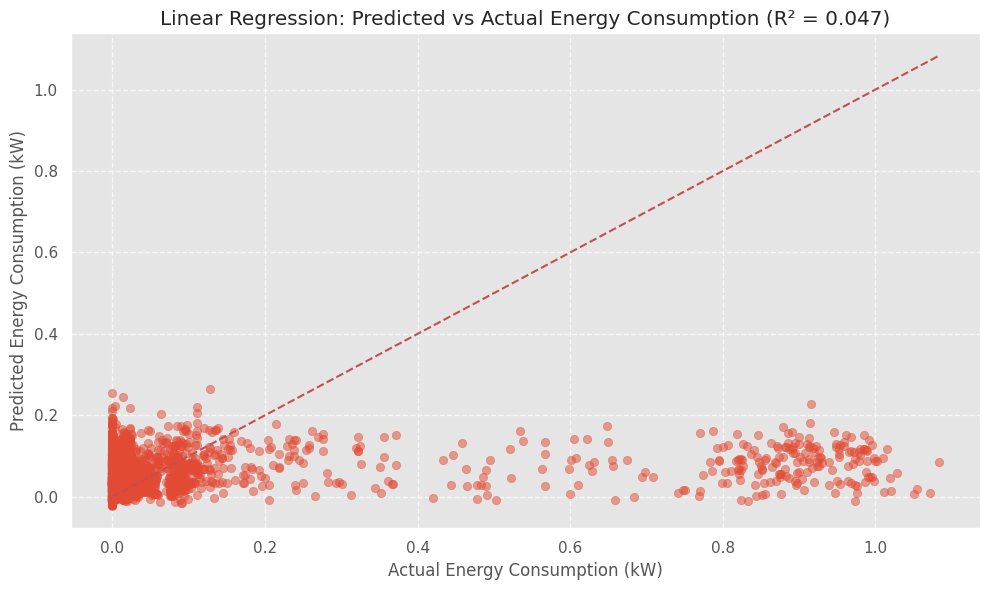

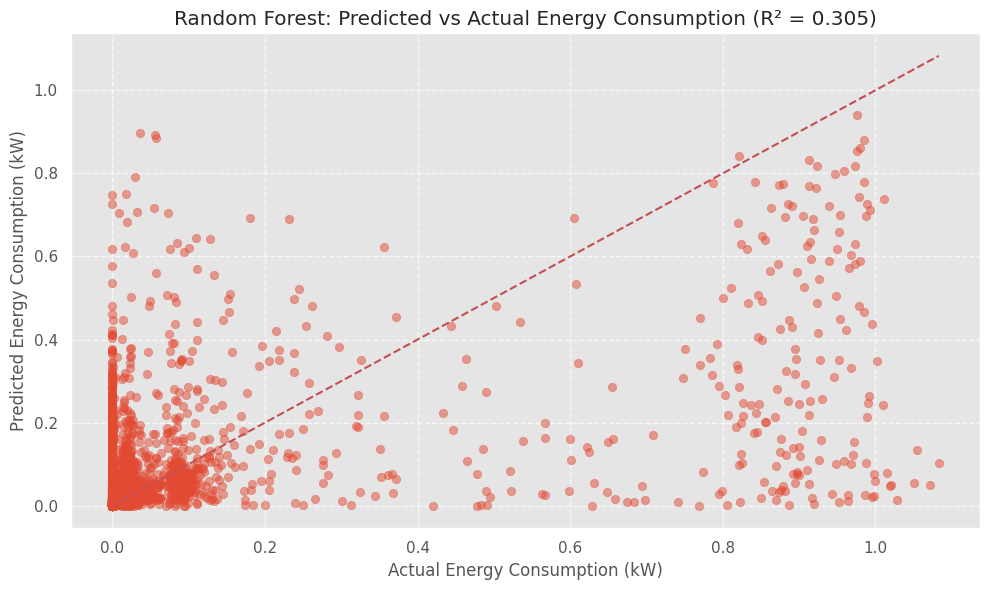

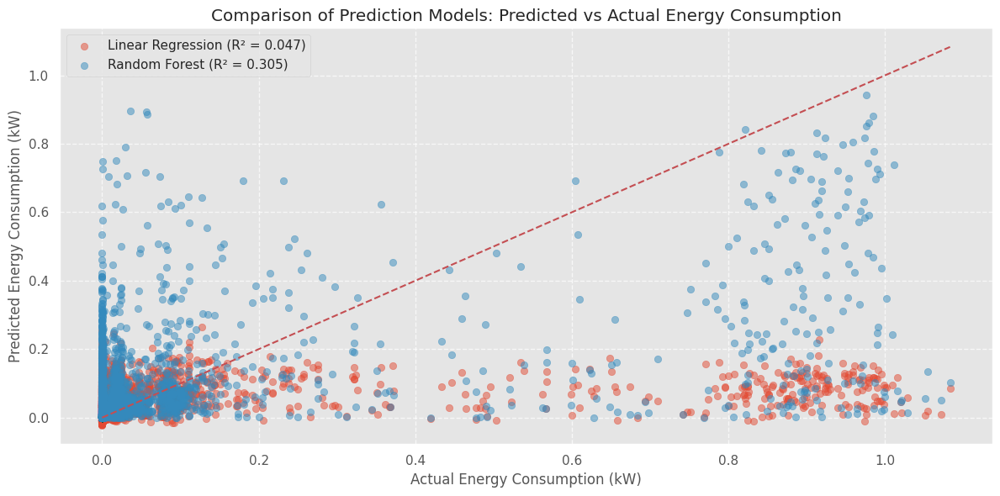

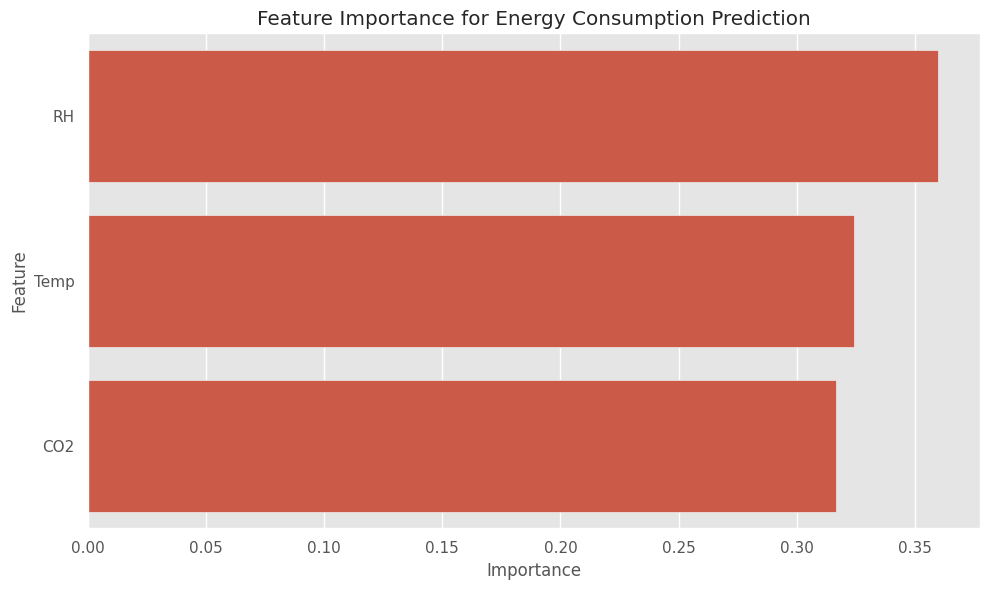

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load datasets
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Preprocess indoor data
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')
for col in ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Preprocess energy data
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Sort and merge datasets
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))
merged_df = merged_df.dropna(subset=['CO2', 'Temp', 'RH', 'Total_Energy'])

# Define features and target
X = merged_df[['CO2', 'Temp', 'RH']]
y = merged_df['Total_Energy']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)

# Random Forest Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

# Calculate metrics
lr_r2 = r2_score(y_test, lr_pred)
rf_r2 = r2_score(y_test, rf_pred)
lr_rmse = np.sqrt(mean_squared_error(y_test, lr_pred))
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_pred))

# Plot Linear Regression predictions vs actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, lr_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title(f'Linear Regression: Predicted vs Actual Energy Consumption (R² = {lr_r2:.3f})')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot Random Forest predictions vs actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, rf_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title(f'Random Forest: Predicted vs Actual Energy Consumption (R² = {rf_r2:.3f})')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Compare both models
plt.figure(figsize=(12, 6))
plt.scatter(y_test, lr_pred, alpha=0.5, label=f'Linear Regression (R² = {lr_r2:.3f})')
plt.scatter(y_test, rf_pred, alpha=0.5, label=f'Random Forest (R² = {rf_r2:.3f})')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Comparison of Prediction Models: Predicted vs Actual Energy Consumption')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Feature importance for Random Forest
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Feature Importance for Energy Consumption Prediction')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


<ipython-input-40-b888cc9a1e6e>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')
<ipython-input-40-b888cc9a1e6e>:32: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA RMSE: 0.0048


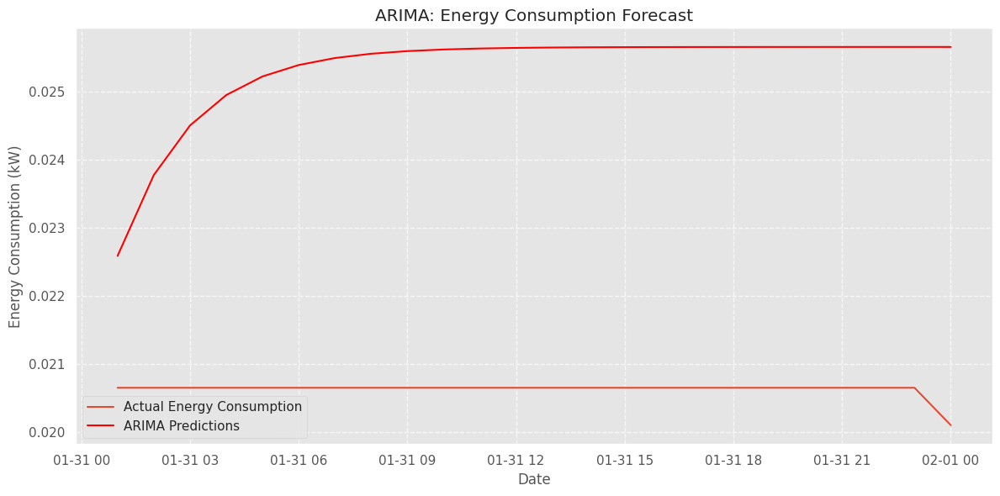

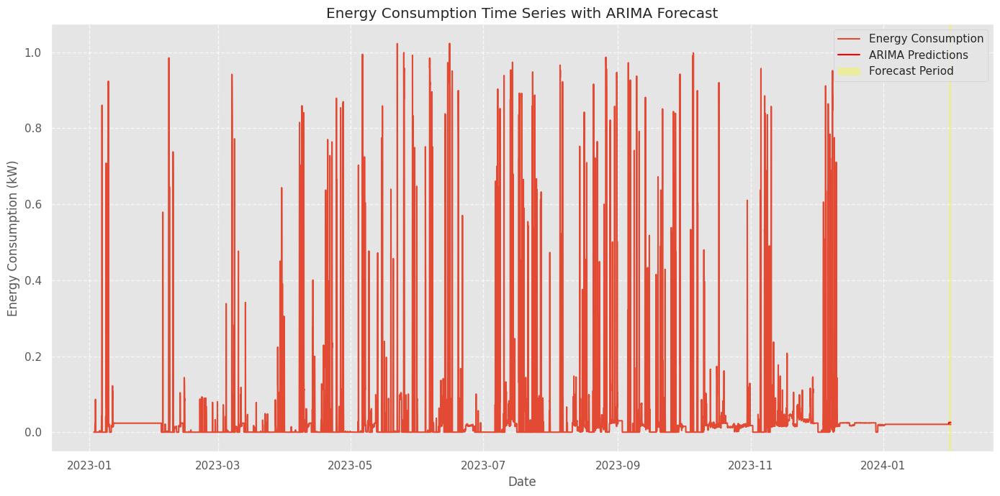

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Load energy data
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Preprocess data
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')
energy_df.set_index('Datetime', inplace=True)

# Convert non-numeric values to numeric
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Resample to hourly data for better forecasting
hourly_energy = energy_df['Total_Energy'].resample('h').mean()

# Fill any NaN values that might have been introduced during resampling
hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')

# Ensure the time series is complete and has no gaps
hourly_energy = hourly_energy.asfreq('h')
hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')

# Set parameters
n_test = 24  # Test on 24 hours of data
order = (1, 1, 1)  # ARIMA order (p,d,q)

# Make sure we have enough data
if len(hourly_energy) > n_test:
    # Split into train and test sets
    train = hourly_energy[:-n_test]
    test = hourly_energy[-n_test:]

    # Fit ARIMA model
    model = ARIMA(train, order=order)
    model_fit = model.fit()

    # Make predictions
    predictions = model_fit.forecast(steps=n_test)

    # Ensure predictions and test have the same index for plotting
    predictions = pd.Series(predictions, index=test.index)

    # Check for NaN values in test or predictions
    if np.isnan(test).any() or np.isnan(predictions).any():
        print("Warning: NaN values detected in test data or predictions")
        # Remove NaN values for RMSE calculation
        valid_indices = ~(np.isnan(test) | np.isnan(predictions))
        test_valid = test[valid_indices]
        pred_valid = predictions[valid_indices]

        if len(test_valid) > 0:
            rmse = sqrt(mean_squared_error(test_valid, pred_valid))
            print(f'ARIMA RMSE (on valid data points): {rmse:.4f}')
        else:
            print("No valid data points for RMSE calculation")
    else:
        # Calculate RMSE
        rmse = sqrt(mean_squared_error(test, predictions))
        print(f'ARIMA RMSE: {rmse:.4f}')

    # Plot results
    plt.figure(figsize=(12, 6))
    plt.plot(test.index, test, label='Actual Energy Consumption')
    plt.plot(predictions.index, predictions, color='red', label='ARIMA Predictions')
    plt.title('ARIMA: Energy Consumption Forecast')
    plt.xlabel('Date')
    plt.ylabel('Energy Consumption (kW)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Plot the entire time series with the forecast period highlighted
    plt.figure(figsize=(14, 7))
    plt.plot(hourly_energy.index, hourly_energy, label='Energy Consumption')
    plt.plot(predictions.index, predictions, color='red', label='ARIMA Predictions')
    plt.axvspan(test.index[0], test.index[-1], alpha=0.3, color='yellow', label='Forecast Period')
    plt.title('Energy Consumption Time Series with ARIMA Forecast')
    plt.xlabel('Date')
    plt.ylabel('Energy Consumption (kW)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
else:
    print(f"Not enough data for ARIMA modeling. Need at least {n_test+1} data points, but have {len(hourly_energy)}.")


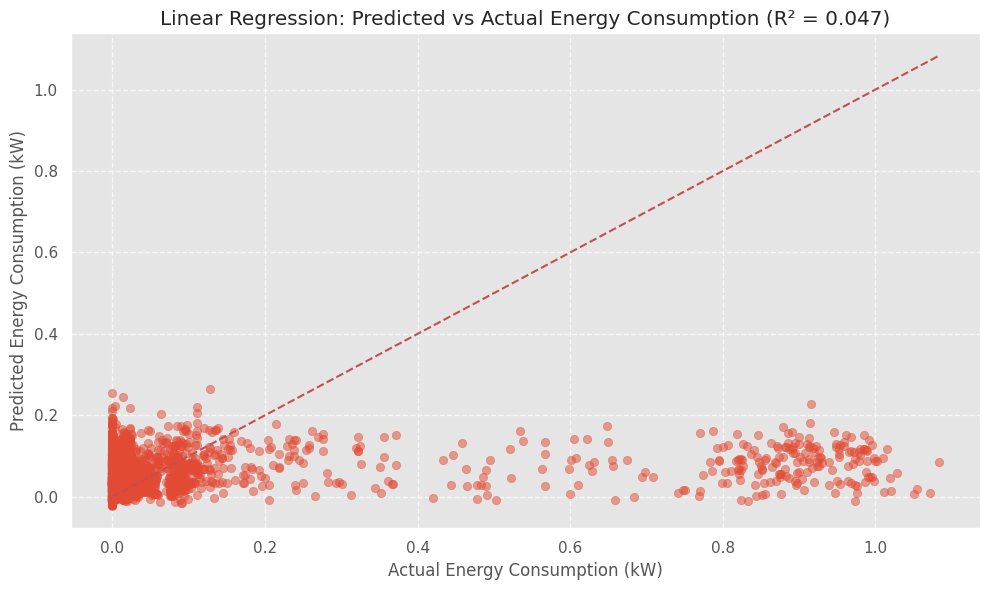

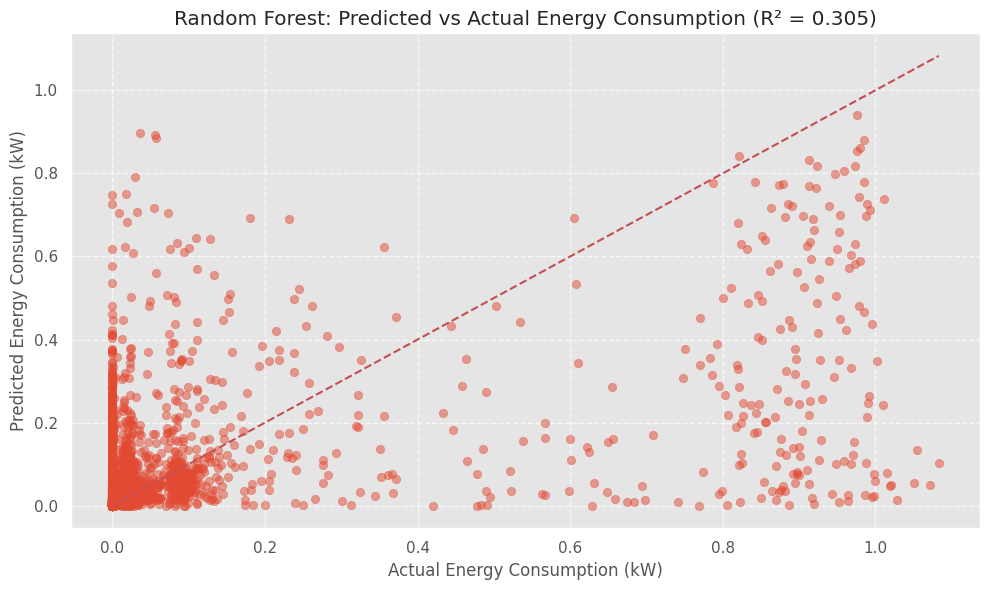

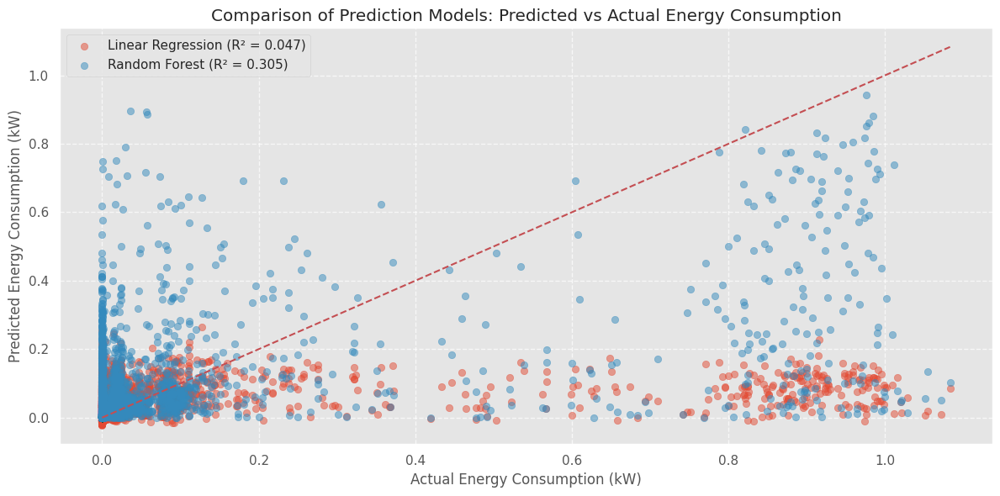

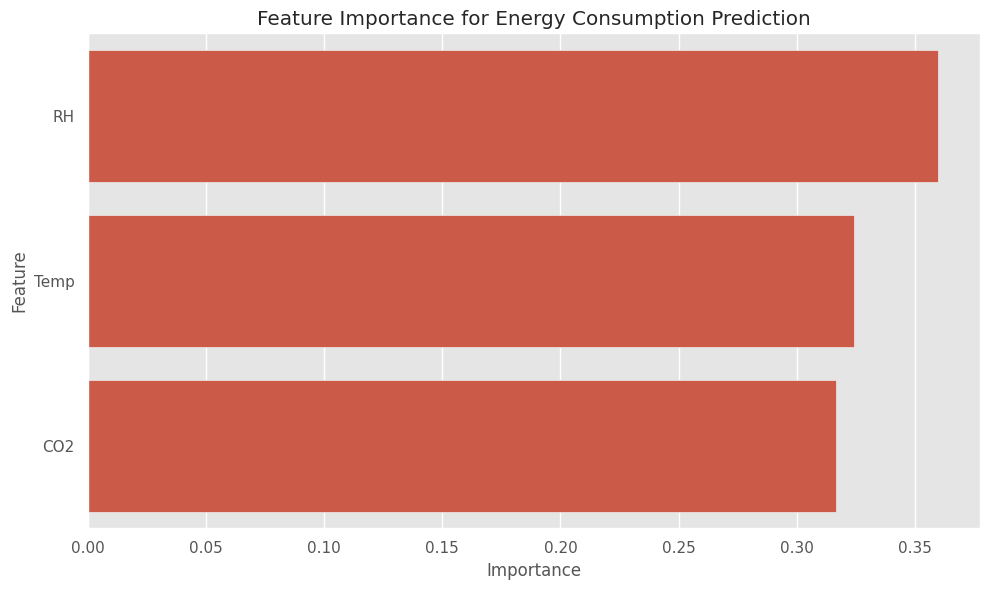

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load datasets
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Preprocess indoor data
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')
for col in ['CO2', 'Temp', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

# Preprocess energy data
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Sort and merge datasets
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))
merged_df = merged_df.dropna(subset=['CO2', 'Temp', 'RH', 'Total_Energy'])

# Define features and target
X = merged_df[['CO2', 'Temp', 'RH']]
y = merged_df['Total_Energy']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)

# Random Forest Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

# Calculate metrics
lr_r2 = r2_score(y_test, lr_pred)
rf_r2 = r2_score(y_test, rf_pred)
lr_rmse = np.sqrt(mean_squared_error(y_test, lr_pred))
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_pred))

# Plot Linear Regression predictions vs actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, lr_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title(f'Linear Regression: Predicted vs Actual Energy Consumption (R² = {lr_r2:.3f})')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot Random Forest predictions vs actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, rf_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title(f'Random Forest: Predicted vs Actual Energy Consumption (R² = {rf_r2:.3f})')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Compare both models
plt.figure(figsize=(12, 6))
plt.scatter(y_test, lr_pred, alpha=0.5, label=f'Linear Regression (R² = {lr_r2:.3f})')
plt.scatter(y_test, rf_pred, alpha=0.5, label=f'Random Forest (R² = {rf_r2:.3f})')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Comparison of Prediction Models: Predicted vs Actual Energy Consumption')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Feature importance for Random Forest
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Feature Importance for Energy Consumption Prediction')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


<ipython-input-38-0ce627476df9>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')
<ipython-input-38-0ce627476df9>:30: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA RMSE: 0.0048


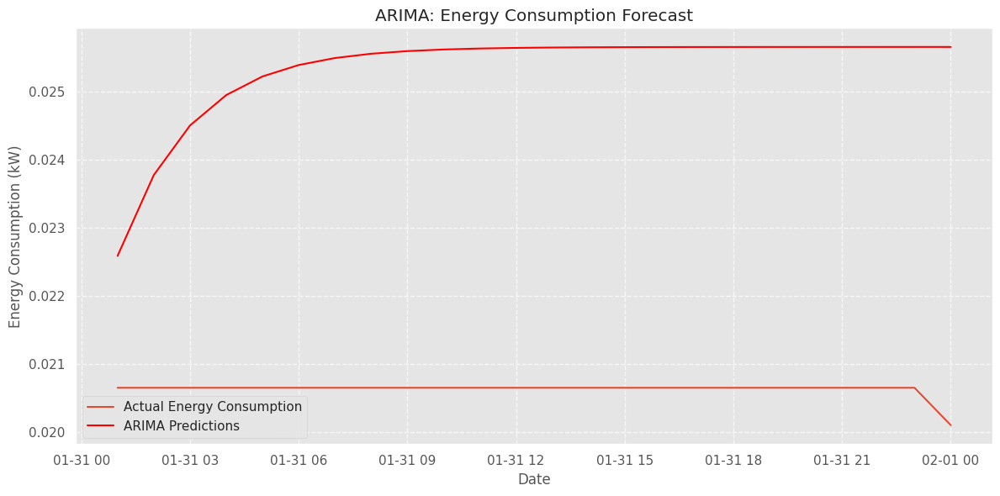

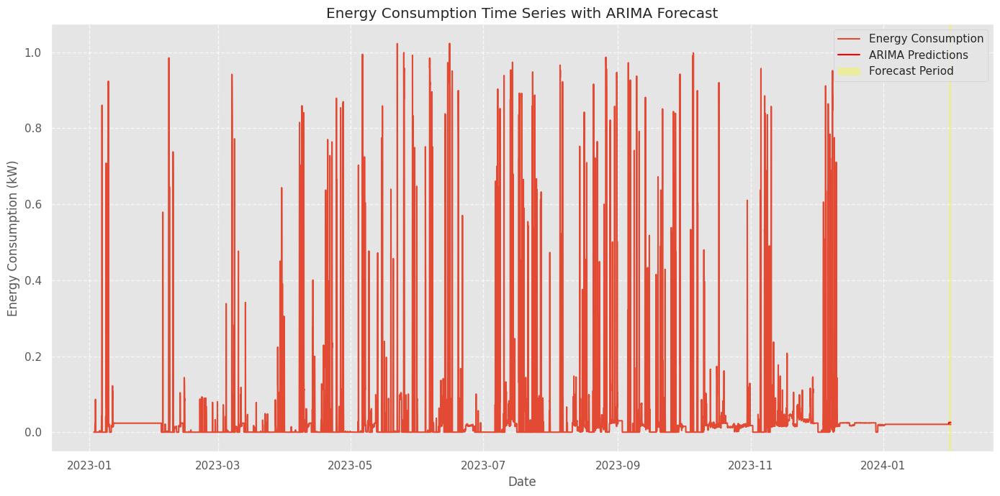

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Load and preprocess energy data
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')
energy_df.set_index('Datetime', inplace=True)

# Convert energy columns to numeric, replacing "No CT" with NaN
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

# Resample to hourly data
hourly_energy = energy_df['Total_Energy'].resample('h').mean()

# Fill any NaN values that might have been introduced during resampling
hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')

# Ensure the time series is complete and has no gaps
hourly_energy = hourly_energy.asfreq('h')
hourly_energy = hourly_energy.fillna(method='ffill').fillna(method='bfill')

# Set parameters
n_test = 24  # Test on 24 hours of data
order = (1, 1, 1)  # ARIMA order (p,d,q)

# Make sure we have enough data
if len(hourly_energy) > n_test:
    # Split into train and test sets
    train = hourly_energy[:-n_test]
    test = hourly_energy[-n_test:]

    # Fit ARIMA model
    model = ARIMA(train, order=order)
    model_fit = model.fit()

    # Make predictions
    predictions = model_fit.forecast(steps=n_test)

    # Ensure predictions and test have the same index for plotting
    predictions = pd.Series(predictions, index=test.index)

    # Check for NaN values in test or predictions
    if np.isnan(test).any() or np.isnan(predictions).any():
        print("Warning: NaN values detected in test data or predictions")
        # Remove NaN values for RMSE calculation
        valid_indices = ~(np.isnan(test) | np.isnan(predictions))
        test_valid = test[valid_indices]
        pred_valid = predictions[valid_indices]

        if len(test_valid) > 0:
            rmse = sqrt(mean_squared_error(test_valid, pred_valid))
            print(f'ARIMA RMSE (on valid data points): {rmse:.4f}')
        else:
            print("No valid data points for RMSE calculation")
    else:
        # Calculate RMSE
        rmse = sqrt(mean_squared_error(test, predictions))
        print(f'ARIMA RMSE: {rmse:.4f}')

    # Plot results
    plt.figure(figsize=(12, 6))
    plt.plot(test.index, test, label='Actual Energy Consumption')
    plt.plot(predictions.index, predictions, color='red', label='ARIMA Predictions')
    plt.title('ARIMA: Energy Consumption Forecast')
    plt.xlabel('Date')
    plt.ylabel('Energy Consumption (kW)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Plot the entire time series with the forecast period highlighted
    plt.figure(figsize=(14, 7))
    plt.plot(hourly_energy.index, hourly_energy, label='Energy Consumption')
    plt.plot(predictions.index, predictions, color='red', label='ARIMA Predictions')
    plt.axvspan(test.index[0], test.index[-1], alpha=0.3, color='yellow', label='Forecast Period')
    plt.title('Energy Consumption Time Series with ARIMA Forecast')
    plt.xlabel('Date')
    plt.ylabel('Energy Consumption (kW)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
else:
    print(f"Not enough data for ARIMA modeling. Need at least {n_test+1} data points, but have {len(hourly_energy)}.")


Linear Regression - R²: 0.0471, RMSE: 0.1536
Random Forest - R²: 0.3046, RMSE: 0.1313


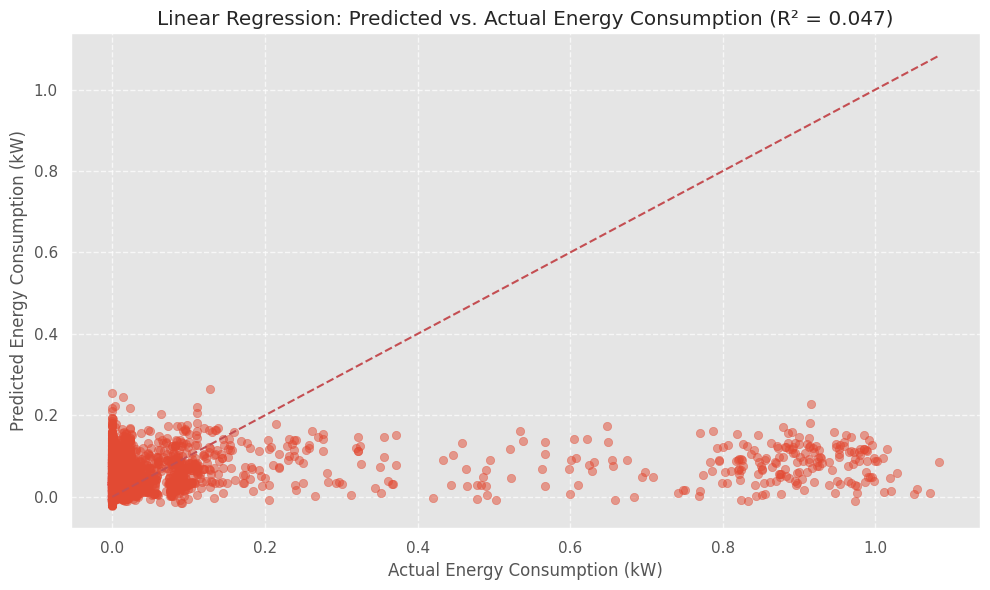

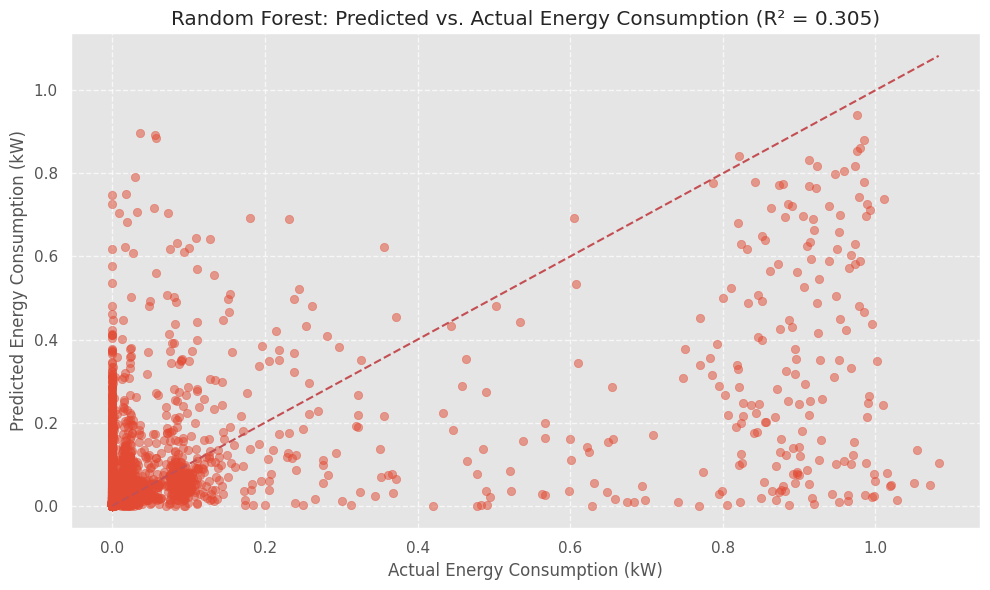

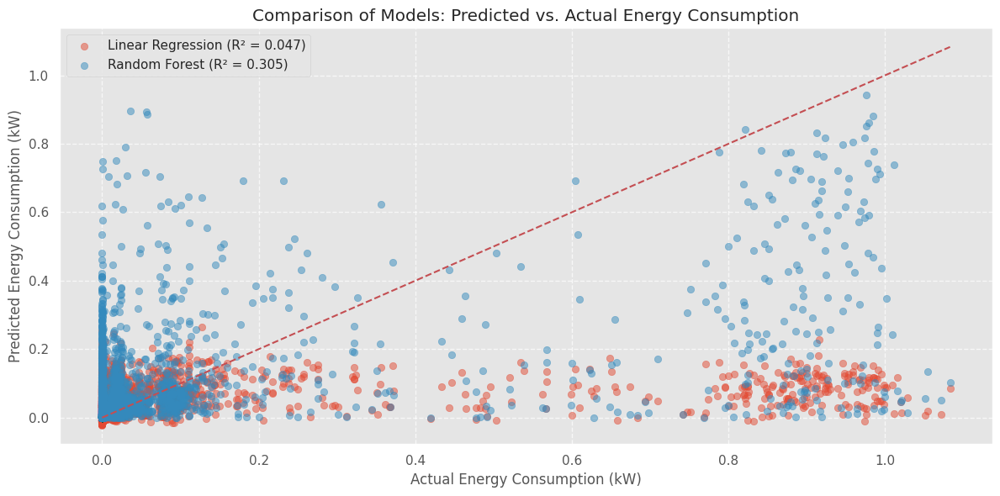

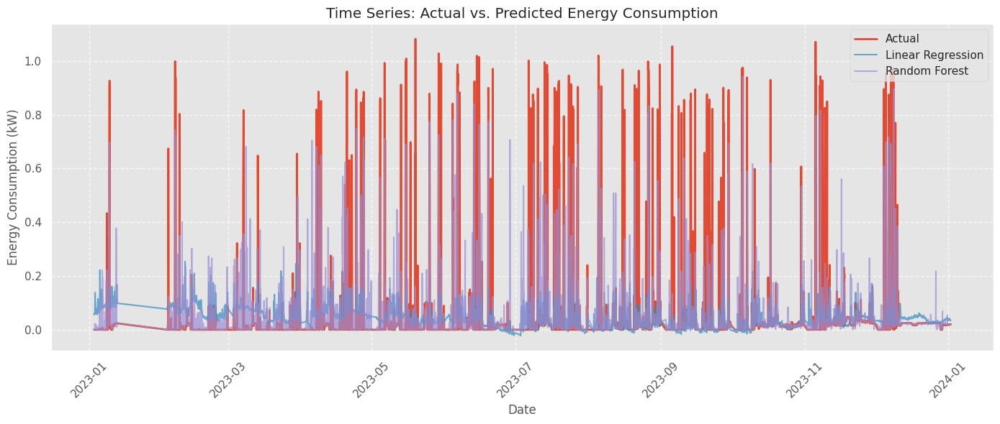

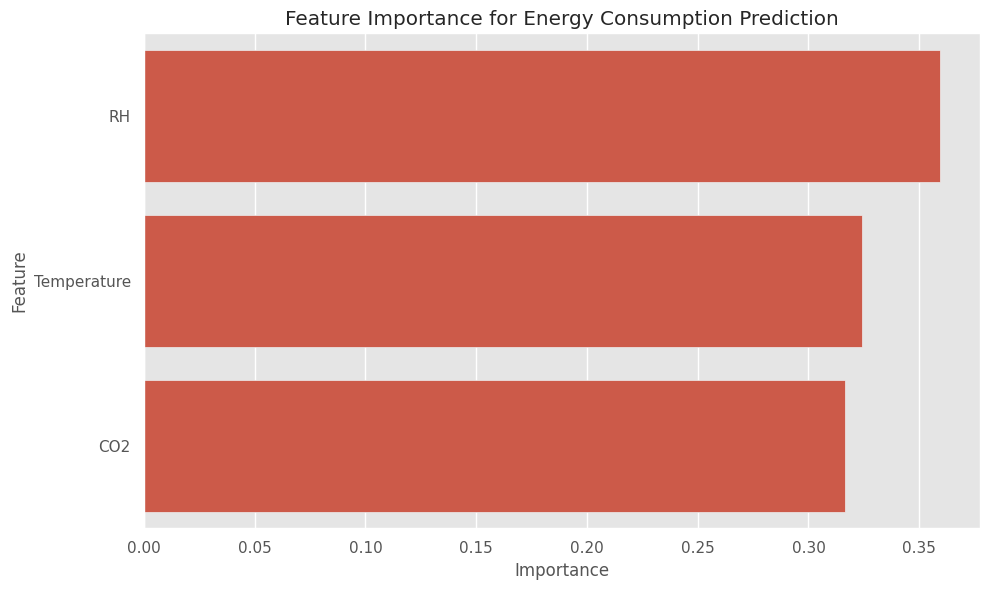

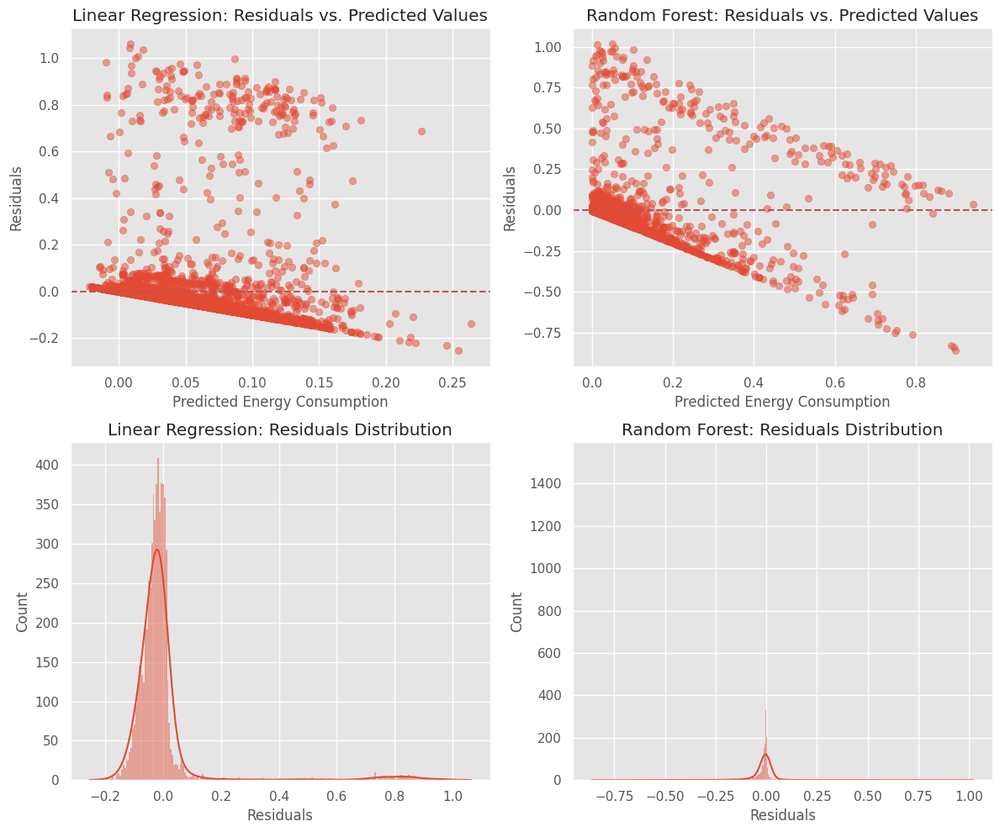

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Set a clean plotting style
plt.style.use('ggplot')

########################################
# 1. Load and Preprocess Indoor Air Quality Data
########################################
# Load the indoor air quality data
indoor_df = pd.read_excel('Indoor-Air-Quality.xlsx', sheet_name='PAoffice')

# Rename columns for clarity
indoor_df.columns = ['Date', 'Time', 'CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']

# Create a unified datetime column
indoor_df['Datetime'] = pd.to_datetime(indoor_df['Date'].astype(str) + ' ' + indoor_df['Time'].astype(str), errors='coerce')

# Convert measurement columns to numeric
for col in ['CO2', 'Temperature', 'Pressure', 'RH', 'DewPoint', 'AbsHumidity']:
    indoor_df[col] = pd.to_numeric(indoor_df[col], errors='coerce')

########################################
# 2. Load and Preprocess Energy Data
########################################
# Load the energy data
energy_df = pd.read_excel('ENERGYDATA.xlsx', sheet_name='ENERGYDATA')

# Rename columns for clarity
energy_df.columns = ['Datetime', 'Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']

# Convert datetime column
energy_df['Datetime'] = pd.to_datetime(energy_df['Datetime'], errors='coerce')

# Convert energy columns to numeric
for col in ['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']:
    energy_df[col] = pd.to_numeric(energy_df[col], errors='coerce')
energy_df.fillna(0, inplace=True)

# Calculate total energy consumption
energy_df['Total_Energy'] = energy_df[['Computer', 'Plug_Load', 'AC_Load', 'Light_Fan']].sum(axis=1)

########################################
# 3. Merge Datasets
########################################
# Sort both dataframes by datetime
indoor_df.sort_values('Datetime', inplace=True)
energy_df.sort_values('Datetime', inplace=True)

# Merge datasets using asof merge with a 5-minute tolerance
merged_df = pd.merge_asof(indoor_df, energy_df, on='Datetime', direction='nearest', tolerance=pd.Timedelta('5min'))

# Drop rows with missing values
merged_df = merged_df.dropna(subset=['CO2', 'Temperature', 'RH', 'Total_Energy'])

########################################
# 4. Build Linear Regression Model
########################################
# Define features and target
X = merged_df[['CO2', 'Temperature', 'RH']]
y = merged_df['Total_Energy']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train linear regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Make predictions
lr_pred = lr_model.predict(X_test)

# Evaluate model
lr_r2 = r2_score(y_test, lr_pred)
lr_rmse = np.sqrt(mean_squared_error(y_test, lr_pred))

print(f"Linear Regression - R²: {lr_r2:.4f}, RMSE: {lr_rmse:.4f}")

########################################
# 5. Build Random Forest Model
########################################
# Train Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
rf_pred = rf_model.predict(X_test)

# Evaluate model
rf_r2 = r2_score(y_test, rf_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_pred))

print(f"Random Forest - R²: {rf_r2:.4f}, RMSE: {rf_rmse:.4f}")

########################################
# 6. Visualize Predictions vs. Actual Values
########################################
# Plot 1: Linear Regression - Predicted vs. Actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, lr_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title(f'Linear Regression: Predicted vs. Actual Energy Consumption (R² = {lr_r2:.3f})')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot 2: Random Forest - Predicted vs. Actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, rf_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title(f'Random Forest: Predicted vs. Actual Energy Consumption (R² = {rf_r2:.3f})')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot 3: Comparison of Models
plt.figure(figsize=(12, 6))
plt.scatter(y_test, lr_pred, alpha=0.5, label=f'Linear Regression (R² = {lr_r2:.3f})')
plt.scatter(y_test, rf_pred, alpha=0.5, label=f'Random Forest (R² = {rf_r2:.3f})')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Comparison of Models: Predicted vs. Actual Energy Consumption')
plt.xlabel('Actual Energy Consumption (kW)')
plt.ylabel('Predicted Energy Consumption (kW)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot 4: Time Series of Actual vs. Predicted Energy Consumption
# Create a dataframe with test indices and predictions
test_indices = X_test.index
results_df = pd.DataFrame({
    'Datetime': merged_df.loc[test_indices, 'Datetime'],
    'Actual': y_test,
    'Linear_Regression': lr_pred,
    'Random_Forest': rf_pred
})
results_df = results_df.sort_values('Datetime')

# Plot time series
plt.figure(figsize=(14, 6))
plt.plot(results_df['Datetime'], results_df['Actual'], label='Actual', linewidth=2)
plt.plot(results_df['Datetime'], results_df['Linear_Regression'], label='Linear Regression', alpha=0.7)
plt.plot(results_df['Datetime'], results_df['Random_Forest'], label='Random Forest', alpha=0.7)
plt.title('Time Series: Actual vs. Predicted Energy Consumption')
plt.xlabel('Date')
plt.ylabel('Energy Consumption (kW)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 5: Feature Importance (Random Forest)
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Feature Importance for Energy Consumption Prediction')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

# Plot 6: Residuals Analysis
plt.figure(figsize=(12, 10))

# Linear Regression Residuals
plt.subplot(2, 2, 1)
residuals_lr = y_test - lr_pred
plt.scatter(lr_pred, residuals_lr, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Linear Regression: Residuals vs. Predicted Values')
plt.xlabel('Predicted Energy Consumption')
plt.ylabel('Residuals')

# Random Forest Residuals
plt.subplot(2, 2, 2)
residuals_rf = y_test - rf_pred
plt.scatter(rf_pred, residuals_rf, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Random Forest: Residuals vs. Predicted Values')
plt.xlabel('Predicted Energy Consumption')
plt.ylabel('Residuals')

# Linear Regression Residuals Distribution
plt.subplot(2, 2, 3)
sns.histplot(residuals_lr, kde=True)
plt.title('Linear Regression: Residuals Distribution')
plt.xlabel('Residuals')

# Random Forest Residuals Distribution
plt.subplot(2, 2, 4)
sns.histplot(residuals_rf, kde=True)
plt.title('Random Forest: Residuals Distribution')
plt.xlabel('Residuals')

plt.tight_layout()
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')